# TODO
- Gradient Boost Classifier
- AUC ROC, F1

## Mobilität
- Mobilität mit GSM
- Mobilität mit Sensor Wifi (gekürzte MAC)

## Gerätemodell
- Nach Sensor
- Wennn Sensor nicht verfügbar, dann nach Modell
- Welche Modelle bei populären Zeiten da -> iPhone 6(+,S)
- **Das wird aber wieder echt wenig Begegnungen bringen**

## Neue Features
- Dynamic Time Warping

# NAMING

## FREQUENCY
- **daily** -> encounters per day
- **busy** -> encounters per hour, on most busy day
- **exp** -> experiment; actual data of the most popular hours on the busiest day

## MOBILITY
- **high** -> high mobility
- **mid** -> medium mobility
- **low** -> low/no mobility
- **all** -> all devices, regardless of mobility

## TYPE
- **ble** -> Bluetooth
- **gsm** -> GSM
- **sensor** -> Sensor Wifi
- **wifi** -> Wifi

Dataframes, Arrays, ... -> [...]\_[TYPE]\_[FREQUENCY]\_[MOBILITY]\_[...]

In [174]:
from __future__ import division
import collections
from datetime import datetime
from datetime import timedelta
from decimal import Decimal
import geopy.distance as geo
import itertools
import json
import math
import numpy as np
import os
import pandas as pd
import pickle
import pydot
import scipy.stats as stats
import scipy.spatial.distance as dist
from sklearn.model_selection import KFold
from sklearn import tree
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.model_selection import train_test_split
import statistics

%matplotlib inline
import matplotlib
import matplotlib.cm as cm
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
#font = {'size' : 14}
#matplotlib.rc('font', **font)
matplotlib.rcParams["pdf.fonttype"] = 42 # TrueType
matplotlib.rcParams["ps.fonttype"] = 42 # TrueType
matplotlib.rcParams["lines.linewidth"] = 3
matplotlib.rcParams["lines.markersize"] = 9
matplotlib.rcParams["figure.figsize"] = [15, 10]

# parquet files opened as byte arrays, transform to string
def b2s(df):
    out = df.copy()
    str_df = df.select_dtypes([np.object])
    str_df = str_df.stack().str.decode('utf-8').unstack()
    for col in str_df:
        out[col] = str_df[col]
    return out

# add date column to dataframes
def date_frame(df):
    out = df.copy()
    out['date'] = out['timestamp'].apply(lambda dt: pd.Timestamp(dt.date()))
    return out

# clearner plotting
# https://github.com/azaitsev/millify
def millify(n, pos):
    millnames = ['', 'k', 'M', 'B', 'T', 'P', 'E', 'Z', 'Y']
    n = float(n)
    millidx = max(0, min(len(millnames) - 1,
                         int(math.floor(0 if n == 0 else math.log10(abs(n)) / 3))))
    result = '{:.{precision}f}'.format(n / 10**(3 * millidx), precision=2)
    d = Decimal(result)
    result = d.quantize(Decimal(1)) if d == d.to_integral() else d.normalize()
    return '{0} {dx}'.format(result, dx=millnames[millidx])

def bytify(n):
    millnames = ['B', 'KB', 'MB', 'GB']
    n = float(n)
    millidx = max(0, min(len(millnames) - 1,
                         int(math.floor(0 if n == 0 else math.log10(abs(n)) / 3))))
    result = '{:.{precision}f}'.format(n / 10**(3 * millidx), precision=2)
    d = Decimal(result)
    result = d.quantize(Decimal(1)) if d == d.to_integral() else d.normalize()
    return '{0} {dx}'.format(result, dx=millnames[millidx])

# compute distance per day between encountered APs
def dailydistance(dic,df,devices):
    print('initialize')
    dic = {}
    for device in devices:
        dic[device]={}
        for day in timespan:
            dic[device][day] = {
                "APs":[],
                "Distance":0
            }

    print('fill ecountered APs')
    for device in devices:
        for day in timespan:
            records = df[
                (df['device_id'] == device) & (df['date'] == day)
            ].to_records()
            for rec in records:
                # save coordinates of AP
                dic[device][day]["APs"] += [(rec[4],rec[5])]

    print('compute distance')
    for device in dic:
        for day in dic[device]:
            ap_list = dic[device][day]["APs"]
            if len(ap_list) > 0:
                prev = ap_list[0]
            for b in ap_list:
                dic[device][day]["Distance"] += geo.distance(prev,b).meters
                prev = b
                
    return dic

# compute unique APs encountered by device per day
def dailyuniqueaps(dic,df,id_field,devices):
    dic = {}
    for device in devices:
        dic[device]={}
        for day in timespan:
            dic[device][day] = {
                "min_time" : None,
                "max_time" : None,
                "APs" : None
            }
            records = df[(df['device_id'] == device) & (df['date'] == day)]
            dic[device][day]["min_time"] = records['timestamp'].min()
            dic[device][day]["max_time"] = records['timestamp'].max()
            dic[device][day]["APs"] = records[id_field].unique()
    return dic

def day_from_timestamp(x):
    return pd.datetime.strftime(x, '%Y-%m-%d')

'''
df:  pandas Dataframe [timestamp, device_id, MAC, RSSI] with all measurements per iteration
out: pandas Dataframe [timestamp, device_id, MAC, RSSI] with only the highest measurement per iteration
'''
def max_entry_per_iteration(df):
    df_numpy = df.to_numpy()
    data = [[]]
    i_interest = [0]
    for i in range(1, df_numpy.shape[0]):
        if df_numpy[i][1] == df_numpy[i-1][1]:
            if df_numpy[i][0] - df_numpy[i-1][0] > pd.Timedelta(minutes=2):
                i_interest += [i]
        else:
            i_interest += [i]
    for i in range(len(i_interest)):
        tmp_begin = i_interest[i]
        tmp_end = df_numpy.shape[0]
        if i < len(i_interest)-1:
            tmp_end = i_interest[i+1]
        tmp = df_numpy[tmp_begin:tmp_end,:]
        m = 0
        v = tmp[0][3]
        for row in range(tmp.shape[0]):
            if tmp[row][3] > v:
                v = tmp[row][3]
                m = row
        data += [tmp[m]]
    data = data[1:]
    data_np = np.array(data)
    out = pd.DataFrame({'timestamp':data_np[:,0],
                        'device_id':data_np[:,1],
                        'mac':data_np[:,2],
                        'rssi':data_np[:,3]
                       })
    return(out)
                
def myround(x, prec=0, base=.05):
    return (base * (np.array(x) / base).round()).round(prec)

log_path = os.path.join(os.getcwd(), "guided-research-results/offscreen.log")
def log(message, file=log_path):
    with open(file, 'a') as f:
        f.write(datetime.now().isoformat() + '\t' + message + '\n')
    
# set options and variables
pd.set_option('display.float_format', lambda x: '%.3f' % x)

result_path = os.path.join(os.getcwd(), "guided-research-results")
path_data_collection = os.path.join(os.getcwd(), "data-collection")

month_ticks = [0,30,61,91,122,153]
month_labels = ['2018-03','2018-04','2018-05','2018-06','2018-07','2018-08']

timespan = pd.date_range(start=pd.to_datetime('2018-03-01'), end=pd.to_datetime('2018-08-31'))

# encounter = same beacon registered in t-dt/2,t+dt/2 interval
timespans = [5,10,30,45,90,180,360]

#debugging
#%pdb

# 1. Raw Data Analysis

## 1.1 Read and clean data

Sensor readings.

In [305]:
data_accelerometer = b2s(pd.read_parquet(os.path.join(path_data_collection, "accelerometer_5.parquet.snappy")))
data_accelerometer = data_accelerometer[pd.notnull(data_accelerometer.device_id)]

In [306]:
data_barometer = b2s(pd.read_parquet(os.path.join(path_data_collection, "barometer.parquet.snappy")))
data_barometer = data_barometer[pd.notnull(data_barometer.device_id)]

In [4]:
data_bluetooth = b2s(pd.read_parquet(os.path.join(path_data_collection, "bluetooth.parquet.snappy")))
data_bluetooth = data_bluetooth[data_bluetooth.bt_address != "disabled"]
data_bluetooth = data_bluetooth[pd.notnull(data_bluetooth.device_id)]

In [308]:
#data_cdma = b2s(pd.read_parquet(os.path.join(path_data_collection, "cdma.parquet.snappy")))
#data_cdma = data_cdma[pd.notnull(data_cdma.device_id)]

In [309]:
data_gravity = b2s(pd.read_parquet(os.path.join(path_data_collection, "gravity.parquet.snappy")))
data_gravity = data_gravity[pd.notnull(data_gravity.device_id)]

In [5]:
data_gsm = b2s(pd.read_parquet(os.path.join(path_data_collection, "gsm.parquet.snappy")))
data_gsm = data_gsm[pd.notnull(data_gsm.device_id)]
# transform signal_strength field to dB
data_gsm['rssi'] = -113 + 2*data_gsm['signal_strength']

In [311]:
data_gsm_neighbor = b2s(pd.read_parquet(os.path.join(path_data_collection, "gsm_neighbor.parquet.snappy")))
data_gsm_neighbor = data_gsm_neighbor[pd.notnull(data_gsm_neighbor.device_id)]

In [312]:
#data_gyroscope = b2s(pd.read_parquet(os.path.join(path_data_collection, "gyroscope.parquet.snappy")))
#data_gyroscope = data_gyroscope[pd.notnull(data_gyroscope.device_id)]

In [313]:
#data_light = b2s(pd.read_parquet(os.path.join(path_data_collection, "light.parquet.snappy")))
#data_light = data_light[pd.notnull(data_light.device_id)]

In [314]:
#data_linear_accelerometer = b2s(pd.read_parquet(os.path.join(path_data_collection, "linear_accelerometer.parquet.snappy")))
#data_linear_accelerometer = data_linear_accelerometer[pd.notnull(data_linear_accelerometer.device_id)]

In [315]:
data_locations = b2s(pd.read_parquet(os.path.join(path_data_collection, "locations.parquet.snappy")))
data_locations = data_locations[pd.notnull(data_locations.device_id)]

In [316]:
data_magnetometer = b2s(pd.read_parquet(os.path.join(path_data_collection, "magnetometer_1.parquet.snappy")))
data_magnetometer = data_magnetometer[pd.notnull(data_magnetometer.device_id)]

In [317]:
data_network = b2s(pd.read_parquet(os.path.join(path_data_collection, "network.parquet.snappy")))
data_network = data_network[pd.notnull(data_network.device_id)]

In [318]:
data_network_traffic = b2s(pd.read_parquet(os.path.join(path_data_collection, "network_traffic.parquet.snappy")))
data_network_traffic = data_network_traffic[pd.notnull(data_network_traffic.device_id)]

In [319]:
#data_proximity = b2s(pd.read_parquet(os.path.join(path_data_collection, "proximity.parquet.snappy")))
#data_proximity = data_proximity[pd.notnull(data_proximity.device_id)]

In [320]:
#data_rotation = b2s(pd.read_parquet(os.path.join(path_data_collection, "rotation.parquet.snappy")))
#data_rotation = data_rotation[pd.notnull(data_rotation.device_id)]

In [7]:
# connected WiFi
data_sensor = b2s(pd.read_parquet(os.path.join(path_data_collection, "sensor_wifi.parquet.snappy")))
data_sensor = data_sensor[pd.notnull(data_sensor.bssid)]
data_sensor = data_sensor[pd.notnull(data_sensor.device_id)]
data_sensor = data_sensor[data_sensor.bssid != "00:00:00:00:00:00"]
data_sensor = data_sensor[data_sensor.ssid != "<unknown ssid>"]
# remove last digit from bssid if eduroam router, as broadcast mac is not the same as connected mac
data_sensor.loc[data_sensor.ssid == '\\\"eduroam\\\"', 'bssid'] = data_sensor.where(data_sensor.ssid == '\\\"eduroam\\\"').bssid.str[:-1]

In [322]:
#data_telephony = b2s(pd.read_parquet(os.path.join(path_data_collection, "telephony.parquet.snappy")))
#data_telephony = data_telephony[pd.notnull(data_telephony.device_id)]

In [8]:
# available WiFi connections not connected to
data_wifi = b2s(pd.read_parquet(os.path.join(path_data_collection, "wifi.parquet.snappy")))
data_wifi = data_wifi[pd.notnull(data_wifi.bssid)]
data_wifi = data_wifi[pd.notnull(data_wifi.device_id)]

Data about devices and known WiFi/Bluetooth locations.

In [9]:
devices = b2s(pd.read_parquet(os.path.join(path_data_collection, "aware_device.parquet.snappy")))

In [10]:
data_beacons = pd.read_csv(os.path.join(path_data_collection, "ble-beacons-location.csv"),sep=";")
data_beacons = data_beacons[pd.notnull(data_beacons.mac)]

In [11]:
data_eduroam = pd.read_csv(os.path.join(path_data_collection, "eduroam.csv"),sep=";")
data_eduroam = data_eduroam[pd.notnull(data_eduroam['mac'])]
data_eduroam = data_eduroam[pd.notnull(data_eduroam['lat'])]
data_eduroam['mac_short'] = data_eduroam.mac.str[:-1]

### 1.1.1 Remove Sensor Readings from Unknown Devices

In [ ]:
unique = {}
unique['devices'] = devices['device_id'].unique()
unique['data_accelerometer'] = data_accelerometer['device_id'].unique()
unique['data_barometer'] = data_barometer['device_id'].unique()
unique['data_bluetooth'] = data_bluetooth['device_id'].unique()
#unique['data_cdma'] = data_cdma['device_id'].unique()
unique['data_gravity'] = data_gravity['device_id'].unique()
unique['data_gsm'] = data_gsm['device_id'].unique()
unique['data_gsm_neighbor'] = data_gsm_neighbor['device_id'].unique()
#unique['data_gyroscope'] = data_gyroscope['device_id'].unique()
#unique['data_light'] = data_light['device_id'].unique()
#unique['data_linear_accelerometer'] = data_linear_accelerometer['device_id'].unique()
unique['data_locations'] = data_locations['device_id'].unique()
unique['data_magnetometer'] = data_magnetometer['device_id'].unique()
unique['data_network'] = data_network['device_id'].unique()
unique['data_network_traffic'] = data_network_traffic['device_id'].unique()
#unique['data_proximity'] = data_proximity['device_id'].unique()
#unique['data_rotation'] = data_rotation['device_id'].unique()
unique['data_sensor'] = data_sensor['device_id'].unique()
#unique['data_telephony'] = data_telephony['device_id'].unique()
unique['data_wifi'] = data_wifi['device_id'].unique()

In [ ]:
#for u in unique:
#    for d in unique[u]:
#        if d not in unique['devices']:
#            print(u, ': ', d)
#            
#data_telephony[data_telephony['device_id'] == 'cb3413fa-6444-4f8d-af07-22be1233d3c5'].shape[0]

In [ ]:
#data_telephony = data_telephony[data_telephony['device_id'] != 'cb3413fa-6444-4f8d-af07-22be1233d3c5']

### 1.1.2 Create table where timestamp of sensor reading is rounded to day, as to be able to cluster per day and not distinct timestamps.

In [333]:
day_accelerometer = date_frame(data_accelerometer[['device_id','timestamp']])

In [334]:
day_barometer = date_frame(data_barometer[['device_id','timestamp']])

In [335]:
day_bluetooth = date_frame(data_bluetooth[['device_id','timestamp']])

In [ ]:
#day_cdma = date_frame(data_cdma[['device_id','timestamp']])

In [336]:
day_gravity = date_frame(data_gravity[['device_id','timestamp']])

In [337]:
day_gsm = date_frame(data_gsm[['device_id','timestamp']])

In [338]:
day_gsm_neighbor = date_frame(data_gsm_neighbor[['device_id','timestamp']])

In [ ]:
#day_gyroscope = date_frame(data_gyroscope[['device_id','timestamp']])

In [ ]:
#day_light = date_frame(data_light[['device_id','timestamp']])

In [ ]:
#day_linear_accelerometer = date_frame(data_linear_accelerometer[['device_id','timestamp']])

In [339]:
day_locations = date_frame(data_locations[['device_id','timestamp']])

In [340]:
day_magnetometer = date_frame(data_magnetometer[['device_id','timestamp']])

In [341]:
day_network = date_frame(data_network[['device_id','timestamp']])

In [342]:
day_network_traffic = date_frame(data_network_traffic[['device_id','timestamp']])

In [ ]:
#day_proximity = date_frame(data_proximity[['device_id','timestamp']])

In [ ]:
#day_rotation = date_frame(data_rotation[['device_id','timestamp']])

In [343]:
day_sensor = date_frame(data_sensor[['device_id','timestamp']])

In [ ]:
#day_telephony = date_frame(data_telephony[['device_id','timestamp']])

In [344]:
day_wifi = date_frame(data_wifi[['device_id','timestamp']])

## 1.2 Overview Recorded Data

The following data seems to be useless and will not be used for the proximity analysis:
- CDMA
- Gyroscope
- Light
- Linear Accelerometer
- Proximity
- Rotation
- Telephony

### 1.2.1 Records/minute by sensor type

While the frequency of sensor readings is the same for all the sensors but the accelerometer, the number of data points collected per reading differs widely.

In [52]:
records = {}
records['Accelerometer'] = {'min': data_accelerometer.timestamp.min(),
                            'max': data_accelerometer.timestamp.max(),
                            'count': data_accelerometer.shape[0]
                           }
records['Barometer'] = {'min': data_barometer.timestamp.min(),
                        'max': data_barometer.timestamp.max(),
                        'count': data_barometer.shape[0]
                       }
records['Bluetooth'] = {'min': data_bluetooth.timestamp.min(),
                        'max': data_bluetooth.timestamp.max(),
                        'count': data_bluetooth.shape[0]
                       }
#records['CDMA'] = {'min': data_cdma.timestamp.min(),
#                        'max': data_cdma.timestamp.max(),
#                        'count': data_cdma.shape[0]
#                       }
records['Gravity'] = {'min': data_gravity.timestamp.min(),
                      'max': data_gravity.timestamp.max(),
                      'count': data_gravity.shape[0]
                     }
records['GSM'] = {'min': data_gsm.timestamp.min(),
                  'max': data_gsm.timestamp.max(),
                  'count': data_gsm.shape[0]
                 }
records['GSM Neighbor'] = {'min': data_gsm_neighbor.timestamp.min(),
                           'max': data_gsm_neighbor.timestamp.max(),
                           'count': data_gsm_neighbor.shape[0]
                          }
#records['Gyroscope'] = {'min': data_gyroscope.timestamp.min(),
#                             'max': data_gyroscope.timestamp.max(),
#                             'count': data_gyroscope.shape[0]
#                            }
#records['Light'] = {'min': data_light.timestamp.min(),
#                         'max': data_light.timestamp.max(),
#                         'count': data_light.shape[0]
#                        }
#records['Linear Accelerometer'] = {'min': data_linear_accelerometer.timestamp.min(),
#                                        'max': data_linear_accelerometer.timestamp.max(),
#                                        'count': data_linear_accelerometer.shape[0]
#                                       }
records['Locations'] = {'min': data_locations.timestamp.min(),
                        'max': data_locations.timestamp.max(),
                        'count': data_locations.shape[0]
                       }
records['Magnetometer'] = {'min': data_magnetometer.timestamp.min(),
                           'max': data_magnetometer.timestamp.max(),
                           'count': data_magnetometer.shape[0]
                          }
records['Network'] = {'min': data_network.timestamp.min(),
                      'max': data_network.timestamp.max(),
                      'count': data_network.shape[0]
                     }
records['Network Traffic'] = {'min': data_network_traffic.timestamp.min(),
                              'max': data_network_traffic.timestamp.max(),
                              'count': data_network_traffic.shape[0]
                             }
#records['Proximity'] = {'min': data_proximity.timestamp.min(),
#                             'max': data_proximity.timestamp.max(),
#                             'count': data_proximity.shape[0]
#                            }
#records['Rotation'] = {'min': data_rotation.timestamp.min(),
#                            'max': data_rotation.timestamp.max(),
#                            'count': data_rotation.shape[0]
#                           }
records['Sensor Wifi'] = {'min': data_sensor.timestamp.min(),
                          'max': data_sensor.timestamp.max(),
                          'count': data_sensor.shape[0]
                         }
#records['Telephony'] = {'min': data_telephony.timestamp.min(),
#                             'max': data_telephony.timestamp.max(),
#                             'count': data_telephony.shape[0]
#                            }
records['Wifi'] = {'min': data_wifi.timestamp.min(),
                   'max': data_wifi.timestamp.max(),
                   'count': data_wifi.shape[0]
                  }

In [53]:
rate = {}
for r in records:
    dt = (records[r]['max']-records[r]['min']).round('12h')
    dt_rounded = dt.days + dt.seconds/(24*3600)
    rate[r] = records[r]['count']//dt_rounded

In [ ]:
#rate = {sensor: entries for sensor, entries in rate.items() if entries > np.median(list(rate.values()))}
#rate = collections.OrderedDict(sorted(rate.items(), key=lambda kv: kv[1]))

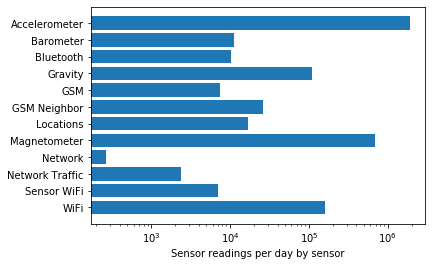

In [54]:
fig, ax = plt.subplots()
ax.barh(range(len(rate)), rate.values(), align='center')
ax.set_yticks(range(len(rate)))
ax.set_yticklabels(rate.keys())
ax.invert_yaxis()  # labels read top-to-bottom
ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(millify))
ax.set_xscale("log", nonposx='clip')
ax.set_xlabel('Sensor readings per day by sensor')


fig.savefig("guided-research-results/sensor-readings_perday_barplot.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [55]:
sensors = {}
for k in records.keys():
    sensors[k] = {}
        
for day in timespan:
    sensors['Accelerometer'][day] = day_accelerometer[day_accelerometer['date'] == day].shape[0]
    sensors['Barometer'][day] = day_barometer[day_barometer['date'] == day].shape[0]
    sensors['Bluetooth'][day] = day_bluetooth[day_bluetooth['date'] == day].shape[0]
#    sensors['CDMA'][day] = day_cdma[day_cdma['date'] == day].shape[0]
    sensors['Gravity'][day] = day_gravity[day_gravity['date'] == day].shape[0]
    sensors['GSM'][day] = day_gsm[day_gsm['date'] == day].shape[0]
    sensors['GSM Neighbor'][day] = day_gsm_neighbor[day_gsm_neighbor['date'] == day].shape[0]
#    sensors['Gyroscope'][day] = day_gyroscope[day_gyroscope['date'] == day].shape[0]
#    sensors['Light'][day] = day_light[day_light['date'] == day].shape[0]
#    sensors['Linear Accelerometer'][day] = day_linear_accelerometer[day_linear_accelerometer['date'] == day].shape[0]
    sensors['Locations'][day] = day_locations[day_locations['date'] == day].shape[0]
    sensors['Magnetometer'][day] = day_magnetometer[day_magnetometer['date'] == day].shape[0]
    sensors['Network'][day] = day_network[day_network['date'] == day].shape[0]
    sensors['Network Traffic'][day] = day_network_traffic[day_network_traffic['date'] == day].shape[0]
#    sensors['Proximity'][day] = day_proximity[day_proximity['date'] == day].shape[0]
#    sensors['Rotation'][day] = day_rotation[day_rotation['date'] == day].shape[0]
    sensors['Sensor Wifi'][day] = day_sensor[day_sensor['date'] == day].shape[0]
#    sensors['Telephony'][day] = day_telephony[day_telephony['date'] == day].shape[0]
    sensors['Wifi'][day] = day_wifi[day_wifi['date'] == day].shape[0]

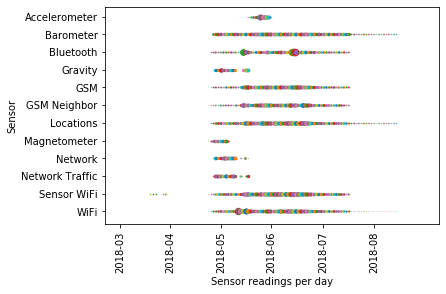

In [56]:
fig, ax = plt.subplots()

d = -1
for sensor in sensors:
    d += 1
    i = 0
    for day in timespan:
        normalized = 5*sensors[sensor][day]/(rate[sensor]+1)
        ax.scatter(i, d, normalized)
        i += 1    
    
ax.set_yticks(range(len(sensors.keys())))
ax.set_yticklabels(sensors.keys())
ax.set_ylabel('Sensor')
ax.invert_yaxis()
    
ax.set_xticks(month_ticks)
ax.set_xticklabels(month_labels,rotation='vertical')
ax.set_xlabel('Sensor readings per day')
    
fig.savefig("guided-research-results/sensor_readings_perday_bubbleplot.pdf", format="pdf", bbox_inches="tight")
plt.show()

### 1.2.2 Data Size

In [57]:
columns = ['Sensor','Readings','Size in Memory']
content = [
    ('Accelerometer',data_accelerometer.size,bytify(data_accelerometer.memory_usage(deep=True).sum())),
    ('Barometer',data_barometer.size,bytify(data_barometer.memory_usage(deep=True).sum())),
    ('Bluetooth',data_bluetooth.size,bytify(data_bluetooth.memory_usage(deep=True).sum())),
#    ('CDMA',data_cdma.size,bytify(data_cdma.memory_usage(deep=True).sum())),
    ('Gravity',data_gravity.size,bytify(data_gravity.memory_usage(deep=True).sum())),
    ('GSM',data_gsm.size,bytify(data_gsm.memory_usage(deep=True).sum())),
    ('GSM Neighbor',data_gsm_neighbor.size,bytify(data_gsm_neighbor.memory_usage(deep=True).sum())),
#    ('Gyroscope',data_gyroscope.size,bytify(data_gyroscope.memory_usage(deep=True).sum())),
#    ('Light',data_light.size,bytify(data_light.memory_usage(deep=True).sum())),
#    ('Linear Accelerometer',data_linear_accelerometer.size,bytify(data_linear_accelerometer.memory_usage(deep=True).sum())),
    ('Locations',data_locations.size,bytify(data_locations.memory_usage(deep=True).sum())),
    ('Magnetometer',data_magnetometer.size,bytify(data_magnetometer.memory_usage(deep=True).sum())),
    ('Network',data_network.size,bytify(data_network.memory_usage(deep=True).sum())),
    ('Network Traffic',data_network_traffic.size,bytify(data_network_traffic.memory_usage(deep=True).sum())),
#    ('Proximity',data_proximity.size,bytify(data_proximity.memory_usage(deep=True).sum())),
#    ('Rotation',data_rotation.size,bytify(data_rotation.memory_usage(deep=True).sum())),
    ('Sensor Wifi',data_sensor.size,bytify(data_sensor.memory_usage(deep=True).sum())),
#    ('Telephony',data_telephony.size,bytify(data_telephony.memory_usage(deep=True).sum())),
    ('Wifi',data_wifi.size,bytify(data_wifi.memory_usage(deep=True).sum()))
]

data_info = pd.DataFrame(content,columns=columns)
data_info

,Sensor,Readings,Size in Memory
0,Accelerometer,346071360,6.79 GB
1,Barometer,7481898,175.82 MB
2,Bluetooth,6058479,268.36 MB
3,Gravity,17862544,350.55 MB
4,GSM,5091784,99.93 MB
5,GSM Neighbor,15567125,331.36 MB
6,Locations,20848443,492.76 MB
7,Magnetometer,63231448,1.24 GB
8,Network,32070,1.05 MB
9,Network Traffic,407344,7.99 MB


### 1.2.3 App Usage

Usage of the app on a daily basis, where a "usage day" is a day with at least one measurement.

In [345]:
usage = {}
for t in timespan:
    usage[t] = []

For every day in the recorded months, create one (unique) list of devices per sensor.
Concatenating these lists leads to double entries, which has to be taken care of in the visualization process.

In [346]:
for date in usage:
    usage[date] += day_accelerometer[day_accelerometer['date'] == date]['device_id'].unique().tolist()

In [347]:
for date in usage:
    usage[date] += day_barometer[day_barometer['date'] == date]['device_id'].unique().tolist()

In [348]:
for date in usage:
    usage[date] += day_bluetooth[day_bluetooth['date'] == date]['device_id'].unique().tolist()

In [ ]:
#for date in usage:
#    usage[date] += day_cdma[day_cdma['date'] == date]['device_id'].unique().tolist()

In [349]:
for date in usage:
    usage[date] += day_gravity[day_gravity['date'] == date]['device_id'].unique().tolist()

In [350]:
for date in usage:
    usage[date] += day_gsm[day_gsm['date'] == date]['device_id'].unique().tolist()

In [351]:
for date in usage:
    usage[date] += day_gsm_neighbor[day_gsm_neighbor['date'] == date]['device_id'].unique().tolist()

In [ ]:
#for date in usage:
#    usage[date] += day_gyroscope[day_gyroscope['date'] == date]['device_id'].unique().tolist()

In [ ]:
#for date in usage:
#    usage[date] += day_light[day_light['date'] == date]['device_id'].unique().tolist()

In [ ]:
#for date in usage:
#    usage[date] += day_linear_accelerometer[day_linear_accelerometer['date'] == date]['device_id'].unique().tolist()

In [352]:
for date in usage:
    usage[date] += day_locations[day_locations['date'] == date]['device_id'].unique().tolist()

In [353]:
for date in usage:
    usage[date] += day_magnetometer[day_magnetometer['date'] == date]['device_id'].unique().tolist()

In [354]:
for date in usage:
    usage[date] += day_network[day_network['date'] == date]['device_id'].unique().tolist()

In [355]:
for date in usage:
    usage[date] += day_network_traffic[day_network_traffic['date'] == date]['device_id'].unique().tolist()

In [ ]:
#for date in usage:
#    usage[date] += day_proximity[day_proximity['date'] == date]['device_id'].unique().tolist()

In [ ]:
#for date in usage:
#    usage[date] += day_rotation[day_rotation['date'] == date]['device_id'].unique().tolist()

In [ ]:
#for date in usage:
#    usage[date] += day_telephony[day_telephony['date'] == date]['device_id'].unique().tolist()

In [356]:
for date in usage:
    usage[date] += day_wifi[day_wifi['date'] == date]['device_id'].unique().tolist()

#### 1.2.3.1 Number of distinct device IDs with sensor recording by day.

In [357]:
user_count = {}
for t in usage:
    user_count[t] = len(list(set(usage[t])))

FileNotFoundError: [Errno 2] No such file or directory: 'figures/active_devices_perday_barplot.pdf'

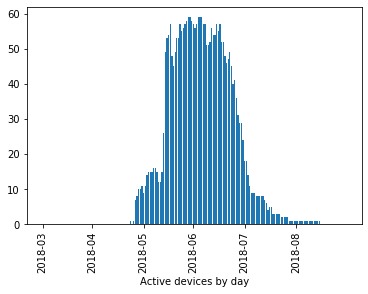

In [358]:
fig, ax = plt.subplots()
ax.bar(range(len(user_count)), user_count.values(), align='center')
ax.set_xticks(month_ticks)
ax.set_xticklabels(month_labels,rotation='vertical')
ax.set_xlabel('Active devices by day')

fig.savefig("guided-research-results/active_devices_perday_barplot.pdf", format="pdf", bbox_inches="tight")
plt.show()

#### 1.2.3.2 Total Days of Usage by Device

In [ ]:
device_usage = {}
for device in devices['device_id'].unique():
    device_usage[device]={}
    for day in timespan:
        device_usage[device][day] = 0
    
for day in usage:
    for device in usage[day]:
        device_usage[device][day] = 1
        
for device in device_usage:
    for day in device_usage[device]:
        if device_usage[device][day] > 1:
            device_usage[device][day] = 1

In [ ]:
usage_days = {}
for device in device_usage:
    usage_days[device] = sum(device_usage[device].values())

Cluster by number of days with usage using x-means.

In [ ]:
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

# turn usage dictionary into list
usage_day_values = [[v] for v in list(usage_days.values())]

# Prepare initial centers - amount of initial centers defines amount of clusters from which X-Means will
# start analysis.
amount_initial_centers = 2
initial_centers = kmeans_plusplus_initializer(usage_day_values, amount_initial_centers).initialize()

# Create instance of X-Means algorithm. The algorithm will start analysis from 2 clusters, the maximum
# number of clusters that can be allocated is 20.
xmeans_instance = xmeans(usage_day_values, initial_centers, 20)
xmeans_instance.process()

# Extract clustering results: clusters and their centers
clusters_usage = xmeans_instance.get_clusters()
centers_usage = xmeans_instance.get_centers()

In [ ]:
fig, ax = plt.subplots()
ax.hist(list(usage_days.values()))
ax.set_xlabel('Number of days devices were active')
ax.set_ylabel('Number of devices')

# add centers from x-means for cluster indication
for center in centers_usage:
    ax.axvline(center[0], color='r', linestyle='--')

fig.savefig("guided-research-results/activity_days_histogram10.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [ ]:
fig, ax = plt.subplots()
ax.hist(list(usage_days.values()), bins=60)
ax.set_xlabel('Number of days devices were active')
ax.set_ylabel('Number of devices')

# add centers from x-means for cluster indication
for center in centers_usage:
    ax.axvline(center[0], color='r', linestyle='--')

fig.savefig("guided-research-results/activity_days_histogram60.pdf", format="pdf", bbox_inches="tight")
plt.show()

#### 1.2.3.3 Usage patterns by device

Users might stop the app from running in the background, or uninstall it. Of course, they might also restart it. Here we show days when sensor readings whe

In [ ]:
bars = {}
colours = {}

for device in devices['device_id'].unique():
    bars[device] = [0]
    colours[device] = ['w']
    current_state = 0
    b = 0
    c = 0
    for day in device_usage[device]:
        # same state as day before => still same bar colour needed
        if device_usage[device][day] == current_state:
            bars[device][b] += 1
        # state changed => next bar to be stacked in different colour
        else:
            b += 1
            c += 1
            bars[device].append(1)
            current_state = device_usage[device][day]
            if c%2 == 0:
                colours[device].append('w')
            else:
                colours[device].append('#1f77b4')

In [ ]:
fig, ax = plt.subplots()

ax.set_xticks(range(1,len(bars),10))
#ax.set_xticklabels(, rotation='vertical') # really crowded label place
ax.set_xticklabels(range(1,len(bars),10))
ax.set_yticks(month_ticks)
ax.set_yticklabels(month_labels)
ax.set_xlabel('Activity pattern by device')

d = 0
for device in bars:
    height = 0
    for b in range(len(bars[device])):
        ax.bar(d, bars[device][b], bottom=height, color=colours[device][b], align='center')
        height += bars[device][b]
    d += 1

fig.savefig("guided-research-results/activity_patterns_barplot.pdf", format="pdf", bbox_inches="tight")
plt.show()

#### 1.2.3.4 User clustering

In [ ]:
X = [[] for device in device_usage]

d = 0
for device in device_usage:
    for day in device_usage[device]:
        X[d] += [device_usage[device][day]]
    d += 1

Grouping the devices/users into 3 clusters offers the best silhouette score, while still having a well interpretable number of groups. 3 clusters also reflect well the impression obtained from the total usage days histogram (see 1.2.3.2). X-Means proposes 4 different clusters, however, the first two groups are very close to each other and can be treated as the same in our use case.

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6]
labels = [[] for device in range_n_clusters]
r = 0

for n_clusters in range_n_clusters:
    fig, ax = plt.subplots()
    fig.set_size_inches(18, 7)

    # Silhouette plot
    # The silhouette coefficient can range from -1, 1 
    ax.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    
    labels[r] = cluster_labels
    r += 1

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title("The silhouette plot for the various clusters.")
    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax.set_yticks([])  # Clear the yaxis labels / ticks
    ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
    fig.savefig("guided-research-results/activity_patterns_silhouette_plot_" + str(i+1) + ".pdf", format="pdf", bbox_inches="tight")


In [ ]:
devices_labeled = {}

n = -1
for n_clusters in range_n_clusters:
    n += 1
    i = -1
    devices_labeled[n_clusters] = {}
    for device in device_usage:
        i += 1
        devices_labeled[n_clusters][device] = labels[n][i]

### 1.2.4 User Mobility

#### 1.2.4.1 Unique APs encountered by device per day

The analyses based on days with usage indicate a clustering in the following groups:
- no/low usage
- medium usage
- high usage

Clustering devices by the days of usage did not lead to any satisfactory result for the mobility analysis, clusters will thus be built based on hours/number of distinct AP detected.

In [12]:
data_bluetooth_daily = date_frame(data_bluetooth)

In [13]:
daily_unique_ble = {}
daily_unique_ble = dailyuniqueaps(daily_unique_ble,
                                  pd.merge(data_bluetooth_daily, data_beacons, left_on="bt_address", right_on="mac"),
                                  'bt_address',
                                  devices['device_id'].unique()
                                 )

density_daily_ble = {}
for device in daily_unique_ble:
    density_daily_ble[device] = {}
    for day in timespan:
        count = len(daily_unique_ble[device][day]["APs"])
        density = 0
        if count > 0:
            timedelta = daily_unique_ble[device][day]["max_time"] - daily_unique_ble[device][day]["min_time"]
            density = (timedelta.seconds/3600)/count
        density_daily_ble[device][day] = density 

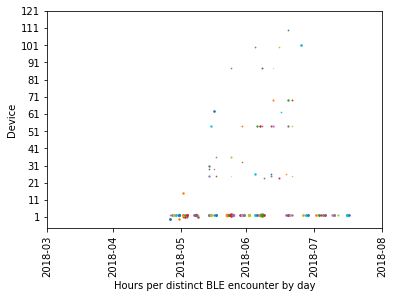

In [365]:
fig, ax = plt.subplots()

d = -1
for device in daily_unique_ble:
    d += 1
    i = 0
    for day in timespan:
        if density_daily_ble[device][day] > 0:
            ax.scatter(i, d, density_daily_ble[device][day])
        i += 1    
    
ax.set_yticks(range(1,d+1,10))
ax.set_yticklabels(range(1,d+1,10))
ax.set_ylabel('Device')
    
ax.set_xticks(month_ticks)
ax.set_xticklabels(month_labels,rotation='vertical')
ax.set_xlabel('Hours per distinct BLE encounter by day')
    
fig.savefig("guided-research-results/density_ble_perday_bubbleplot.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [17]:
data_wifi_daily = date_frame(data_wifi)

In [18]:
daily_unique_wifi = {}
daily_unique_wifi = dailyuniqueaps(daily_unique_wifi,
                                   pd.merge(data_wifi_daily, data_eduroam, left_on="bssid", right_on="mac"),
                                   'bssid',
                                   devices['device_id'].unique()
                                  )

density_daily_wifi = {}
for device in daily_unique_wifi:
    density_daily_wifi[device] = {}
    for day in timespan:
        count = len(daily_unique_wifi[device][day]["APs"])
        density = 0
        if count > 0:
            timedelta = daily_unique_wifi[device][day]["max_time"] - daily_unique_wifi[device][day]["min_time"]
            density = (timedelta.seconds/3600)/count
        density_daily_wifi[device][day] = density 

In [ ]:
fig, ax = plt.subplots()

d = -1
for device in density_daily_wifi:
    d += 1
    i = 0
    for day in timespan:
        if density_daily_wifi[device][day] > 0:
            ax.scatter(i, d, density_daily_wifi[device][day])
        i += 1    
    
ax.set_yticks(range(1,d+1,10))
ax.set_yticklabels(range(1,d+1,10))
ax.set_ylabel('Device')
    
ax.set_xticks(month_ticks)
ax.set_xticklabels(month_labels,rotation='vertical')
ax.set_xlabel('Hours per distinct eduroam WiFi AP encounter by day')
    
fig.savefig("guided-research-results/density_wifi_perday_bubbleplot.pdf", format="pdf", bbox_inches="tight")
plt.show()

Use x-means clustering to group based on AP density.

In [627]:
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

# turn ble density dictionary into list
density_ble_values = []
for device in density_daily_ble:
    np_density = np.array(list(density_daily_ble[device].values()))
    density_ble_values += [[np.median(np_density[np_density>0]),np_density[np_density>0].shape[0]]]

# Prepare initial centers - amount of initial centers defines amount of clusters from which X-Means will
# start analysis.
amount_initial_centers = 2
initial_centers = kmeans_plusplus_initializer(density_ble_values, amount_initial_centers).initialize()

# Create instance of X-Means algorithm. The algorithm will start analysis from 2 clusters, the maximum
# number of clusters that can be allocated is 20.
xmeans_instance = xmeans(density_ble_values, initial_centers, 20)
xmeans_instance.process()

# Extract clustering results: clusters and their centers
clusters_density_ble = xmeans_instance.get_clusters()
centers_density_ble = xmeans_instance.get_centers()

/u/home/starkc/.local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/u/home/starkc/.local/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


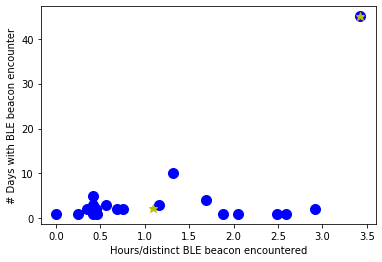

In [781]:
fig, ax = plt.subplots()
ax.set_xlabel('Hours/distinct BLE beacon encountered')
ax.set_ylabel('# Days with BLE beacon encounter')
for point in density_ble_values:
    ax.plot(point[0], point[1], color='b', marker='.', markersize='20')
for center in centers_density_ble:
    ax.plot(center[0], center[1], color='y', marker='*')
# ax.set_xscale("log")
fig.savefig("guided-research-results/density_ble_median_x-means_2d.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [606]:
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

# turn wifi density dictionary into list
density_wifi_values = []
for device in density_daily_ble:
    np_density = np.array(list(density_daily_wifi[device].values()))
    density_wifi_values += [[np.median(np_density[np_density>0]),np_density[np_density>0].shape[0]]]

# Prepare initial centers - amount of initial centers defines amount of clusters from which X-Means will
# start analysis.
amount_initial_centers = 2
initial_centers = kmeans_plusplus_initializer(density_wifi_values, amount_initial_centers).initialize()

# Create instance of X-Means algorithm. The algorithm will start analysis from 2 clusters, the maximum
# number of clusters that can be allocated is 20.
xmeans_instance = xmeans(density_wifi_values, initial_centers, 20)
xmeans_instance.process()

# Extract clustering results: clusters and their centers
clusters_density_wifi = xmeans_instance.get_clusters()
centers_density_wifi = xmeans_instance.get_centers()

/u/home/starkc/.local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/u/home/starkc/.local/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


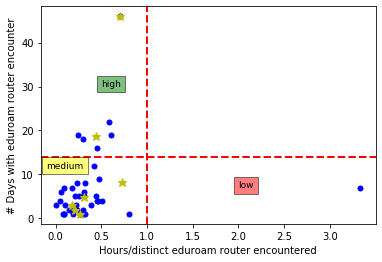

In [782]:
fig, ax = plt.subplots()
ax.set_xlabel('Hours/distinct eduroam router encountered')
ax.set_ylabel('# Days with eduroam router encounter')
for point in density_wifi_values:
    ax.plot(point[0], point[1], color='b', marker='.', markersize='10')
for center in centers_density_wifi:
    ax.plot(center[0], center[1], color='y', marker='*')
    
ax.axhline(14, color='r', linestyle='--', linewidth=2)
ax.axvline(1.0, color='r', linestyle='--', linewidth=2)

ax.text(2,7,'low',fontsize=9,bbox=dict(facecolor='red', alpha=0.5))
ax.text(-0.1,11.5,'medium',fontsize=9,bbox=dict(facecolor='yellow', alpha=0.5))
ax.text(0.5,30,'high',fontsize=9,bbox=dict(facecolor='green', alpha=0.5))

fig.savefig("guided-research-results/density_wifi_median_x-means_2d.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [713]:
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer

# turn wifi density dictionary into list
density_wifi_values_1d = []
for device in density_daily_ble:
    np_density = np.array(list(density_daily_wifi[device].values()))
    density_wifi_values_1d += [[np.nan_to_num(np.median(np_density[np_density>0]))]]

# Prepare initial centers - amount of initial centers defines amount of clusters from which X-Means will
# start analysis.
amount_initial_centers = 2
initial_centers = kmeans_plusplus_initializer(density_wifi_values_1d, amount_initial_centers).initialize()

# Create instance of X-Means algorithm. The algorithm will start analysis from 2 clusters, the maximum
# number of clusters that can be allocated is 20.
xmeans_instance = xmeans(density_wifi_values_1d, initial_centers, 20)
xmeans_instance.process()

# Extract clustering results: clusters and their centers
clusters_density_wifi_1d = xmeans_instance.get_clusters()
centers_density_wifi_1d = xmeans_instance.get_centers()

/u/home/starkc/.local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/u/home/starkc/.local/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


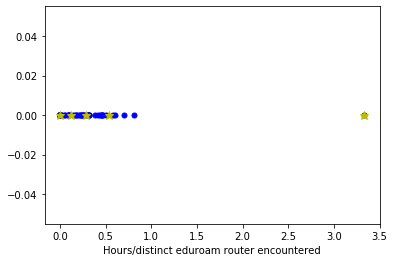

In [783]:
fig, ax = plt.subplots()
ax.set_xlabel('Hours/distinct eduroam router encountered')
for point in density_wifi_values_1d:
    ax.plot(point[0], 0, color='b', marker='.', markersize='10')
for center in centers_density_wifi_1d:
    ax.plot(center[0], 0, color='y', marker='*')
    
# ax.axhline(14, color='r', linestyle='--', linewidth=2)
# ax.axvline(1.0, color='r', linestyle='--', linewidth=2)

# ax.text(2,7,'low',fontsize=9,bbox=dict(facecolor='red', alpha=0.5))
# ax.text(-0.1,11.5,'medium',fontsize=9,bbox=dict(facecolor='yellow', alpha=0.5))
# ax.text(0.5,30,'high',fontsize=9,bbox=dict(facecolor='green', alpha=0.5))

fig.savefig("guided-research-results/density_wifi_median_x-means_1d.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [715]:
centers_density_wifi_1d

[[0.0006281377765752767],
 [0.12085388322830852],
 [0.28158105532651817],
 [0.5375850921130526],
 [3.333333333333333]]

Same analysis as above, but now remove devices with 0 density. In order to still create low, middle and high usage clusters I set the number of initial centers to 3.

In [727]:
density_wifi_values_1d_filtered = [[d] for [d] in density_wifi_values_1d if d > 0]

# Prepare initial centers - amount of initial centers defines amount of clusters from which X-Means will
# start analysis.
amount_initial_centers = 3
initial_centers = kmeans_plusplus_initializer(density_wifi_values_1d_filtered, amount_initial_centers).initialize()

# Create instance of X-Means algorithm. The algorithm will start analysis from 2 clusters, the maximum
# number of clusters that can be allocated is 20.
xmeans_instance = xmeans(density_wifi_values_1d_filtered, initial_centers, 20)
xmeans_instance.process()

# Extract clustering results: clusters and their centers
clusters_density_wifi_1d_filtered = xmeans_instance.get_clusters()
centers_density_wifi_1d_filtered = xmeans_instance.get_centers()

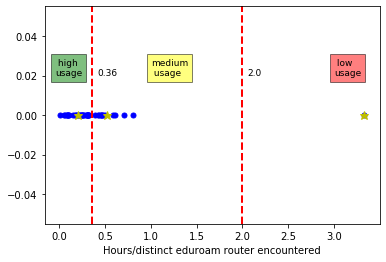

In [784]:
fig, ax = plt.subplots()
ax.set_xlabel('Hours/distinct eduroam router encountered')
for point in density_wifi_values_1d_filtered:
    ax.plot(point[0], 0, color='b', marker='.', markersize='10')
for center in centers_density_wifi_1d_filtered:
    ax.plot(center[0], 0, color='y', marker='*')
    
ax.axvline(0.36, color='r', linestyle='--', linewidth=2)
ax.text(0.41,0.02,'0.36',fontsize=9)
ax.axvline(2, color='r', linestyle='--', linewidth=2)
ax.text(2.05,0.02,'2.0',fontsize=9)

ax.text(3,0.02,' low\nusage',fontsize=9,bbox=dict(facecolor='red', alpha=0.5))
ax.text(1,0.02,'medium\n usage',fontsize=9,bbox=dict(facecolor='yellow', alpha=0.5))
ax.text(-0.05,0.02,' high\nusage',fontsize=9,bbox=dict(facecolor='green', alpha=0.5))

fig.savefig("guided-research-results/density_wifi_median_x-means_1d_filtered.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [19]:
devices_no_usage = []
devices_low_usage = []
devices_medium_usage = []
devices_high_usage = []

for device in density_daily_ble:
    np_density = np.array(list(density_daily_wifi[device].values()))
    median_density = np.nan_to_num(np.median(np_density[np_density>0]))
    if median_density == 0:
        devices_no_usage += [device]
    elif median_density < 0.36:
        devices_high_usage += [device]
    elif median_density < 2.0:
        devices_medium_usage += [device]
    else:
        devices_low_usage += [device]
        
print('no usage: ', len(devices_no_usage))
print('low usage: ', len(devices_low_usage))
print('medium usage: ', len(devices_medium_usage))
print('high usage: ', len(devices_high_usage))

devices_little_usage = devices_no_usage + devices_low_usage

no usage:  86
low usage:  1
medium usage:  12
high usage:  27


/u/home/starkc/.local/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3118: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/u/home/starkc/.local/lib/python3.6/site-packages/numpy/core/_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


#### 1.2.4.2 Mobility Based on BLE

User mobility copmuted by computing the distance between encountered bluetooth beacons on the same day. Compute overall mobility by summing up.

In [362]:
data_bluetooth_daily = date_frame(data_bluetooth)
device_location_ble = pd.merge(data_bluetooth_daily, data_beacons, left_on="bt_address", right_on="mac")
device_location_ble = device_location_ble[['timestamp','date','device_id','lat','long']]
device_coordinates_ble = {}
device_coordinates_ble = dailydistance(device_coordinates_ble, device_location_ble, devices_little_usage)

total_distance_ble = {}
for device in device_coordinates_ble:
    total_distance_ble[device] = 0
    for day in device_coordinates_ble[device]:
        total_distance_ble[device] += device_coordinates_ble[device][day]["Distance"]

total_distance_ble_sorted = list(total_distance_ble.values())
total_distance_ble_sorted.sort()

fig, ax = plt.subplots()
ax.plot(total_distance_ble_sorted, (np.arange(len(total_distance_ble_sorted))/len(total_distance_ble_sorted)))
ax.set_xlabel('Distance (m)')
ax.set_ylabel('CDF')
ax.set_xscale("log", nonposx='clip')

fig.savefig("guided-research-results/mobility_cdf_ble_lowusage.pdf",format="pdf", bbox_inches="tight")
plt.show()

for device in total_distance_ble:
    print(device)
    print('usage: ', usage_days[device])
    print('distance: ', total_distance_ble[device])

NameError: name 'devices_little_usage' is not defined

initialize
fill ecountered APs
compute distance


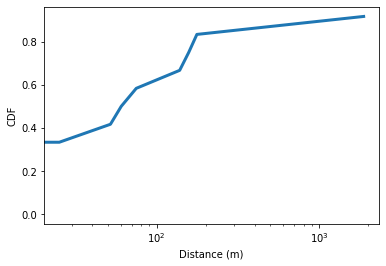

2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1
usage:  6
distance:  0.0
3bbcc834-7c27-46b4-aa56-51267ab6e283
usage:  15
distance:  176.57809381442166
b212c0fd-6209-43e8-a2da-d98f31b807dd
usage:  83
distance:  1873.7692044168514
275e24d8-634b-4b3c-806d-f5c39feb697e
usage:  1
distance:  25.15917536250197
b60d7582-5851-4927-a8aa-7cdff291cdc7
usage:  37
distance:  74.84685957742754
4e7801df-ed93-43fa-9246-7172d0183f23
usage:  46
distance:  60.512251203809626
aaf1ecc4-fba4-42ac-80b6-0c7b2c8a7735
usage:  44
distance:  138.36204644048186
8ba39613-aeef-4715-8be6-56bad1d20137
usage:  5
distance:  0.0
19d0f512-cfe8-4758-9b8b-3b9c870a0907
usage:  45
distance:  51.91865461891496
24b4fbdb-9742-4737-87c6-054bb9fbd114
usage:  46
distance:  157.32161729126588
6b856387-0749-47cc-a24a-b9703f281b4f
usage:  18
distance:  0
8b21299a-f3bb-43b3-8e1b-5b9f93696b24
usage:  22
distance:  0


In [786]:
data_bluetooth_daily = date_frame(data_bluetooth)
device_location_ble = pd.merge(data_bluetooth_daily, data_beacons, left_on="bt_address", right_on="mac")
device_location_ble = device_location_ble[['timestamp','date','device_id','lat','long']]
device_coordinates_ble = {}
device_coordinates_ble = dailydistance(device_coordinates_ble, device_location_ble, devices_medium_usage)

total_distance_ble = {}
for device in device_coordinates_ble:
    total_distance_ble[device] = 0
    for day in device_coordinates_ble[device]:
        total_distance_ble[device] += device_coordinates_ble[device][day]["Distance"]

total_distance_ble_sorted = list(total_distance_ble.values())
total_distance_ble_sorted.sort()

fig, ax = plt.subplots()
ax.plot(total_distance_ble_sorted, (np.arange(len(total_distance_ble_sorted))/len(total_distance_ble_sorted)))
ax.set_xlabel('Distance (m)')
ax.set_ylabel('CDF')
ax.set_xscale("log", nonposx='clip')

fig.savefig("guided-research-results/mobility_cdf_ble_mediumusage.pdf",format="pdf", bbox_inches="tight")
plt.show()

for device in total_distance_ble:
    print(device)
    print('usage: ', usage_days[device])
    print('distance: ', total_distance_ble[device])

initialize
fill ecountered APs
compute distance


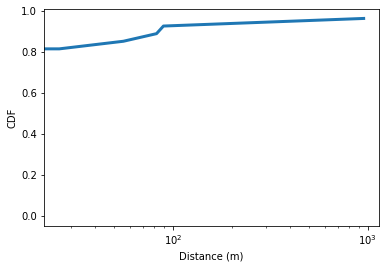

7a52f62b-b528-40b3-864b-1ae7eed1e189
usage:  63
distance:  0
424bf6cf-a071-4f55-b2a6-2f4e24b46b91
usage:  1
distance:  0
3775c074-44d7-4349-9273-3cd8a959369d
usage:  6
distance:  89.44295203472396
e003fc12-ace7-41ee-b7f6-9dc1b5c5adfd
usage:  30
distance:  0.0
68ea945e-33eb-44ea-82f9-7ace16ac0d77
usage:  42
distance:  0.0
b7a60829-bbbe-48d5-9b6b-fc2f2de0a70c
usage:  48
distance:  0
92369119-68fe-436d-8ca8-e7d03d903661
usage:  43
distance:  0
2a3062a6-0eeb-4a8d-9623-adb8d5ca0eda
usage:  23
distance:  0
b3fa9c28-64d5-487b-9775-61ca9d9b3f3b
usage:  4
distance:  0
3f4abf62-e6ad-400c-a2fd-565aecd0f24c
usage:  41
distance:  951.5921768574641
ede758db-b887-4b64-b34c-665130909c6d
usage:  4
distance:  0
5d5561d6-3895-4333-b279-8f32a6676946
usage:  4
distance:  0
0d570dc2-b6fd-4b58-a821-04ca19a63d39
usage:  37
distance:  0.0
a9391bee-d52e-4477-bb13-f364e532c241
usage:  31
distance:  82.42236810430127
f21c5f10-55ff-46e0-81ec-5d55bda030bc
usage:  3
distance:  0
08ddf60e-af58-46a5-a040-deba1cf9cd5a


In [787]:
data_bluetooth_daily = date_frame(data_bluetooth)
device_location_ble = pd.merge(data_bluetooth_daily, data_beacons, left_on="bt_address", right_on="mac")
device_location_ble = device_location_ble[['timestamp','date','device_id','lat','long']]
device_coordinates_ble = {}
device_coordinates_ble = dailydistance(device_coordinates_ble, device_location_ble, devices_high_usage)

total_distance_ble = {}
for device in device_coordinates_ble:
    total_distance_ble[device] = 0
    for day in device_coordinates_ble[device]:
        total_distance_ble[device] += device_coordinates_ble[device][day]["Distance"]

total_distance_ble_sorted = list(total_distance_ble.values())
total_distance_ble_sorted.sort()

fig, ax = plt.subplots()
ax.plot(total_distance_ble_sorted, (np.arange(len(total_distance_ble_sorted))/len(total_distance_ble_sorted)))
ax.set_xlabel('Distance (m)')
ax.set_ylabel('CDF')
ax.set_xscale("log", nonposx='clip')

fig.savefig("guided-research-results/mobility_cdf_ble_highusage.pdf",format="pdf", bbox_inches="tight")
plt.show()

for device in total_distance_ble:
    print(device)
    print('usage: ', usage_days[device])
    print('distance: ', total_distance_ble[device])

#### 1.2.4.3 Mobility Based on eduroam routers

Retrieve coordinates from TUM roomfinder for the eduram WiFi routers. **ALREADY DONE, NO NEED TO RUN AGAIN**

In [86]:
import re
import ssl
import urllib.request
from bs4 import BeautifulSoup

p = re.compile("^\d\d\.\d\d\.\d\d\d")

for i in range(data_eduroam.shape[0]):
    mac = data_eduroam.iloc[i]['mac']
    room = p.search(data_eduroam.iloc[i]['room'])
    if room != None:
        url = 'https://portal.mytum.de/campus/roomfinder/roomfinder_viewmap?mapid=156&roomid=' + room[0] + '@56' + room[0].split('.')[1]
        with urllib.request.urlopen(url, context=ssl.SSLContext()) as response:
            html = response.read()
            soup = BeautifulSoup(html, 'html.parser')
            link = str(soup.find('a', attrs={'target':'googlemap'}))
            lat = link.find('mlat=')
            amp1 = link.find('&',lat)
            long = link.find('mlon=')
            amp2 = link.find('&',long)
            data_eduroam.loc[data_eduroam['mac']==mac,'lat'] = link[lat+5:amp1]
            data_eduroam.loc[data_eduroam['mac']==mac,'long'] = link[long+5:amp2]
            
data_eduroam.to_csv(os.path.join(path_data_collection, "eduroam.csv"),sep=";",index=False)

Compute daily distances and sum them up.

(44898, 5)
initialize
fill ecountered APs
compute distance


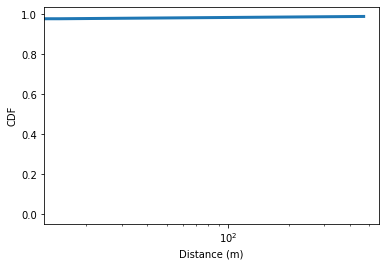

8cbb4f59-2635-4ac7-b81a-138b4f0f085e
usage:  112
distance:  0
6e05ff54-0410-4d17-8010-3cb143f4b2b3
usage:  56
distance:  0
0aa8a473-873a-46cf-a404-1721d24f3057
usage:  0
distance:  0
cb8aa48d-ed6a-46c1-aa73-2e278fb502f5
usage:  14
distance:  0
6db4d30d-da5f-489d-a697-311c2c36804d
usage:  60
distance:  0
3dc6770c-ce88-406b-a53b-fa544d7bbb64
usage:  72
distance:  0
5b108926-9f88-426b-8c69-9804642333d9
usage:  68
distance:  0
7355074b-6a17-47dd-8f9d-c5a6e3e94422
usage:  40
distance:  0
8062f341-d65a-4939-baa7-17e04b685e90
usage:  0
distance:  0
a96a1f11-5fca-4eaa-a297-3fdf226f3a56
usage:  61
distance:  0
eeed598a-9824-4a97-9def-85599d2df0b7
usage:  0
distance:  0
2fae703d-b016-4a89-8f2e-de8808379d1e
usage:  31
distance:  0
169d4cd3-7033-409d-b80b-5ff8b8b7c8f5
usage:  34
distance:  0
45c1a721-92d1-4fd9-b747-0e70d5de7192
usage:  0
distance:  0
476769a4-ee47-4355-add1-756a17749e69
usage:  3
distance:  0
e1c244a5-8e63-45eb-8a43-62da6fe053ff
usage:  4
distance:  0
82d3d81c-36bf-44ce-8cb7-3be2d

In [790]:
data_wifi_daily = date_frame(data_wifi)
device_location_wifi = pd.merge(data_wifi_daily, data_eduroam, left_on="bssid", right_on="mac")
device_location_wifi = device_location_wifi[['timestamp','date','device_id','lat','long']]
print(device_location_wifi.shape)
device_coordinates_wifi = {}
device_coordinates_wifi = dailydistance(device_coordinates_wifi, device_location_wifi, devices_little_usage)

total_distance_wifi = {}
for device in device_coordinates_wifi:
    total_distance_wifi[device] = 0
    for day in device_coordinates_wifi[device]:
        total_distance_wifi[device] += device_coordinates_wifi[device][day]["Distance"]

total_distance_wifi_sorted = list(total_distance_wifi.values())
total_distance_wifi_sorted.sort()

fig, ax = plt.subplots()
ax.plot(total_distance_wifi_sorted, (np.arange(len(total_distance_wifi_sorted))/len(total_distance_wifi_sorted)))
ax.set_xlabel('Distance (m)')
ax.set_ylabel('CDF')
ax.set_xscale("log", nonposx='clip')

fig.savefig("guided-research-results/mobility_cdf_wifi_lowusage.pdf",format="pdf", bbox_inches="tight")
plt.show()

for device in total_distance_wifi:
    print(device)
    print('usage: ', usage_days[device])
    print('distance: ', total_distance_wifi[device])

(44898, 5)
initialize
fill ecountered APs
compute distance


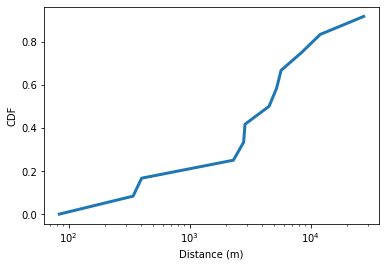

2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1
usage:  6
distance:  341.1679845189389
3bbcc834-7c27-46b4-aa56-51267ab6e283
usage:  15
distance:  5235.629385096119
b212c0fd-6209-43e8-a2da-d98f31b807dd
usage:  83
distance:  27476.61588323934
275e24d8-634b-4b3c-806d-f5c39feb697e
usage:  1
distance:  83.77629290140207
b60d7582-5851-4927-a8aa-7cdff291cdc7
usage:  37
distance:  2301.9082204840474
4e7801df-ed93-43fa-9246-7172d0183f23
usage:  46
distance:  8450.852957034289
aaf1ecc4-fba4-42ac-80b6-0c7b2c8a7735
usage:  44
distance:  5706.355043930298
8ba39613-aeef-4715-8be6-56bad1d20137
usage:  5
distance:  2798.0099570910247
19d0f512-cfe8-4758-9b8b-3b9c870a0907
usage:  45
distance:  4542.4344714537465
24b4fbdb-9742-4737-87c6-054bb9fbd114
usage:  46
distance:  12028.372314000519
6b856387-0749-47cc-a24a-b9703f281b4f
usage:  18
distance:  401.7207440191177
8b21299a-f3bb-43b3-8e1b-5b9f93696b24
usage:  22
distance:  2871.9262958466797


In [791]:
data_wifi_daily = date_frame(data_wifi)
device_location_wifi = pd.merge(data_wifi_daily, data_eduroam, left_on="bssid", right_on="mac")
device_location_wifi = device_location_wifi[['timestamp','date','device_id','lat','long']]
print(device_location_wifi.shape)
device_coordinates_wifi = {}
device_coordinates_wifi = dailydistance(device_coordinates_wifi, device_location_wifi, devices_medium_usage)

total_distance_wifi = {}
for device in device_coordinates_wifi:
    total_distance_wifi[device] = 0
    for day in device_coordinates_wifi[device]:
        total_distance_wifi[device] += device_coordinates_wifi[device][day]["Distance"]

total_distance_wifi_sorted = list(total_distance_wifi.values())
total_distance_wifi_sorted.sort()

fig, ax = plt.subplots()
ax.plot(total_distance_wifi_sorted, (np.arange(len(total_distance_wifi_sorted))/len(total_distance_wifi_sorted)))
ax.set_xlabel('Distance (m)')
ax.set_ylabel('CDF')
ax.set_xscale("log", nonposx='clip')

fig.savefig("guided-research-results/mobility_cdf_wifi_mediumusage.pdf",format="pdf", bbox_inches="tight")
plt.show()

for device in total_distance_wifi:
    print(device)
    print('usage: ', usage_days[device])
    print('distance: ', total_distance_wifi[device])

(44898, 5)
initialize
fill ecountered APs
compute distance


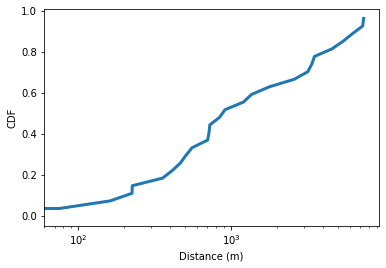

7a52f62b-b528-40b3-864b-1ae7eed1e189
usage:  63
distance:  161.70054341227865
424bf6cf-a071-4f55-b2a6-2f4e24b46b91
usage:  1
distance:  0.0
3775c074-44d7-4349-9273-3cd8a959369d
usage:  6
distance:  1361.804692104975
e003fc12-ace7-41ee-b7f6-9dc1b5c5adfd
usage:  30
distance:  6242.09088776492
68ea945e-33eb-44ea-82f9-7ace16ac0d77
usage:  42
distance:  1780.0799843023378
b7a60829-bbbe-48d5-9b6b-fc2f2de0a70c
usage:  48
distance:  718.6251433242953
92369119-68fe-436d-8ca8-e7d03d903661
usage:  43
distance:  7388.497910681897
2a3062a6-0eeb-4a8d-9623-adb8d5ca0eda
usage:  23
distance:  703.6226358774883
b3fa9c28-64d5-487b-9775-61ca9d9b3f3b
usage:  4
distance:  3187.049667452076
3f4abf62-e6ad-400c-a2fd-565aecd0f24c
usage:  41
distance:  914.4958957146952
ede758db-b887-4b64-b34c-665130909c6d
usage:  4
distance:  225.08553129675067
5d5561d6-3895-4333-b279-8f32a6676946
usage:  4
distance:  556.6130688097189
0d570dc2-b6fd-4b58-a821-04ca19a63d39
usage:  37
distance:  7276.562921538346
a9391bee-d52e-44

In [792]:
data_wifi_daily = date_frame(data_wifi)
device_location_wifi = pd.merge(data_wifi_daily, data_eduroam, left_on="bssid", right_on="mac")
device_location_wifi = device_location_wifi[['timestamp','date','device_id','lat','long']]
print(device_location_wifi.shape)
device_coordinates_wifi = {}
device_coordinates_wifi = dailydistance(device_coordinates_wifi, device_location_wifi, devices_high_usage)

total_distance_wifi = {}
for device in device_coordinates_wifi:
    total_distance_wifi[device] = 0
    for day in device_coordinates_wifi[device]:
        total_distance_wifi[device] += device_coordinates_wifi[device][day]["Distance"]

total_distance_wifi_sorted = list(total_distance_wifi.values())
total_distance_wifi_sorted.sort()

fig, ax = plt.subplots()
ax.plot(total_distance_wifi_sorted, (np.arange(len(total_distance_wifi_sorted))/len(total_distance_wifi_sorted)))
ax.set_xlabel('Distance (m)')
ax.set_ylabel('CDF')
ax.set_xscale("log", nonposx='clip')

fig.savefig("guided-research-results/mobility_cdf_wifi_highusageh.pdf",format="pdf", bbox_inches="tight")
plt.show()

for device in total_distance_wifi:
    print(device)
    print('usage: ', usage_days[device])
    print('distance: ', total_distance_wifi[device])

Only use the router with the highest RSSI per iteration to get more precise location.

In [794]:
data_wifi_eduroam_highest_rssi.head()

,timestamp,device_id,mac,rssi
0,2018-04-23 11:06:49.304,2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1,00:26:3e:f4:d1:00,-70.000
1,2018-04-23 11:16:48.498,2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1,00:26:3e:f4:d1:00,-71.000
2,2018-04-23 11:22:38.126,2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1,00:26:3e:f4:d1:00,-75.000
3,2018-04-25 15:32:21.279,3bbcc834-7c27-46b4-aa56-51267ab6e283,00:26:3e:f4:d1:00,-36.000
4,2018-04-25 15:35:48.919,3bbcc834-7c27-46b4-aa56-51267ab6e283,00:26:3e:f4:d1:00,-77.000


(20287, 5)
initialize
fill ecountered APs
compute distance


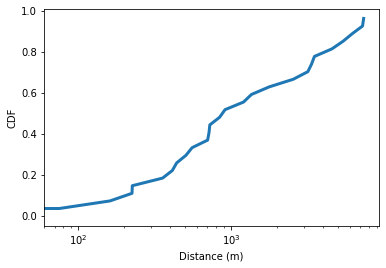

7a52f62b-b528-40b3-864b-1ae7eed1e189
usage:  63
distance:  161.70054341227865
424bf6cf-a071-4f55-b2a6-2f4e24b46b91
usage:  1
distance:  0.0
3775c074-44d7-4349-9273-3cd8a959369d
usage:  6
distance:  1361.804692104975
e003fc12-ace7-41ee-b7f6-9dc1b5c5adfd
usage:  30
distance:  6226.432710329169
68ea945e-33eb-44ea-82f9-7ace16ac0d77
usage:  42
distance:  1780.0799843023378
b7a60829-bbbe-48d5-9b6b-fc2f2de0a70c
usage:  48
distance:  718.6251433242953
92369119-68fe-436d-8ca8-e7d03d903661
usage:  43
distance:  7388.497910681897
2a3062a6-0eeb-4a8d-9623-adb8d5ca0eda
usage:  23
distance:  703.6226358774883
b3fa9c28-64d5-487b-9775-61ca9d9b3f3b
usage:  4
distance:  3187.049667452076
3f4abf62-e6ad-400c-a2fd-565aecd0f24c
usage:  41
distance:  914.4958957146952
ede758db-b887-4b64-b34c-665130909c6d
usage:  4
distance:  225.08553129675067
5d5561d6-3895-4333-b279-8f32a6676946
usage:  4
distance:  556.6130688097189
0d570dc2-b6fd-4b58-a821-04ca19a63d39
usage:  37
distance:  7264.18364606038
a9391bee-d52e-44

In [793]:
data_wifi_daily = date_frame(data_wifi_eduroam_highest_rssi)
device_location_wifi = pd.merge(data_wifi_daily, data_eduroam, left_on="mac", right_on="mac")
device_location_wifi = device_location_wifi[['timestamp','date','device_id','lat','long']]
print(device_location_wifi.shape)
device_coordinates_wifi = {}
device_coordinates_wifi = dailydistance(device_coordinates_wifi, device_location_wifi, devices_high_usage)

total_distance_wifi = {}
for device in device_coordinates_wifi:
    total_distance_wifi[device] = 0
    for day in device_coordinates_wifi[device]:
        total_distance_wifi[device] += device_coordinates_wifi[device][day]["Distance"]

total_distance_wifi_sorted = list(total_distance_wifi.values())
total_distance_wifi_sorted.sort()

fig, ax = plt.subplots()
ax.plot(total_distance_wifi_sorted, (np.arange(len(total_distance_wifi_sorted))/len(total_distance_wifi_sorted)))
ax.set_xlabel('Distance (m)')
ax.set_ylabel('CDF')
ax.set_xscale("log", nonposx='clip')

fig.savefig("guided-research-results/mobility_cdf_highestrssi_wifi_highusage.pdf",format="pdf", bbox_inches="tight")
plt.show()

for device in total_distance_wifi:
    print(device)
    print('usage: ', usage_days[device])
    print('distance: ', total_distance_wifi[device])

# 2 Create Ground Truth Labels

In [401]:
known_aps_ble = pd.merge(data_bluetooth, data_beacons, left_on="bt_address", right_on="mac")

In [402]:
known_aps_wifi = pd.merge(data_wifi_highest_rssi[['timestamp','device_id','mac']], data_eduroam[['room','mac']], left_on="mac", right_on="mac")

NameError: name 'data_wifi_highest_rssi' is not defined

## 2.1 Ground Truth Function

Input: 
- `device1` [string] : first device of possible encounter device pair
- `device2` [string] : second device of possible encounter device pair
- `data_sensor` [dataframe] : dataframe with the corresponding sensor data (bluetooth beacons or eduroam known locations)
- `sensor_id_field` [string] : field in `data_sensor` that can be used to join sensor readings; for bluetooth, choice between single beacons and grouped beacons is done here
- `min_timestamp` [datetime] : look for encounters after this time
- `max_timestamp` [datetime] : look for encounters before this time
- `dt` [integer] : timespan used for encounter definition

Output:

Returns $1$ if devices recorded same AP at least once between `min_timestamp` and `max_timestamp`, where the timestamps are different of at most $dt$ minutes, $0$ if not.

In [83]:
def get_encounter(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp, dt):
    aps1 = data_sensor[(data_sensor['device_id'] == device1) & 
                       (data_sensor['timestamp'] >= min_timestamp) &
                       (data_sensor['timestamp'] <= max_timestamp)
                      ]
    aps2 = data_sensor[(data_sensor['device_id'] == device2) & 
                       (data_sensor['timestamp'] >= min_timestamp) &
                       (data_sensor['timestamp'] <= max_timestamp)
                      ]
    encounters = pd.merge(aps1, aps2, on=sensor_id_field)
    encounters = encounters[encounters['timestamp_x']+pd.Timedelta(minutes=dt/2) >= encounters['timestamp_y']]
    encounters = encounters[encounters['timestamp_x']-pd.Timedelta(minutes=dt/2) <= encounters['timestamp_y']]
    return (1 if encounters.shape[0] > 0 else 0)

In [41]:
get_encounter('2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
              'b212c0fd-6209-43e8-a2da-d98f31b807dd',
              data_wifi,
              'bssid',
              pd.to_datetime('2018-04-26'),
              pd.to_datetime('2018-04-27'),
              180
       )

1

In [36]:
sdfsdfsdf = data_wifi[(data_wifi['device_id'].isin(['2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1','b212c0fd-6209-43e8-a2da-d98f31b807dd']))]

## 2.2 Encounter Definition: Timespan

In this case, every matching AP counts as encounter, e.g. if three APs are seen by both devices, this counts as three encounters. Order of devices is also not taken into account, so three APs for two devices result in six encounters.

In [89]:
encounters_ble_id = pd.merge(known_aps_ble,known_aps_ble,on='id')
encounters_ble_grouped = pd.merge(known_aps_ble,known_aps_ble,on='location_group')

# remove encounters with own device
encounters_ble_id = encounters_ble_id[encounters_ble_id['device_id_x'] != encounters_ble_id['device_id_y']]
encounters_ble_grouped = encounters_ble_grouped[encounters_ble_grouped['device_id_x'] != encounters_ble_grouped['device_id_y']]

In [392]:
encounters_wifi = pd.merge(known_aps_wifi,known_aps_wifi,on='mac')
encounters_wifi = encounters_wifi[encounters_wifi['device_id_x'] != encounters_wifi['device_id_y']]

### 2.2.1 Compare Encounter Timespans 

Individual BLE
Distinct encounters with no timespan limit: 10946


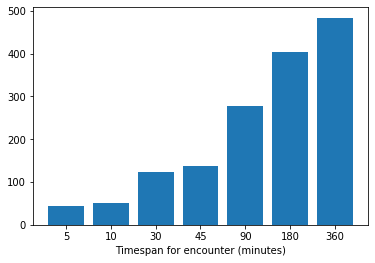

Clustered BLE
Encounters with no timespan limit: 53956
Encounters beacons grouped with timespan   5 minutes:  46
Encounters beacons grouped with timespan  10 minutes:  58
Encounters beacons grouped with timespan  30 minutes: 140
Encounters beacons grouped with timespan  45 minutes: 160
Encounters beacons grouped with timespan  90 minutes: 318
Encounters beacons grouped with timespan 180 minutes: 490
Encounters beacons grouped with timespan 360 minutes: 666


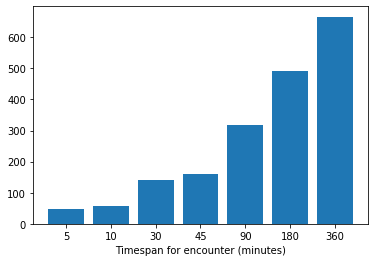

In [101]:
encounter_vis = [[0,0,0],[0,0,0],[0,0,0],[0,0,0],[0,0,0],[0,0,0],[0,0,0]]

print('Individual BLE')
print("Distinct encounters with no timespan limit: %3d" % (encounters_ble_id.shape[0]/2))
i = 0
for dt in timespans:
    tmp = encounters_ble_id.copy()
    tmp = tmp[tmp['timestamp_x']+pd.Timedelta(minutes=dt/2) >= tmp['timestamp_y']]
    tmp = tmp[tmp['timestamp_x']-pd.Timedelta(minutes=dt/2) <= tmp['timestamp_y']]
    encounter_vis[i][0] = tmp.shape[0]
    i += 1
    
fig, ax = plt.subplots()
ax.bar(range(len(encounter_vis)), [encounter_vis[v][0] for v in range(len(encounter_vis))], align='center')
ax.set_xticks(range(len(encounter_vis)))
ax.set_xticklabels(timespans)
ax.set_xlabel('Timespan for encounter (minutes)')

fig.savefig("guided-research-results/encounters_ble_id.pdf", format="pdf", bbox_inches="tight")
plt.show()
    

print('Clustered BLE')
print("Encounters with no timespan limit: %3d" % (encounters_ble_grouped.shape[0]))
i = 0
for dt in timespans:
    tmp = encounters_ble_grouped.copy()
    tmp = tmp[tmp['timestamp_x']+pd.Timedelta(minutes=dt/2) >= tmp['timestamp_y']]
    tmp = tmp[tmp['timestamp_x']-pd.Timedelta(minutes=dt/2) <= tmp['timestamp_y']]
    print("Encounters beacons grouped with timespan %3d minutes: %3d" % (dt,tmp.shape[0]))
    encounter_vis[i][1] = tmp.shape[0]
    i += 1
    
fig, ax = plt.subplots()
ax.bar(range(len(encounter_vis)), [encounter_vis[v][1] for v in range(len(encounter_vis))], align='center')
ax.set_xticks(range(len(encounter_vis)))
ax.set_xticklabels(timespans)
ax.set_xlabel('Timespan for encounter (minutes)')

fig.savefig("guided-research-results/encounters_ble_grouped.pdf", format="pdf", bbox_inches="tight")
plt.show()

Eduroam
Distinct encounters with no timespan limit: 3053
Encounters eduroam with timespan   5 minutes:   2
Encounters eduroam with timespan  10 minutes:   2
Encounters eduroam with timespan  30 minutes:   4
Encounters eduroam with timespan  45 minutes:  10
Encounters eduroam with timespan  90 minutes:  24
Encounters eduroam with timespan 180 minutes:  50
Encounters eduroam with timespan 360 minutes: 102


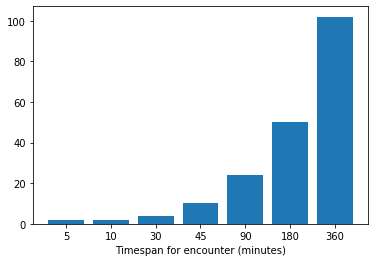

In [394]:
print('Eduroam')
print("Distinct encounters with no timespan limit: %3d" % (encounters_wifi.shape[0]/2))
i = 0
for dt in timespans:
    tmp = encounters_wifi
    tmp = tmp[tmp['timestamp_x']+pd.Timedelta(minutes=dt/2) >= tmp['timestamp_y']]
    tmp = tmp[tmp['timestamp_x']-pd.Timedelta(minutes=dt/2) <= tmp['timestamp_y']]
    print("Encounters eduroam with timespan %3d minutes: %3d" % (dt,tmp.shape[0]))
    encounter_vis[i][2] = tmp.shape[0]
    i += 1
    
fig, ax = plt.subplots()
ax.bar(range(len(encounter_vis)), [encounter_vis[v][2] for v in range(len(encounter_vis))], align='center')
ax.set_xticks(range(len(encounter_vis)))
ax.set_xticklabels(timespans)
ax.set_xlabel('Timespan for encounter (minutes)')

fig.savefig("guided-research-results/encounters_wifi.pdf", format="pdf", bbox_inches="tight")
plt.show()

### 2.2.2 Legacy BLE Statistics

In [5]:
ground_truth_locations_sorted = ground_truth_locations.sort_values(by=['device_id','timestamp']).copy()

gtl_diff = ground_truth_locations_sorted[['device_id','timestamp']].copy()
gtl_diff["timestep"] = ground_truth_locations_sorted[['device_id','timestamp']].groupby(['device_id']).diff()
gtl_diff.describe()

,timestep
count,700
mean,0 days 13:46:21.783678
std,2 days 00:24:54.966681
min,0 days 00:00:00
25%,0 days 00:09:10.508500
50%,0 days 00:24:35.876500
75%,0 days 01:49:58.031250
max,20 days 00:25:23.430000


## 2.3 Encounter Dictionary

Dictionary entry `encounters[device 1][device 2][type][dt]` = $1$ if device 1 and 2 recorded the same AP (bluetooth or wifi) within timespan $dt$. For bluetooth APs, the dictionary contains the information for grouped and ungrouped bluetooth beacons. This dictionary only gives a rough indication whether any encounter occurred within the timeframe of this study, for label generation see **2.1**.

### 2.3.1 Create Dictionary

Create dictionary containing all encounters based on different timespans, for easy loading and comparison using different encounter definitions.

In [11]:
encounters = {}
for device in devices['device_id'].unique():
    encounters[device] = {}
    for d in devices['device_id'].unique():
        if d != device:
            encounters[device][d] = {
                "bluetooth" : {
                    "single" : {},
                    "grouped" : {}
                },
                "wifi" : {}
            }
            for dt in timespans:
                encounters[device][d]["bluetooth"]["single"][str(dt)] = 0
                encounters[device][d]["bluetooth"]["grouped"][str(dt)] = 0
                encounters[device][d]["wifi"][str(dt)] = 0

Iterate multiple times to reduce peak memory usage.

In [12]:
for device_1 in encounters:
    for device_2 in encounters[device_1]:
        for dt in timespans:
            encounters[device_1][device_2]["bluetooth"]["single"][str(dt)] = \
            get_encounter(device_1,
                          device_2,
                          known_aps_ble,
                          'mac',
                          pd.to_datetime('2018-03-01'),
                          pd.to_datetime('2018-08-01'),
                          dt
                         )

In [13]:
for device_1 in encounters:
    for device_2 in encounters[device_1]:
        for dt in timespans:
            encounters[device_1][device_2]["bluetooth"]["grouped"][str(dt)] = \
            get_encounter(device_1,
                          device_2,
                          known_aps_ble,
                          'location_group',
                          pd.to_datetime('2018-03-01'),
                          pd.to_datetime('2018-08-01'),
                          dt
                         )

In [14]:
for device_1 in encounters:
    for device_2 in encounters[device_1]:
        for dt in timespans:
            encounters[device_1][device_2]["wifi"][str(dt)] = \
            get_encounter(device_1,
                          device_2,
                          known_aps_wifi,
                          'mac',
                          pd.to_datetime('2018-03-01'),
                          pd.to_datetime('2018-08-01'),
                          dt
                         )

In [22]:
with open(os.path.join(result_path,'encounters.json'), 'w') as fp:
    json.dump(encounters, fp, indent=4)

### 2.3.2 Load Encounters

In [24]:
with open(os.path.join(result_path,'encounters.json'), 'r') as fp:
    encounters = json.load(fp)

# 3 Features

Based on https://arxiv.org/pdf/1610.04730.pdf.

All features contain the following parameters:
- `device1` [string] : first device of possible encounter device pair
- `device2` [string] : second device of possible encounter device pair
- `data_sensor` [dataframe] : dataframe with the corresponding sensor data
- `sensor_id_field` [string] : field in `data_sensor` that can be used to join sensor readings 
- `min_timestamp` [datetime] : encounter timespan starts now
- `max_timestamp` [datetime] : encounter timespan ends now
- `dt` [integer] : timespan that used for encounter definition

The timespan between `min_timestamp` and `max_timestamp` should correspond to whatever duration between two devices recording the same ground truth location is seen as encounter.

## 3.1 AP Presence

Set of distinct APs seen by both device 1 and 2 during the timespan.

In [84]:
def overlapSet(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    aps1 = data_sensor[(data_sensor['device_id'] == device1) & 
                       (data_sensor['timestamp'] >= min_timestamp) &
                       (data_sensor['timestamp'] <= max_timestamp)
                      ][sensor_id_field].unique()
    aps2 = data_sensor[(data_sensor['device_id'] == device2) & 
                       (data_sensor['timestamp'] >= min_timestamp) &
                       (data_sensor['timestamp'] <= max_timestamp)
                      ][sensor_id_field].unique()
    return np.intersect1d(aps1,aps2)

Set of distinct APs seen by either device 1, 2, or both together during the timespan.

In [85]:
def unionSet(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    aps1 = data_sensor[(data_sensor['device_id'] == device1) & 
                       (data_sensor['timestamp'] >= min_timestamp) &
                       (data_sensor['timestamp'] <= max_timestamp)
                      ][sensor_id_field].unique()
    aps2 = data_sensor[(data_sensor['device_id'] == device2) & 
                       (data_sensor['timestamp'] >= min_timestamp) &
                       (data_sensor['timestamp'] <= max_timestamp)
                      ][sensor_id_field].unique()
    return np.union1d(aps1,aps2)

### 3.1.1 Overlap

Number of distinct APs seen by both device 1 and 2 during the timespan.

In [86]:
def overlap(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    return overlapSet(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp).shape[0]

In [111]:
overlap('3bbcc834-7c27-46b4-aa56-51267ab6e283',
        '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
        data_bluetooth,
        'bt_address',
        pd.to_datetime('2018-03-19'),
        pd.to_datetime('2018-08-01')
       )

16

### 3.1.2 Union

Number of distinct APs seen by device 1 and 2 together during the timespan.

In [87]:
def union(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    return unionSet(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp).shape[0]

In [116]:
union('3bbcc834-7c27-46b4-aa56-51267ab6e283',
      '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
      data_bluetooth,
      'bt_address',
      pd.to_datetime('2018-03-19'),
      pd.to_datetime('2018-08-01')
     )

3388

### 3.1.3 Jaccard

Overlap divided by Union (see above).

In [88]:
def jaccard(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    m = overlap(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp)
    n = union(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp)
    if n == 0: return None
    return(m/n)

In [482]:
jaccard('3bbcc834-7c27-46b4-aa56-51267ab6e283',
        '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
        data_bluetooth,
        'bt_address',
        pd.to_datetime('2018-03-19'),
        pd.to_datetime('2018-08-01')
       )

0.004722550177095631

### 3.1.4 Non-Overlap

Number of distinct APs seen by either device 1 or 2, but not both.

In [89]:
def non_overlap(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    m = overlap(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp)
    n = union(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp)
    return(n-m)

In [120]:
non_overlap('3bbcc834-7c27-46b4-aa56-51267ab6e283',
            '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
            data_bluetooth,
            'bt_address',
            pd.to_datetime('2018-03-19'),
            pd.to_datetime('2018-08-01')
           )

3372

## 3.2 RSSI

As these features need a list of distinct APs, using a timespan longer than one recording cycle might lead to inconsistent results. As we define encounters as "same ground truth AP seen in timespan $dt$", where $dt$ is potentially larger than the time between two iterations, we take the median RSSI. 

In [90]:
def medianTimespanRSSI(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp):
    # Get overlapping APs.
    aps1 = data_sensor[(data_sensor['device_id'] == device1) & 
                       (data_sensor['timestamp'] >= min_timestamp) &
                       (data_sensor['timestamp'] <= max_timestamp)
                      ]
    aps2 = data_sensor[(data_sensor['device_id'] == device2) & 
                       (data_sensor['timestamp'] >= min_timestamp) &
                       (data_sensor['timestamp'] <= max_timestamp)
                      ]
    
    common = overlapSet(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp)
    
    # Compute median RSSI for each AP per device.
    median1 = aps1[aps1[sensor_id_field].isin(common)][[sensor_id_field,rssi_field]].groupby([sensor_id_field], as_index=False).median().sort_values(by=[sensor_id_field])
    median2 = aps2[aps2[sensor_id_field].isin(common)][[sensor_id_field,rssi_field]].groupby([sensor_id_field], as_index=False).median().sort_values(by=[sensor_id_field])

    return(median1, median2)

### 3.2.1 Spearman

Returns spearman correlation of the median RSSI of APs encountered by both device 1 and 2.

In [91]:
def spearman(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp):
    median1,median2 = medianTimespanRSSI(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp)
    
    # Compute ranks.
    median1['rank'] = median1[rssi_field].rank(method='min', ascending=False)
    median2['rank'] = median2[rssi_field].rank(method='min', ascending=False)
    
    return stats.spearmanr(median1['rank'].values, median2['rank'].values)[0]

In [494]:
spearman('3bbcc834-7c27-46b4-aa56-51267ab6e283',
         '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
         data_bluetooth,
         'bt_address',
         'bt_rssi',
         pd.to_datetime('2018-03-19'),
         pd.to_datetime('2018-08-01')
        )

0.2563902564084361

### 3.2.2 Pearson

In [92]:
def pearson(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp):
    median1,median2 = medianTimespanRSSI(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp)
    if len(median1) < 2 or len(median2) < 2: return None
    return stats.pearsonr(median1[rssi_field], median2[rssi_field])[0]

In [492]:
pearson('3bbcc834-7c27-46b4-aa56-51267ab6e283',
        '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
        data_bluetooth,
        'bt_address',
        'bt_rssi',
        pd.to_datetime('2018-03-19'),
        pd.to_datetime('2018-08-01')
        )

0.2941624676385465

### 3.2.3 Manhattan

In [93]:
def manhattan(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp):
    median1,median2 = medianTimespanRSSI(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp)    
    return dist.cityblock(median1[rssi_field], median2[rssi_field])/median1.shape[0]

In [146]:
manhattan('3bbcc834-7c27-46b4-aa56-51267ab6e283',
          '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
          data_bluetooth,
          'bt_address',
          'bt_rssi',
          pd.to_datetime('2018-03-19'),
          pd.to_datetime('2018-08-01')
         )

9.9375

### 3.2.4 Euclidean

In [94]:
def euclidean(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp):
    median1,median2 = medianTimespanRSSI(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp)    
    if len(median1) < 1 or len(median2) < 1:
        return None
    return dist.euclidean(median1[rssi_field], median2[rssi_field])/median1.shape[0]

In [498]:
euclidean('3bbcc834-7c27-46b4-aa56-51267ab6e283',
          '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
          data_bluetooth,
          'bt_address',
          'bt_rssi',
          pd.to_datetime('2018-03-19'),
          pd.to_datetime('2018-08-01')
         )

3.2316186926987536

## 3.3 Presence + RSSI

### 3.3.1 Top AP

Check if AP with highest RSSI is same for both devices.

In [95]:
def topAP(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp):
    median1,median2 = medianTimespanRSSI(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp)    
    
    # Compute ranks.
    median1['rank'] = median1[rssi_field].rank(method='min', ascending=False)
    median2['rank'] = median2[rssi_field].rank(method='min', ascending=False)
    
    top1 = median1[median1['rank'] == 1]
    top2 = median2[median2['rank'] == 1]
    
    return 1 if np.intersect1d(top1[sensor_id_field].unique(), top2[sensor_id_field].unique()).shape[0] > 0 else 0

In [526]:
topAP('3bbcc834-7c27-46b4-aa56-51267ab6e283',
      '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
      data_bluetooth,
      'bt_address',
      'bt_rssi',
      pd.to_datetime('2018-03-19'),
      pd.to_datetime('2018-08-01')
     )

0

### 3.3.2 Top AP $\pm 6 dB$

Check if AP with highest RSSI for one device appears within 6dB of that RSSI in the other device's APs.

In [96]:
def topAP6dB(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp):
    median1,median2 = medianTimespanRSSI(device1, device2, data_sensor, sensor_id_field, rssi_field, min_timestamp, max_timestamp)    
    
    # Compute ranks.
    median1['rank'] = median1[rssi_field].rank(method='min', ascending=False)
    median2['rank'] = median2[rssi_field].rank(method='min', ascending=False)
    
    top1 = median1[median1['rank'] == 1]
    top2 = median2[median2['rank'] == 1]
    
    if np.intersect1d(top1[sensor_id_field].unique(), top2[sensor_id_field].unique()).shape[0] > 0:
        return 1
    # Top APs from device 1
    for AP in top1.values:
        if float(median2[median2[sensor_id_field] == AP[0]][rssi_field]) - float(AP[1]) <= 6:
            return 1
    # Top APs from device 2
    for AP in top2.values:
        if float(median1[median1[sensor_id_field] == AP[0]][rssi_field]) - float(AP[1]) <= 6:
            return 1
    # Not in range
    return 0

In [524]:
topAP6dB('3bbcc834-7c27-46b4-aa56-51267ab6e283',
         '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
         data_bluetooth,
         'bt_address',
         'bt_rssi',
         pd.to_datetime('2018-03-19'),
         pd.to_datetime('2018-08-01')
        )

1

## 3.4 Popularity

Returns a list containing the number of distinct devices seeing the APs seen by devices 1 and 2 during the encounter period.

In [97]:
def popularity(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    common = overlapSet(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp)
    data_filtered = data_sensor[(data_sensor[sensor_id_field].isin(common)) & 
                                (data_sensor['timestamp'] >= min_timestamp) &
                                (data_sensor['timestamp'] <= max_timestamp)
                               ]
    data_count = data_filtered.groupby(sensor_id_field)['device_id'].nunique()
    return data_count

In [285]:
popularity('3bbcc834-7c27-46b4-aa56-51267ab6e283',
           '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
           data_bluetooth,
           'bt_address',
           pd.to_datetime('2018-03-19'),
           pd.to_datetime('2018-08-01')
          )

bt_address
04:52:C7:B2:47:91     2
0C:8F:FF:1B:1F:9C     2
2C:41:A1:07:DD:82     3
40:EF:4C:7F:9F:A2    13
42:0D:B9:E1:EA:A4     2
4E:76:E0:54:D1:2B     3
59:98:99:2A:DC:95     2
7D:CB:9B:25:53:B6     4
B8:E8:56:19:C8:21     9
C9:ED:20:D2:6A:5F     4
D7:67:B8:3A:22:21     5
E1:47:5B:C3:03:C3     4
F6:26:BC:A1:D3:A2    16
F8:73:10:71:AE:C6     4
F8:F3:51:57:9D:73     6
FC:58:FA:33:15:46     6
Name: device_id, dtype: int64

In [281]:
test_popularity = data_bluetooth[data_bluetooth['bt_address']=='40:EF:4C:7F:9F:A2']
test_popularity['device_id'].unique()

array(['2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
       'b212c0fd-6209-43e8-a2da-d98f31b807dd',
       '275e24d8-634b-4b3c-806d-f5c39feb697e',
       '3bbcc834-7c27-46b4-aa56-51267ab6e283',
       '92369119-68fe-436d-8ca8-e7d03d903661',
       '08ddf60e-af58-46a5-a040-deba1cf9cd5a',
       'ad4ccb10-837f-42d3-a17e-5498cbbbecb7',
       '24b4fbdb-9742-4737-87c6-054bb9fbd114',
       '72c1cc9e-ac9e-4409-aa6e-4e800cef7305',
       '4e7801df-ed93-43fa-9246-7172d0183f23',
       'aaf1ecc4-fba4-42ac-80b6-0c7b2c8a7735',
       '0d570dc2-b6fd-4b58-a821-04ca19a63d39',
       '3f4abf62-e6ad-400c-a2fd-565aecd0f24c'], dtype=object)

### 3.4.1 Min_Popularity

Returns minimum popularity value of APs seen by both devices.

In [98]:
def min_popularity(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    return popularity(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp).min()

In [288]:
min_popularity('3bbcc834-7c27-46b4-aa56-51267ab6e283',
               '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
               data_bluetooth,
               'bt_address',
               pd.to_datetime('2018-03-19'),
               pd.to_datetime('2018-08-01')
              )

2

### 3.4.2 Max_Popularity

Returns maximum popularity value of APs seen by both devices.

In [99]:
def max_popularity(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    return popularity(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp).max()

In [292]:
max_popularity('3bbcc834-7c27-46b4-aa56-51267ab6e283',
               '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
               data_bluetooth,
               'bt_address',
               pd.to_datetime('2018-03-19'),
               pd.to_datetime('2018-08-01')
              )

16

### 3.4.2 Adamic_Adar

In [100]:
def adamic_adar(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    return np.log(popularity(device1, device2, data_sensor, sensor_id_field, min_timestamp, max_timestamp)).sum()

In [521]:
adamic_adar('3bbcc834-7c27-46b4-aa56-51267ab6e283',
            '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
            data_bluetooth,
            'bt_address',
            pd.to_datetime('2018-03-19'),
            pd.to_datetime('2018-08-01')
           )

23.24271025198331

In [522]:
adamic_adar('7a52f62b-b528-40b3-864b-1ae7eed1e189',
            '424bf6cf-a071-4f55-b2a6-2f4e24b46b91',
            data_wifi,
            'bssid',
            pd.to_datetime('2018-03-01 00:00:00'),
            pd.to_datetime('2018-03-01 01:30:00')
           )

0.0

### 3.4.3 Efficient Implementation Based on APs, not Devices

Compute popularity once for every AP in a dataframe and save that to a dictionary, instead of refiltering the dataframe for each and every device pairing.

In [101]:
def popularity_efficient(dic_popularity, dic_devices, data_sensor, sensor_id_field, min_timestamp, max_timestamp):
    data_filtered = data_sensor[(data_sensor['timestamp'] >= min_timestamp) &
                                (data_sensor['timestamp'] <= max_timestamp)
                               ]
    aps = data_sensor[sensor_id_field].unique()
    aps_pop = data_filtered.groupby(sensor_id_field)['device_id'].nunique()
    aps_devices = data_filtered.groupby(sensor_id_field)['device_id'].unique()
    for ap in aps:
        #df_ap = data_filtered[data_filtered[sensor_id_field] == ap]
        dic_popularity[ap] = aps_pop[ap] if ap in aps_pop else 0#df_ap['device_id'].nunique()
        dic_devices[ap] = aps_devices[ap] if ap in aps_devices else []#df_ap['device_id'].unique()

In [1397]:
pop_eff_aps_test = {}
pop_eff_dev_test = {}
popularity_efficient(pop_eff_aps_test,
                     pop_eff_dev_test,
                     data_bluetooth,
                     'bt_address',
                     pd.to_datetime('2018-04-25'),
                     pd.to_datetime('2018-04-27')
                    )

bt_address
00:09:A7:10:4A:D1    1
00:12:47:45:BD:CA    1
00:13:04:21:2C:3B    1
00:18:8C:52:8F:6A    1
00:19:B7:B6:8B:C0    1
                    ..
FC:A1:3E:71:64:85    1
FC:F1:36:B3:19:77    1
FC:F8:AE:8D:B8:9F    1
FD:4B:F1:27:74:19    1
FE:AF:8B:98:2E:F7    2
Name: device_id, Length: 690, dtype: int64


In [1375]:
pop_eff_aps_test

{'6D:16:55:AB:9A:6B': 1,
 'F8:F3:51:57:9D:73': 3,
 '5C:F9:38:9B:AC:C3': 1,
 '74:5C:4B:1E:4E:2F': 1,
 '7C:9C:25:E8:08:B6': 1,
 'D7:67:B8:3A:22:21': 3,
 '94:65:9C:26:9C:CD': 1,
 'DD:BF:14:C6:A1:71': 1,
 '5C:9E:E6:9D:B3:AB': 1,
 'E0:94:67:AE:1A:DB': 1,
 '2C:41:A1:50:A5:1B': 1,
 '7D:51:3B:C1:90:A7': 1,
 '84:98:66:E8:97:56': 1,
 '00:13:04:21:2C:3B': 1,
 '61:40:C2:E9:D7:66': 1,
 '69:3C:7E:13:B9:0C': 1,
 '1C:EE:6F:41:8C:6D': 1,
 '60:6D:C7:7E:77:66': 1,
 '90:94:97:C5:AF:B2': 1,
 'FB:D3:D1:9B:C0:4D': 1,
 '98:9C:57:50:6F:43': 1,
 '70:6A:30:05:E1:F4': 1,
 '4B:49:AF:BE:46:C0': 1,
 '68:27:37:AA:99:EB': 1,
 '19:DC:E5:B8:AA:BE': 1,
 'C4:8E:8F:8E:08:1E': 1,
 '5C:A8:6A:28:A5:B8': 1,
 'B8:78:2E:27:37:1F': 1,
 'ED:DE:42:8B:DA:D7': 1,
 '4D:6C:8C:BC:5E:49': 1,
 '5D:42:7D:61:12:81': 1,
 '00:7F:54:38:B4:C5': 1,
 'C2:B7:B6:4F:1E:42': 1,
 '6B:BD:20:8E:A4:19': 1,
 'DA:F3:55:1E:50:A5': 1,
 '47:2C:91:D2:C8:AC': 1,
 '00:22:D0:85:35:B8': 1,
 '7F:A4:28:10:5A:34': 1,
 '10:C6:FC:97:03:45': 1,
 '77:62:A4:C2:B1:E7': 1,


In [1376]:
pop_eff_dev_test

{'6D:16:55:AB:9A:6B': array(['3bbcc834-7c27-46b4-aa56-51267ab6e283'], dtype=object),
 'F8:F3:51:57:9D:73': array(['3bbcc834-7c27-46b4-aa56-51267ab6e283',
        '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
        'b212c0fd-6209-43e8-a2da-d98f31b807dd'], dtype=object),
 '5C:F9:38:9B:AC:C3': array(['3bbcc834-7c27-46b4-aa56-51267ab6e283'], dtype=object),
 '74:5C:4B:1E:4E:2F': array(['3bbcc834-7c27-46b4-aa56-51267ab6e283'], dtype=object),
 '7C:9C:25:E8:08:B6': array(['3bbcc834-7c27-46b4-aa56-51267ab6e283'], dtype=object),
 'D7:67:B8:3A:22:21': array(['3bbcc834-7c27-46b4-aa56-51267ab6e283',
        '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
        'b212c0fd-6209-43e8-a2da-d98f31b807dd'], dtype=object),
 '94:65:9C:26:9C:CD': array(['3bbcc834-7c27-46b4-aa56-51267ab6e283'], dtype=object),
 'DD:BF:14:C6:A1:71': array(['3bbcc834-7c27-46b4-aa56-51267ab6e283'], dtype=object),
 '5C:9E:E6:9D:B3:AB': array(['3bbcc834-7c27-46b4-aa56-51267ab6e283'], dtype=object),
 'E0:94:67:AE:1A:DB': array(['3bbcc834-7c27

In [102]:
def min_popularity_efficient(device1, device2, dic_popularity, dic_devices):
    min_pop = None
    for ap in dic_popularity:
        if device1 in dic_devices[ap]:
            if device2 in dic_devices[ap]:
                if min_pop == None:
                    min_pop = dic_popularity[ap]
                if dic_popularity[ap] < min_pop:
                    min_pop = dic_popularity[ap]
    return min_pop

In [1399]:
min_popularity_efficient('3bbcc834-7c27-46b4-aa56-51267ab6e283',
                         '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
                         pop_eff_aps_test,
                         pop_eff_dev_test
)

2

In [1382]:
for ap in pop_eff_dev_test:
    if '3bbcc834-7c27-46b4-aa56-51267ab6e283' in pop_eff_dev_test[ap]:
        if '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1' in pop_eff_dev_test[ap]:
            print(pop_eff_dev_test[ap])

['3bbcc834-7c27-46b4-aa56-51267ab6e283'
 '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1'
 'b212c0fd-6209-43e8-a2da-d98f31b807dd']
['3bbcc834-7c27-46b4-aa56-51267ab6e283'
 '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1'
 'b212c0fd-6209-43e8-a2da-d98f31b807dd']
['3bbcc834-7c27-46b4-aa56-51267ab6e283'
 '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1'
 'b212c0fd-6209-43e8-a2da-d98f31b807dd']
['3bbcc834-7c27-46b4-aa56-51267ab6e283'
 '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1'
 'b212c0fd-6209-43e8-a2da-d98f31b807dd']
['3bbcc834-7c27-46b4-aa56-51267ab6e283'
 '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1'
 'b212c0fd-6209-43e8-a2da-d98f31b807dd']
['2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1'
 '3bbcc834-7c27-46b4-aa56-51267ab6e283']
['2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1'
 '3bbcc834-7c27-46b4-aa56-51267ab6e283']
['2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1'
 'b212c0fd-6209-43e8-a2da-d98f31b807dd'
 '3bbcc834-7c27-46b4-aa56-51267ab6e283']
['3bbcc834-7c27-46b4-aa56-51267ab6e283'
 '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1']


In [103]:
def max_popularity_efficient(device1, device2, dic_popularity, dic_devices):
    max_pop = None
    for ap in dic_popularity:
        if device1 in dic_devices[ap]:
            if device2 in dic_devices[ap]:
                if max_pop == None:
                    max_pop = dic_popularity[ap]
                if dic_popularity[ap] > max_pop:
                    max_pop = dic_popularity[ap]
    return max_pop

In [1401]:
max_popularity_efficient('3bbcc834-7c27-46b4-aa56-51267ab6e283',
                         '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
                         pop_eff_aps_test,
                         pop_eff_dev_test
)

3

In [104]:
def adamic_adar_efficient(device1, device2, dic_popularity, dic_devices):
    aps = []
    for ap in dic_devices:
        if device1 in dic_devices[ap] and device2 in dic_devices[ap]:
            aps.append(ap)
    pop = np.asarray([dic_popularity[ap] for ap in aps])
    return np.log(pop).sum()

In [567]:
adamic_adar_efficient('3bbcc834-7c27-46b4-aa56-51267ab6e283',
                      '2419b8cb-c38c-43b9-83f1-b9c2b5d9f8e1',
                      pop_eff_aps_test,
                      pop_eff_dev_test
)

8.671115273688494

## 3.5 Timing

_TODO_ : optionally, does not seem very helpful

# 4 Create Dataset

In [54]:
experiment_sensors = ['BLE', 
                      'GSM', 
                      'SENSOR', 
                      'WIFI']
experiment_features = ['encounter',
                       'overlap',
                       'union',
                       'jaccard',
                       'non_overlap',
                       'spearman',
                       'pearson',
                       'manhattan',
                       'euclidean',
                       'topAP',
                       'topAP6dB',
                       'min_popularity',
                       'max_popularity',
                       'adamic_adar'
                      ]
sensor_fields = {
    'BLE': {
        'id': 'bt_address',
        'strength': 'bt_rssi'
    },
    'GSM': {
        'id': 'cid',
        'strength': 'rssi'
    },
    'SENSOR': {
        'id': 'bssid',
        'strength': None
    },
    'WIFI': {
        'id': 'bssid',
        'strength': 'rssi'
    }
}

## 4.1 High Usage

First, find out when there are any encounters at all, and focus the study on this timespan.

In [1537]:
data_bluetooth_high = data_bluetooth[
    data_bluetooth['device_id'].isin(devices_high_usage)][
    ['timestamp','device_id',sensor_fields['BLE']['id'], sensor_fields['BLE']['strength']]]

In [1538]:
data_gsm_high = data_gsm[
    data_gsm['device_id'].isin(devices_high_usage)][
    ['timestamp','device_id',sensor_fields['GSM']['id'], sensor_fields['GSM']['strength']]]

In [1539]:
data_sensor_high = data_sensor[
    data_sensor['device_id'].isin(devices_high_usage)][
    ['timestamp','device_id',sensor_fields['SENSOR']['id']]]

In [1540]:
data_wifi_high = data_wifi[
    data_wifi['device_id'].isin(devices_high_usage)][
    ['timestamp','device_id',sensor_fields['WIFI']['id'], sensor_fields['WIFI']['strength']]]

### 4.1.1 Encounters per Day

Encounter timespan $1.5$ hours.

In [869]:
delta_daily = pd.Timedelta('01:30:00')

**BLUETOOTH**

In [870]:
log('[BLE] Compute number of encounters by day.', log_path)

# empty df
encounters_ble_daily_high_df = None
encounters_ble_daily_high_set = False
# iterate over devices
for i in range(len(devices_high_usage)-1):
    log('[BLE] Device ' + str(i+1) + ' of ' + str(len(devices_high_usage)) + '.', log_path)
    d1 = devices_high_usage[i]
    for j in range(len(devices_high_usage)-1-i):
        log('[BLE] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_high_usage[i+1+j]
        dfi = data_bluetooth_high[data_bluetooth_high.device_id == d1].merge(
            data_bluetooth_high[data_bluetooth_high.device_id == d2], 
            on='bt_address')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bt_address']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi = dfi.groupby('day').hour.nunique()
        if dfi.shape[0] > 0:
            if not encounters_ble_daily_high_set:
                encounters_ble_daily_high_df = dfi
                encounters_ble_daily_high_set = True
            else:
                encounters_ble_daily_high_df = encounters_ble_daily_high_df.add(dfi, fill_value=0)
                
log('[BLE] Finished computing number of encounters by day.', log_path)

**GSM**

In [871]:
log('[GSM] Compute number of encounters by day.', log_path)

encounters_gsm_daily_high_df = None
encounters_gsm_daily_high_set = False

for i in range(len(devices_high_usage)-1):
    log('[GSM] Device ' + str(i+1) + ' of ' + str(len(devices_high_usage)) + '.', log_path)
    d1 = devices_high_usage[i]
    for j in range(len(devices_high_usage)-1-i):
        log('[GSM] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_high_usage[i+1+j]
        dfi = data_gsm_high[data_gsm_high.device_id == d1].merge(
            data_gsm_high[data_gsm_high.device_id == d2], 
            on='cid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'cid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi = dfi.groupby('day').hour.nunique()
        if dfi.shape[0] > 0:
            if not encounters_gsm_daily_high_set:
                encounters_gsm_daily_high_df = dfi
                encounters_gsm_daily_high_set = True
            else:
                encounters_gsm_daily_high_df = encounters_gsm_daily_high_df.add(dfi, fill_value=0)
                
log('[GSM] Finished computing number of encounters by day.', log_path)

**SENSOR WIFI**

In [872]:
log('[SENSOR] Compute number of encounters by day.', log_path)

encounters_sensor_daily_high_df = None
encounters_sensor_daily_high_set = False

for i in range(len(devices_high_usage)-1):
    log('[SENSOR] Device ' + str(i+1) + ' of ' + str(len(devices_high_usage)) + '.', log_path)
    d1 = devices_high_usage[i]
    for j in range(len(devices_high_usage)-1-i):
        log('[SENSOR] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_high_usage[i+1+j]
        dfi = data_sensor_high[data_sensor_high.device_id == d1].merge(
            data_sensor_high[data_sensor_high.device_id == d2], 
            on='bssid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bssid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi = dfi.groupby('day').hour.nunique()
        if dfi.shape[0] > 0:
            if not encounters_sensor_daily_high_set:
                encounters_sensor_daily_high_df = dfi
                encounters_sensor_daily_high_set = True
            else:
                encounters_sensor_daily_high_df = encounters_sensor_daily_high_df.add(dfi, fill_value=0)
                
log('Finished computing number of Sensor Wifi encounters by day.', log_path)

**WIFI**

In [873]:
log('[WIFI] Compute number of encounters by day.', log_path)

encounters_wifi_daily_high_df = None
encounters_wifi_daily_high_set = False

for i in range(len(devices_high_usage)-1):
    log('[WIFI] Device ' + str(i+1) + ' of ' + str(len(devices_high_usage)) + '.', log_path)
    d1 = devices_high_usage[i]
    for j in range(len(devices_high_usage)-1-i):
        log('[WIFI] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_high_usage[i+1+j]
        dfi = data_wifi_high[data_wifi_high.device_id == d1].merge(
            data_wifi_high[data_wifi_high.device_id == d2], 
            on='bssid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bssid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi = dfi.groupby('day').hour.nunique()
        if dfi.shape[0] > 0:
            if not encounters_wifi_daily_high_set:
                encounters_wifi_daily_high_df = dfi
                encounters_wifi_daily_high_set = True
            else:
                encounters_wifi_daily_high_df = encounters_wifi_daily_high_df.add(dfi, fill_value=0)
            
log('[WIFI] Finished computing number of encounters by day.', log_path)

In [875]:
ground_truth_daily_high_df = pd.date_range('2018-05-10', '2018-06-10').to_frame()
ground_truth_daily_high_df.columns = ['day']

ground_truth_daily_high_df = ground_truth_daily_high_df.join(encounters_ble_daily_high_df, how='outer', rsuffix='_bluetooth', )
ground_truth_daily_high_df = ground_truth_daily_high_df.join(encounters_gsm_daily_high_df, how='outer', rsuffix='_gsm')
ground_truth_daily_high_df = ground_truth_daily_high_df.join(encounters_sensor_daily_high_df, how='outer', rsuffix='_sensor')
ground_truth_daily_high_df = ground_truth_daily_high_df.join(encounters_wifi_daily_high_df, how='outer', rsuffix='_wifi')

ground_truth_daily_high_df.columns = ['day','bluetooth', 'gsm', 'sensor', 'wifi']
ground_truth_daily_high_df = ground_truth_daily_high_df.fillna(0)
ground_truth_daily_high_df = ground_truth_daily_high_df[['bluetooth', 'gsm', 'sensor', 'wifi']]

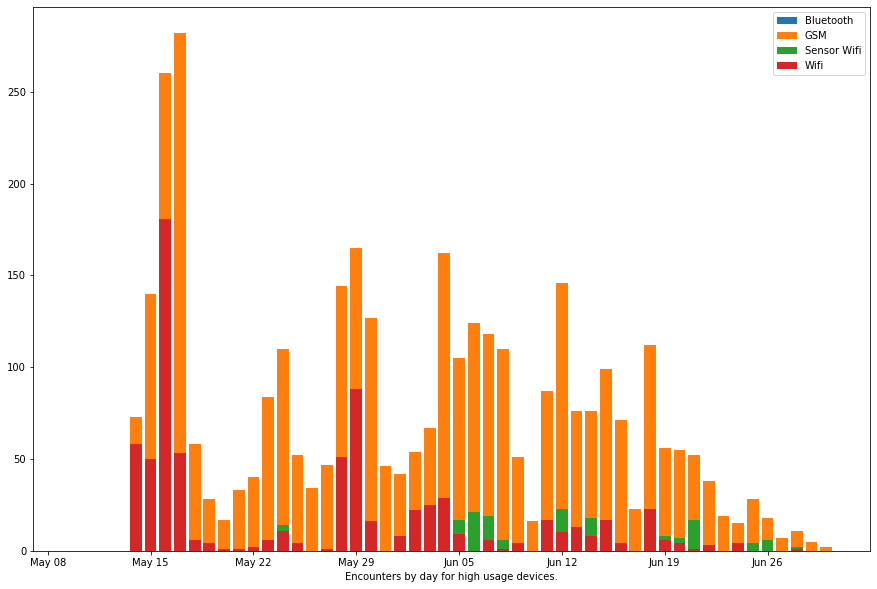

In [876]:
fig, ax = plt.subplots()
ax.bar(ground_truth_daily_high_df.index, ground_truth_daily_high_df['bluetooth'].values, align='center')
ax.bar(ground_truth_daily_high_df.index, ground_truth_daily_high_df['gsm'].values, align='center')
ax.bar(ground_truth_daily_high_df.index, ground_truth_daily_high_df['sensor'].values, align='center')
ax.bar(ground_truth_daily_high_df.index, ground_truth_daily_high_df['wifi'].values, align='center')
#ax.xaxis.set_major_locator(plt.MaxNLocator(5))
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.xaxis.set_major_locator(mdates.WeekdayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_daily_high_comparison_bar_overlaid.pdf'), format="pdf", bbox_inches="tight")
plt.show()

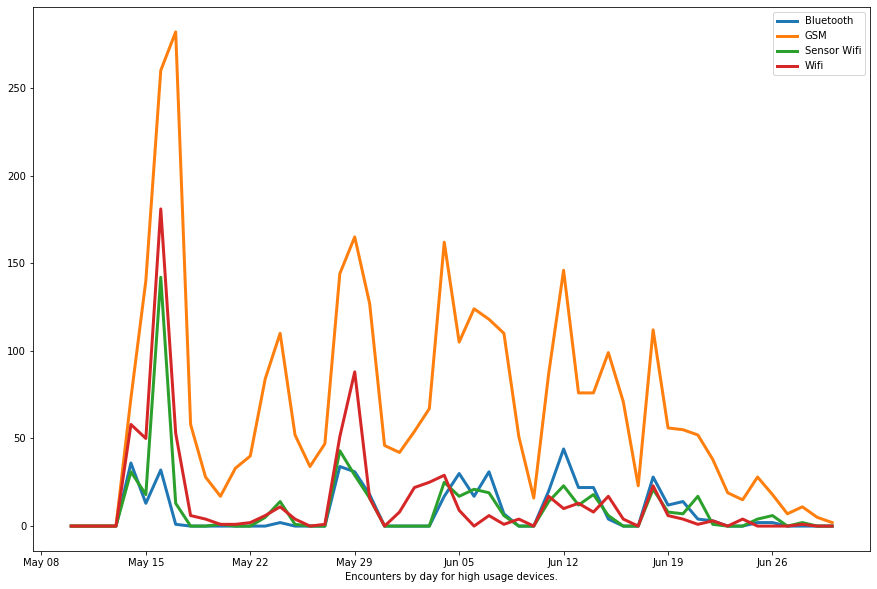

In [877]:
fig, ax = plt.subplots()
ax.plot(ground_truth_daily_high_df.index, ground_truth_daily_high_df['bluetooth'].values)
ax.plot(ground_truth_daily_high_df.index, ground_truth_daily_high_df['gsm'].values)
ax.plot(ground_truth_daily_high_df.index, ground_truth_daily_high_df['sensor'].values)
ax.plot(ground_truth_daily_high_df.index, ground_truth_daily_high_df['wifi'].values)
#ax.xaxis.set_major_locator(plt.MaxNLocator(5))
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.xaxis.set_major_locator(mdates.WeekdayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_daily_high_comparison_line_overlaid.pdf'), format="pdf", bbox_inches="tight")
plt.show()

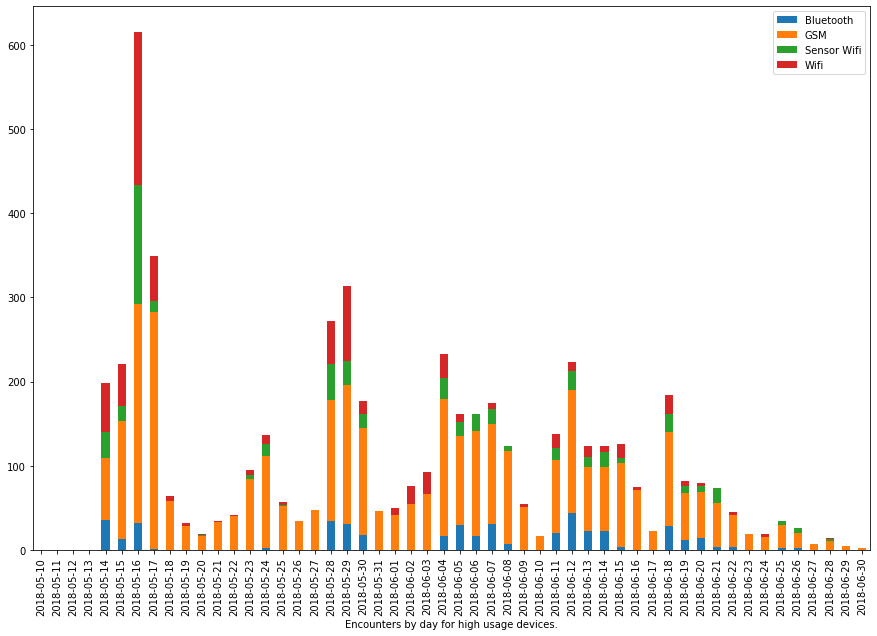

In [878]:
ax = ground_truth_daily_high_df.plot(kind='bar', stacked=True)
fig = ax.get_figure()
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xticklabels([pd.datetime.strftime(d,'%Y-%m-%d') for d in ground_truth_high_df.index])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_daily_high_comparison_bar_stacked.pdf'), format="pdf", bbox_inches="tight")
plt.show()

### 4.1.2 Drilldown to Busy Timespans

Candidates need to have many encounters, and also feature encounters registered by different sensor types.
Candidates are:

- 2018-05-14
- 2018-05-16
- 2018-05-28
- 2018-05-29
- 2018-06-04
- 2018-06-12
- 2018-06-18

Encounter timespan is now set to $5$ minutes.

In [1274]:
delta_hourly = pd.Timedelta('00:05:00')
delta_string = '5min'
candidates_hourly = ['2018-05-14',
                     '2018-05-16',
                     '2018-05-28',
                     '2018-05-29',
                     '2018-06-04',
                     '2018-06-12',
                     '2018-06-18']
candidates_hourly_date = [pd.datetime.strptime(c, '%Y-%m-%d') for c in candidates_hourly]

In [1275]:
data_bluetooth_busy_high = date_frame(data_bluetooth_high)
data_bluetooth_busy_high = data_bluetooth_busy_high[data_bluetooth_busy_high['date'].isin(candidates_hourly)]

In [1276]:
data_gsm_busy_high = date_frame(data_gsm_high)
data_gsm_busy_high = data_gsm_busy_high[data_gsm_busy_high['date'].isin(candidates_hourly)]

In [1277]:
data_sensor_busy_high = date_frame(data_sensor_high)
data_sensor_busy_high = data_sensor_busy_high[data_sensor_busy_high['date'].isin(candidates_hourly)]

In [1278]:
data_wifi_busy_high = date_frame(data_wifi_high)
data_wifi_busy_high = data_wifi_busy_high[data_wifi_busy_high['date'].isin(candidates_hourly)]

**BLUETOOTH**

In [1279]:
log('[BLE] Compute number of encounters by hour.', log_path)

encounters_ble_busy_high_df = None
encounters_ble_busy_high_set = False

for i in range(len(devices_high_usage)-1):
    log('[BLE] Device ' + str(i+1) + ' of ' + str(len(devices_high_usage)) + '.', log_path)
    d1 = devices_high_usage[i]
    for j in range(len(devices_high_usage)-1-i):
        log('[BLE] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_high_usage[i+1+j]
        dfi = data_bluetooth_busy_high[data_bluetooth_busy_high.device_id == d1].merge(
            data_bluetooth_busy_high[data_bluetooth_busy_high.device_id == d2], 
            on='bt_address')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_hourly) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_hourly)]
        dfi = dfi[['timestamp_x', 'bt_address']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi['minutes'] = dfi.timestamp_x.dt.round('5min')
        dfi = dfi.groupby('hour').minutes.nunique()
        if dfi.shape[0] > 0:
            if not encounters_ble_busy_high_set:
                encounters_ble_busy_high_df = dfi
                encounters_ble_busy_high_set = True
            else:
                encounters_ble_busy_high_df = encounters_ble_busy_high_df.add(dfi, fill_value=0)
                
log('[BLE] Finished computing number of encounters by hour: ' + str(encounters_ble_busy_high_df.shape[0]), log_path)

**GSM**

In [1280]:
log('[GSM] Compute number of encounters by hour.', log_path)

encounters_gsm_busy_high_df = None
encounters_gsm_busy_high_set = False

for i in range(len(devices_high_usage)-1):
    log('[GSM] Device ' + str(i+1) + ' of ' + str(len(devices_high_usage)) + '.', log_path)
    d1 = devices_high_usage[i]
    for j in range(len(devices_high_usage)-1-i):
        log('[GSM] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_high_usage[i+1+j]
        dfi = data_gsm_busy_high[data_gsm_busy_high.device_id == d1].merge(
            data_gsm_busy_high[data_gsm_busy_high.device_id == d2], 
            on='cid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_hourly) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_hourly)]
        dfi = dfi[['timestamp_x', 'cid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi['minutes'] = dfi.timestamp_x.dt.round('5min')
        dfi = dfi.groupby('hour').minutes.nunique()
        if dfi.shape[0] > 0:
            if not encounters_gsm_busy_high_set:
                encounters_gsm_busy_high_df = dfi
                encounters_gsm_busy_high_set = True
            else:
                encounters_gsm_busy_high_df = encounters_gsm_busy_high_df.add(dfi, fill_value=0)
                
log('[GSM] Finished computing number of encounters by hour: ' + str(encounters_gsm_busy_high_df.shape[0]), log_path)

**SENSOR WIFI**

In [1281]:
log('[SENSOR] Compute number of encounters by hour.', log_path)

encounters_sensor_busy_high_df = None
encounters_sensor_busy_high_set = False

for i in range(len(devices_high_usage)-1):
    log('[SENSOR] Device ' + str(i+1) + ' of ' + str(len(devices_high_usage)) + '.', log_path)
    d1 = devices_high_usage[i]
    for j in range(len(devices_high_usage)-1-i):
        log('[SENSOR] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_high_usage[i+1+j]
        dfi = data_sensor_busy_high[data_sensor_busy_high.device_id == d1].merge(
            data_sensor_busy_high[data_sensor_busy_high.device_id == d2], 
            on='bssid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bssid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi['minutes'] = dfi.timestamp_x.dt.round('5min')
        dfi = dfi.groupby('hour').minutes.nunique()
        if dfi.shape[0] > 0:
            if not encounters_sensor_busy_high_set:
                encounters_sensor_busy_high_df = dfi
                encounters_sensor_busy_high_set = True
            else:
                encounters_sensor_busy_high_df = encounters_sensor_busy_high_df.add(dfi, fill_value=0)
                
log('[SENSOR] Finished computing number of encounters by hour: ' + str(encounters_sensor_busy_high_df.shape[0]), log_path)

**WIFI**

In [1282]:
log('[WIFI] Compute number of encounters by hour.', log_path)

encounters_wifi_busy_high_df = None
encounters_wifi_busy_high_set = False

for i in range(len(devices_high_usage)-1):
    log('[WIFI] Device ' + str(i+1) + ' of ' + str(len(devices_high_usage)) + '.', log_path)
    d1 = devices_high_usage[i]
    for j in range(len(devices_high_usage)-1-i):
        log('[WIFI] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_high_usage[i+1+j]
        dfi = data_wifi_busy_high[data_wifi_busy_high.device_id == d1].merge(
            data_wifi_busy_high[data_wifi_busy_high.device_id == d2], 
            on='bssid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bssid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi['minutes'] = dfi.timestamp_x.dt.round('5min')
        dfi = dfi.groupby('hour').minutes.nunique()
        if dfi.shape[0] > 0:
            if not encounters_wifi_busy_high_set:
                encounters_wifi_busy_high_df = dfi
                encounters_wifi_busy_high_set = True
            else:
                encounters_wifi_busy_high_df = encounters_wifi_busy_high_df.add(dfi, fill_value=0)
                
log('[WIFI] Finished computing number of encounters by hour: ' + str(encounters_wifi_busy_high_df.shape[0]), log_path)

In [1046]:
ground_truth_busy_high_df = pd.date_range(
    candidates_hourly_date[0], 
    candidates_hourly_date[0]+timedelta(days=1),
    freq='H'
).to_frame()

for date in candidates_hourly_date[1:]:
    df = pd.date_range(date, date+timedelta(days=1), freq='H').to_frame()
    ground_truth_busy_high_df = pd.concat([ground_truth_busy_high_df,df])
ground_truth_busy_high_df.columns = ['hour']

ground_truth_busy_high_df = ground_truth_busy_high_df.join(encounters_ble_busy_high_df, how='outer', rsuffix='_bluetooth')
ground_truth_busy_high_df = ground_truth_busy_high_df.join(encounters_gsm_busy_high_df, how='outer', rsuffix='_gsm')
ground_truth_busy_high_df = ground_truth_busy_high_df.join(encounters_sensor_busy_high_df, how='outer', rsuffix='_sensor')
ground_truth_busy_high_df = ground_truth_busy_high_df.join(encounters_wifi_busy_high_df, how='outer', rsuffix='_wifi')

ground_truth_busy_high_df.columns = ['hour','bluetooth', 'gsm', 'sensor', 'wifi']
ground_truth_busy_high_df = ground_truth_busy_high_df.fillna(0)
#ground_truth_busy_high_df = ground_truth_busy_high_df[['bluetooth', 'gsm', 'sensor', 'wifi']]

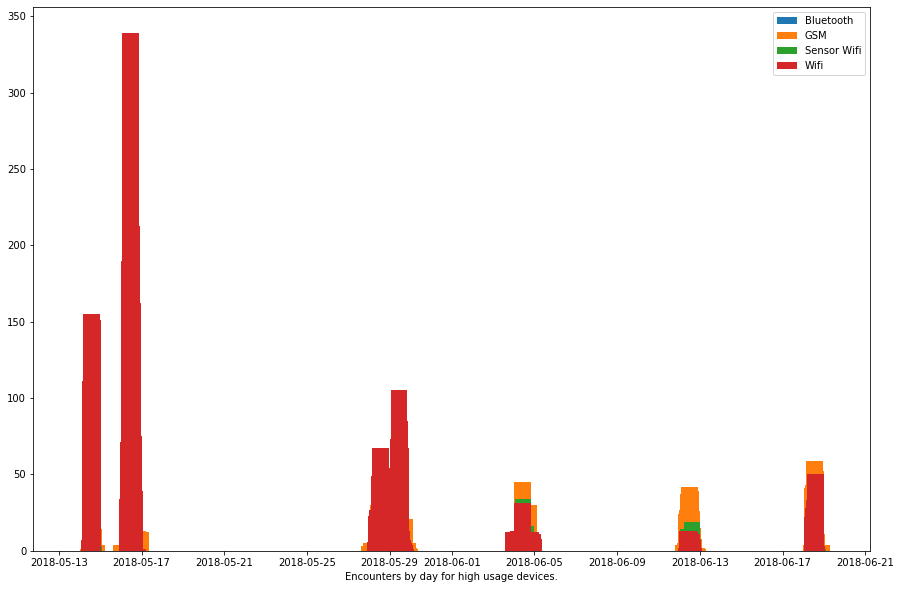

In [1283]:
fig, ax = plt.subplots()
ax.bar(ground_truth_busy_high_df.index, ground_truth_busy_high_df['bluetooth'].values, align='center')
ax.bar(ground_truth_busy_high_df.index, ground_truth_busy_high_df['gsm'].values, align='center')
ax.bar(ground_truth_busy_high_df.index, ground_truth_busy_high_df['sensor'].values, align='center')
ax.bar(ground_truth_busy_high_df.index, ground_truth_busy_high_df['wifi'].values, align='center')
#ax.xaxis.set_major_locator(plt.MaxNLocator(5))
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
#ax.xaxis.set_major_locator(mdates.WeekdayLocator())
#ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_bar_overlaid.pdf'), format="pdf", bbox_inches="tight")
plt.show()

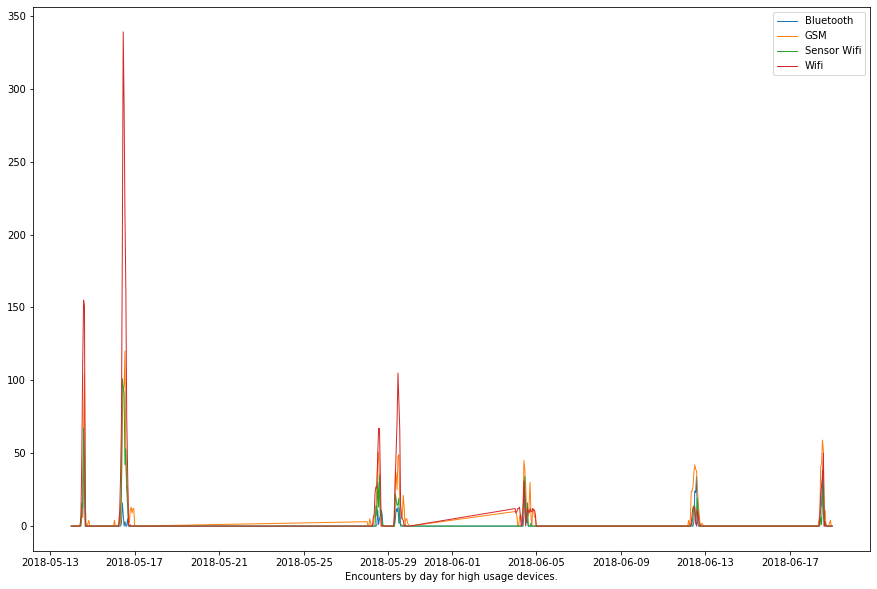

In [1284]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_high_df.index, ground_truth_busy_high_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_high_df.index, ground_truth_busy_high_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_high_df.index, ground_truth_busy_high_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_high_df.index, ground_truth_busy_high_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_line_overlaid.pdf'), format="pdf", bbox_inches="tight")
plt.show()

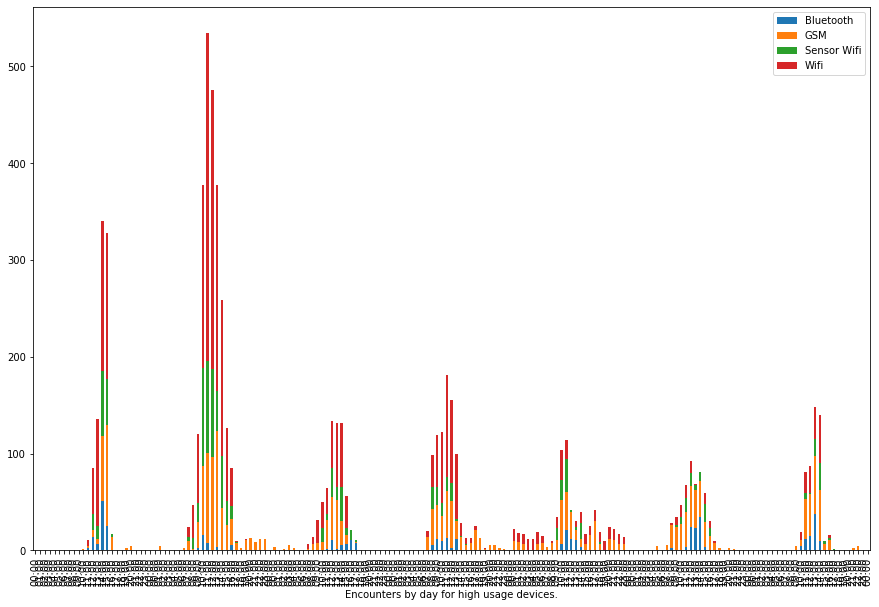

In [1285]:
ax = ground_truth_busy_high_df[['bluetooth','gsm','sensor','wifi']].plot(kind='bar', stacked=True)
fig = ax.get_figure()
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xticklabels([pd.datetime.strftime(d, '%H:%M') for d in ground_truth_busy_high_df.index])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_bar_stacked.pdf'), format="pdf", bbox_inches="tight")
plt.show()

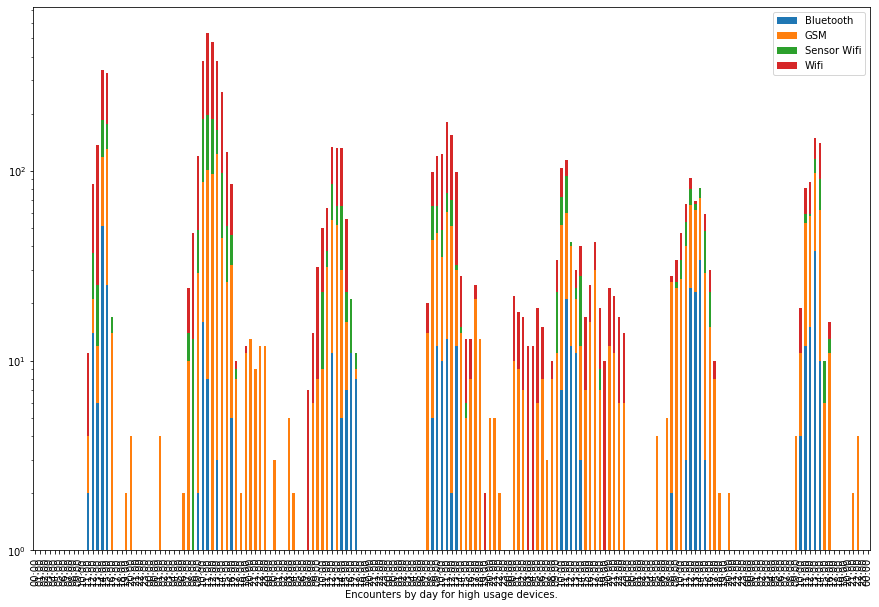

In [1286]:
ax = ground_truth_busy_high_df[['bluetooth','gsm','sensor','wifi']].plot(kind='bar', stacked=True)
fig = ax.get_figure()
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xticklabels([pd.datetime.strftime(d, '%H:%M') for d in ground_truth_busy_high_df.index])
ax.set_xlabel('Encounters by day for high usage devices.')
ax.set_yscale("log")

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_bar_stacked_log.pdf'), format="pdf", bbox_inches="tight")
plt.show()

In [1287]:
ground_truth_busy_high_df['date'] = ground_truth_busy_high_df['hour'].apply(day_from_timestamp)

ground_truth_busy_high_2018_05_14_df = ground_truth_busy_high_df[ground_truth_busy_high_df['date'] == '2018-05-14']
ground_truth_busy_high_2018_05_16_df = ground_truth_busy_high_df[ground_truth_busy_high_df['date'] == '2018-05-16']
ground_truth_busy_high_2018_05_28_df = ground_truth_busy_high_df[ground_truth_busy_high_df['date'] == '2018-05-28']
ground_truth_busy_high_2018_05_29_df = ground_truth_busy_high_df[ground_truth_busy_high_df['date'] == '2018-05-29']
ground_truth_busy_high_2018_06_04_df = ground_truth_busy_high_df[ground_truth_busy_high_df['date'] == '2018-06-04']
ground_truth_busy_high_2018_06_12_df = ground_truth_busy_high_df[ground_truth_busy_high_df['date'] == '2018-06-12']
ground_truth_busy_high_2018_06_18_df = ground_truth_busy_high_df[ground_truth_busy_high_df['date'] == '2018-06-18']

In [1288]:
ground_truth_busy_high_2018_05_14_df

,hour,bluetooth,gsm,sensor,wifi,date
2018-05-14 00:00:00,2018-05-14 00:00:00,0.000,0.000,0.000,0.000,2018-05-14
2018-05-14 01:00:00,2018-05-14 01:00:00,0.000,0.000,0.000,0.000,2018-05-14
2018-05-14 02:00:00,2018-05-14 02:00:00,0.000,0.000,0.000,0.000,2018-05-14
2018-05-14 03:00:00,2018-05-14 03:00:00,0.000,0.000,0.000,0.000,2018-05-14
2018-05-14 04:00:00,2018-05-14 04:00:00,0.000,0.000,0.000,0.000,2018-05-14
2018-05-14 05:00:00,2018-05-14 05:00:00,0.000,0.000,0.000,0.000,2018-05-14
2018-05-14 06:00:00,2018-05-14 06:00:00,0.000,0.000,0.000,0.000,2018-05-14
2018-05-14 07:00:00,2018-05-14 07:00:00,0.000,0.000,0.000,0.000,2018-05-14
2018-05-14 08:00:00,2018-05-14 08:00:00,0.000,0.000,0.000,0.000,2018-05-14
2018-05-14 09:00:00,2018-05-14 09:00:00,0.000,0.000,0.000,0.000,2018-05-14


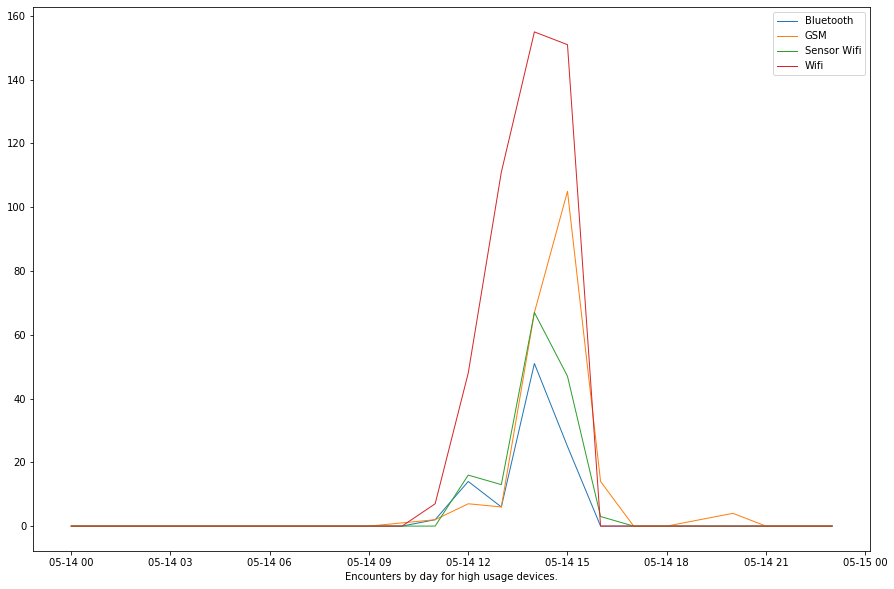

In [1289]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_high_2018_05_14_df.index, ground_truth_busy_high_2018_05_14_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_14_df.index, ground_truth_busy_high_2018_05_14_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_14_df.index, ground_truth_busy_high_2018_05_14_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_14_df.index, ground_truth_busy_high_2018_05_14_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_line_overlaid_2018_05_14.pdf'), format="pdf", bbox_inches="tight")
plt.show()

In [1290]:
ground_truth_busy_high_2018_05_16_df

,hour,bluetooth,gsm,sensor,wifi,date
2018-05-16 00:00:00,2018-05-16 00:00:00,0.000,0.000,0.000,0.000,2018-05-16
2018-05-16 01:00:00,2018-05-16 01:00:00,0.000,4.000,0.000,0.000,2018-05-16
2018-05-16 02:00:00,2018-05-16 02:00:00,0.000,0.000,0.000,0.000,2018-05-16
2018-05-16 03:00:00,2018-05-16 03:00:00,0.000,0.000,0.000,0.000,2018-05-16
2018-05-16 04:00:00,2018-05-16 04:00:00,0.000,0.000,0.000,0.000,2018-05-16
2018-05-16 05:00:00,2018-05-16 05:00:00,0.000,0.000,0.000,0.000,2018-05-16
2018-05-16 06:00:00,2018-05-16 06:00:00,0.000,2.000,0.000,0.000,2018-05-16
2018-05-16 07:00:00,2018-05-16 07:00:00,0.000,10.000,4.000,10.000,2018-05-16
2018-05-16 08:00:00,2018-05-16 08:00:00,0.000,1.000,12.000,34.000,2018-05-16
2018-05-16 09:00:00,2018-05-16 09:00:00,2.000,27.000,20.000,71.000,2018-05-16


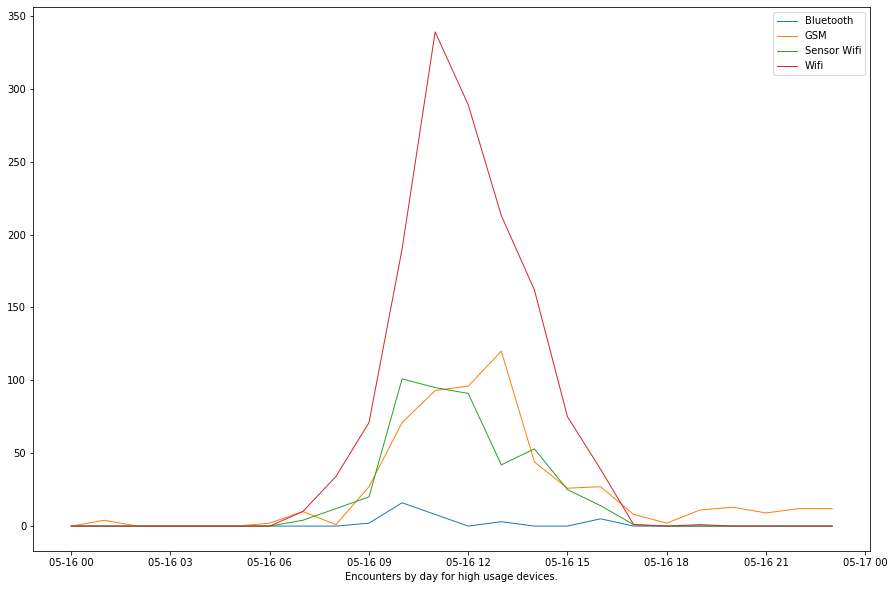

In [1291]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_high_2018_05_16_df.index, ground_truth_busy_high_2018_05_16_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_16_df.index, ground_truth_busy_high_2018_05_16_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_16_df.index, ground_truth_busy_high_2018_05_16_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_16_df.index, ground_truth_busy_high_2018_05_16_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_line_overlaid_2018_05_16.pdf'), format="pdf", bbox_inches="tight")
plt.show()

In [1292]:
ground_truth_busy_high_2018_05_28_df

,hour,bluetooth,gsm,sensor,wifi,date
2018-05-28 00:00:00,2018-05-28 00:00:00,0.000,3.000,0.000,0.000,2018-05-28
2018-05-28 01:00:00,2018-05-28 01:00:00,0.000,0.000,0.000,0.000,2018-05-28
2018-05-28 02:00:00,2018-05-28 02:00:00,0.000,1.000,0.000,0.000,2018-05-28
2018-05-28 03:00:00,2018-05-28 03:00:00,0.000,5.000,0.000,0.000,2018-05-28
2018-05-28 04:00:00,2018-05-28 04:00:00,0.000,2.000,0.000,0.000,2018-05-28
2018-05-28 05:00:00,2018-05-28 05:00:00,0.000,0.000,0.000,0.000,2018-05-28
2018-05-28 06:00:00,2018-05-28 06:00:00,0.000,0.000,0.000,0.000,2018-05-28
2018-05-28 07:00:00,2018-05-28 07:00:00,0.000,1.000,0.000,6.000,2018-05-28
2018-05-28 08:00:00,2018-05-28 08:00:00,0.000,6.000,0.000,8.000,2018-05-28
2018-05-28 09:00:00,2018-05-28 09:00:00,0.000,8.000,0.000,23.000,2018-05-28


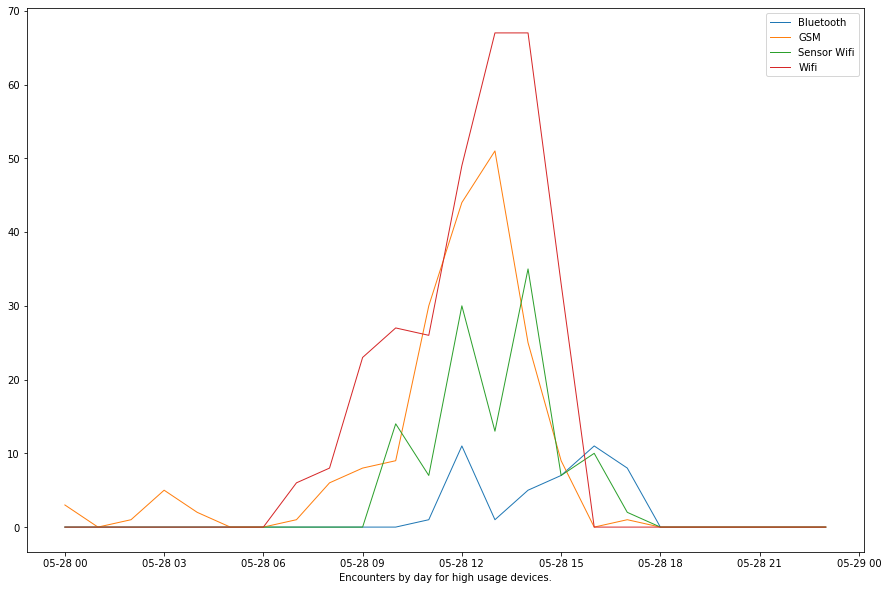

In [1293]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_high_2018_05_28_df.index, ground_truth_busy_high_2018_05_28_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_28_df.index, ground_truth_busy_high_2018_05_28_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_28_df.index, ground_truth_busy_high_2018_05_28_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_28_df.index, ground_truth_busy_high_2018_05_28_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_line_overlaid_2018_05_28.pdf'), format="pdf", bbox_inches="tight")
plt.show()

In [1294]:
ground_truth_busy_high_2018_05_29_df

,hour,bluetooth,gsm,sensor,wifi,date
2018-05-29 00:00:00,2018-05-29 00:00:00,0.000,0.000,0.000,0.000,2018-05-29
2018-05-29 00:00:00,2018-05-29 00:00:00,0.000,0.000,0.000,0.000,2018-05-29
2018-05-29 01:00:00,2018-05-29 01:00:00,0.000,0.000,0.000,0.000,2018-05-29
2018-05-29 02:00:00,2018-05-29 02:00:00,0.000,0.000,0.000,0.000,2018-05-29
2018-05-29 03:00:00,2018-05-29 03:00:00,0.000,0.000,0.000,0.000,2018-05-29
2018-05-29 04:00:00,2018-05-29 04:00:00,0.000,0.000,0.000,0.000,2018-05-29
2018-05-29 05:00:00,2018-05-29 05:00:00,0.000,0.000,0.000,0.000,2018-05-29
2018-05-29 06:00:00,2018-05-29 06:00:00,0.000,0.000,0.000,0.000,2018-05-29
2018-05-29 07:00:00,2018-05-29 07:00:00,0.000,14.000,0.000,6.000,2018-05-29
2018-05-29 08:00:00,2018-05-29 08:00:00,5.000,38.000,22.000,33.000,2018-05-29


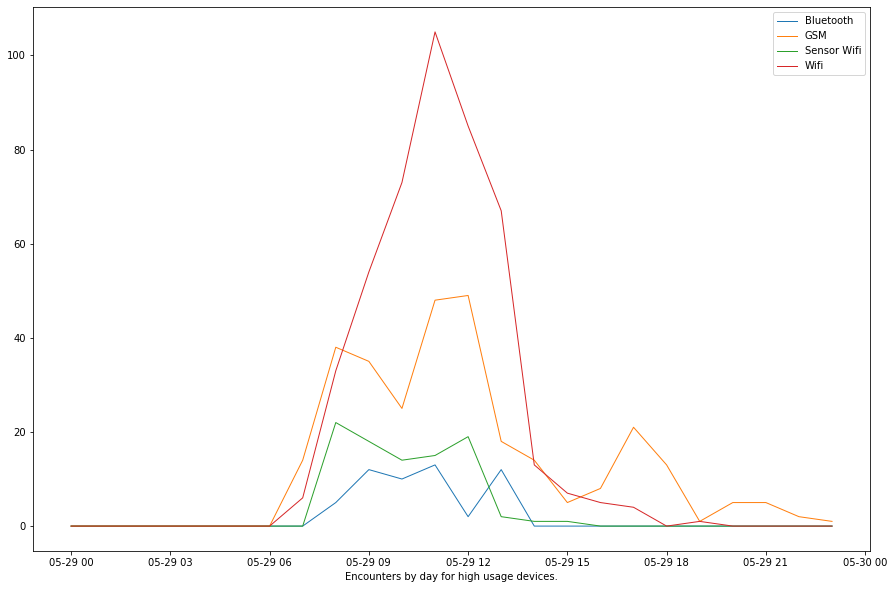

In [1295]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_high_2018_05_29_df.index, ground_truth_busy_high_2018_05_29_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_29_df.index, ground_truth_busy_high_2018_05_29_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_29_df.index, ground_truth_busy_high_2018_05_29_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_05_29_df.index, ground_truth_busy_high_2018_05_29_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_line_overlaid_2018_05_29.pdf'), format="pdf", bbox_inches="tight")
plt.show()

In [1296]:
ground_truth_busy_high_2018_06_04_df

,hour,bluetooth,gsm,sensor,wifi,date
2018-06-04 00:00:00,2018-06-04 00:00:00,0.000,10.000,0.000,12.000,2018-06-04
2018-06-04 01:00:00,2018-06-04 01:00:00,0.000,9.000,0.000,9.000,2018-06-04
2018-06-04 02:00:00,2018-06-04 02:00:00,0.000,7.000,0.000,10.000,2018-06-04
2018-06-04 03:00:00,2018-06-04 03:00:00,0.000,0.000,0.000,12.000,2018-06-04
2018-06-04 04:00:00,2018-06-04 04:00:00,0.000,0.000,0.000,12.000,2018-06-04
2018-06-04 05:00:00,2018-06-04 05:00:00,0.000,6.000,0.000,13.000,2018-06-04
2018-06-04 06:00:00,2018-06-04 06:00:00,0.000,8.000,0.000,7.000,2018-06-04
2018-06-04 07:00:00,2018-06-04 07:00:00,0.000,3.000,0.000,0.000,2018-06-04
2018-06-04 08:00:00,2018-06-04 08:00:00,0.000,8.000,0.000,2.000,2018-06-04
2018-06-04 09:00:00,2018-06-04 09:00:00,0.000,11.000,12.000,11.000,2018-06-04


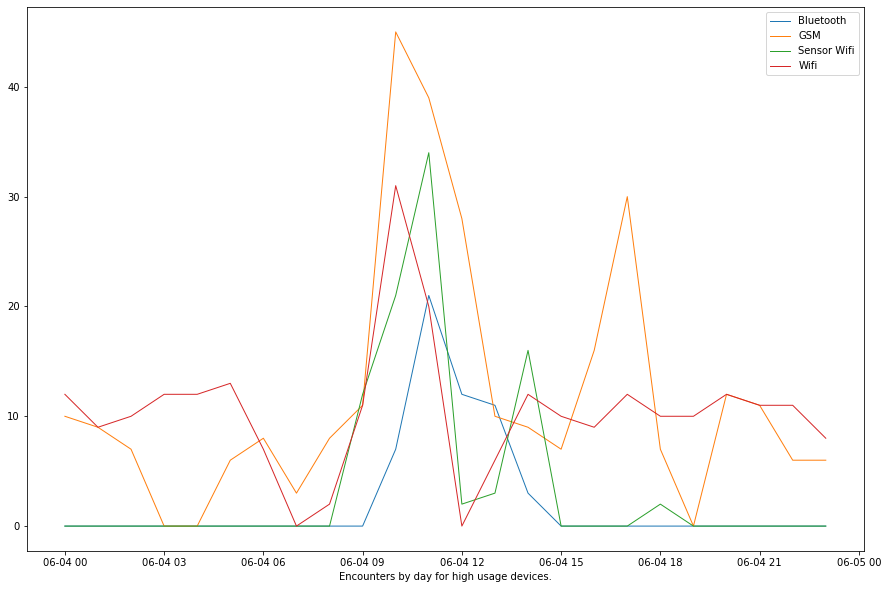

In [1297]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_high_2018_06_04_df.index, ground_truth_busy_high_2018_06_04_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_06_04_df.index, ground_truth_busy_high_2018_06_04_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_06_04_df.index, ground_truth_busy_high_2018_06_04_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_06_04_df.index, ground_truth_busy_high_2018_06_04_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_line_overlaid_2018_06_04.pdf'), format="pdf", bbox_inches="tight")
plt.show()

In [1298]:
ground_truth_busy_high_2018_06_12_df

,hour,bluetooth,gsm,sensor,wifi,date
2018-06-12 00:00:00,2018-06-12 00:00:00,0.000,0.000,0.000,0.000,2018-06-12
2018-06-12 01:00:00,2018-06-12 01:00:00,0.000,0.000,0.000,0.000,2018-06-12
2018-06-12 02:00:00,2018-06-12 02:00:00,0.000,0.000,0.000,0.000,2018-06-12
2018-06-12 03:00:00,2018-06-12 03:00:00,0.000,0.000,0.000,0.000,2018-06-12
2018-06-12 04:00:00,2018-06-12 04:00:00,0.000,0.000,0.000,0.000,2018-06-12
2018-06-12 05:00:00,2018-06-12 05:00:00,0.000,4.000,0.000,0.000,2018-06-12
2018-06-12 06:00:00,2018-06-12 06:00:00,0.000,0.000,0.000,0.000,2018-06-12
2018-06-12 07:00:00,2018-06-12 07:00:00,0.000,5.000,0.000,0.000,2018-06-12
2018-06-12 08:00:00,2018-06-12 08:00:00,2.000,24.000,0.000,2.000,2018-06-12
2018-06-12 09:00:00,2018-06-12 09:00:00,0.000,24.000,2.000,8.000,2018-06-12


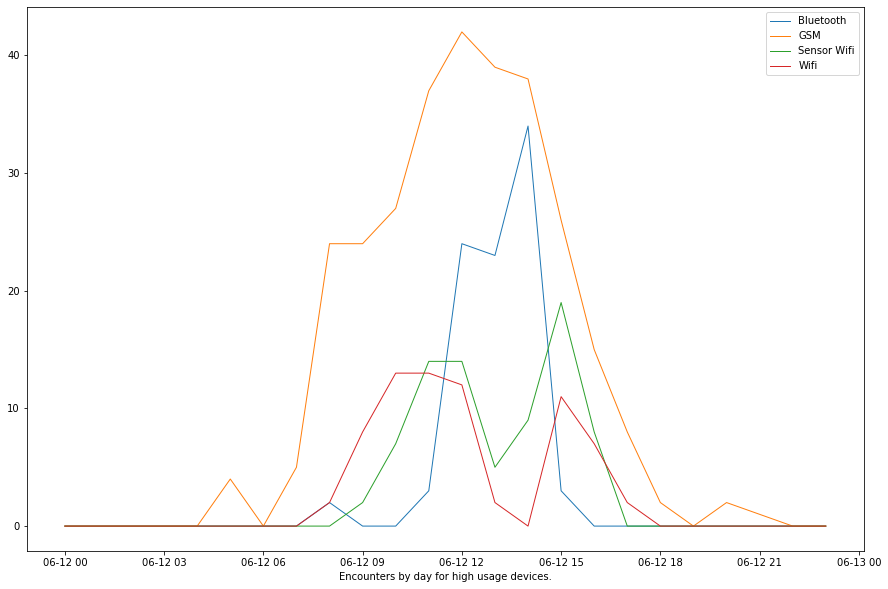

In [1299]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_high_2018_06_12_df.index, ground_truth_busy_high_2018_06_12_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_06_12_df.index, ground_truth_busy_high_2018_06_12_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_06_12_df.index, ground_truth_busy_high_2018_06_12_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_06_12_df.index, ground_truth_busy_high_2018_06_12_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_line_overlaid_2018_06_12.pdf'), format="pdf", bbox_inches="tight")
plt.show()

In [1300]:
ground_truth_busy_high_2018_06_18_df

,hour,bluetooth,gsm,sensor,wifi,date
2018-06-18 00:00:00,2018-06-18 00:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 01:00:00,2018-06-18 01:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 02:00:00,2018-06-18 02:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 03:00:00,2018-06-18 03:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 04:00:00,2018-06-18 04:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 05:00:00,2018-06-18 05:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 06:00:00,2018-06-18 06:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 07:00:00,2018-06-18 07:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 08:00:00,2018-06-18 08:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 09:00:00,2018-06-18 09:00:00,0.000,4.000,0.000,0.000,2018-06-18


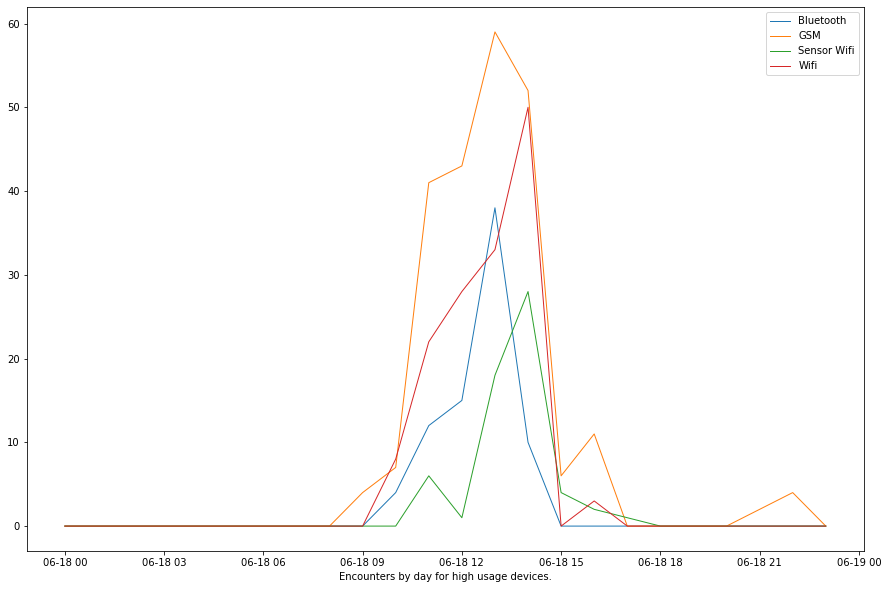

In [1301]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_high_2018_06_18_df.index, ground_truth_busy_high_2018_06_18_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_06_18_df.index, ground_truth_busy_high_2018_06_18_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_06_18_df.index, ground_truth_busy_high_2018_06_18_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_high_2018_06_18_df.index, ground_truth_busy_high_2018_06_18_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_high_'+delta_string+'_comparison_line_overlaid_2018_06_18.pdf'), format="pdf", bbox_inches="tight")
plt.show()

**Busiest Timespans**
- 2018-05-14 11:00 - 16:00
- 2018-05-29 08:00 - 14:00
- 2018-06-04 09:00 - 14:00
- 2018-06-18 09:00 - 15:00

In [1599]:
experiment_times = [('2018-05-14 11:00','2018-05-14 16:00'),
                    ('2018-05-29 08:00','2018-05-29 14:00'),
                    ('2018-06-04 09:00','2018-06-04 14:00'),
                    ('2018-06-18 10:00','2018-06-18 15:00'),
                   ]
experiment_frequency = '10min'

In [1600]:
experiment_steps = [pd.date_range(pd.datetime.strptime(et[0], '%Y-%m-%d %H:%M'),
                                  pd.datetime.strptime(et[1], '%Y-%m-%d %H:%M'),
                                  freq=experiment_frequency)
                    for et in experiment_times]

### 4.1.3 Experiment Data: Features and Ground Truths (High Usage Devices)

In [1601]:
experiment_high_usage = {}

for device1 in devices_high_usage:
    for device2 in devices_high_usage:
        if device1 != device2:
            for day in experiment_steps:
                for step in range(len(day) - 1):
                    key = device1 + '|' + device2 + '|' + str(day[step]) + '|' + str(day[step+1])
                    experiment_high_usage[key] = {
                        "key": key,
                        "device_1": device1,
                        "device_2": device2,
                        "starttime": day[step],
                        "endtime": day[step+1]
                    }
                    for sensor in experiment_sensors:
                        for feature in experiment_features:
                            experiment_high_usage[key][feature + '_' + sensor] = 0

Only fill half of it, ~then copy to vice versa entries~. First do all Wifi entries, then all bluetooth.

In [1602]:
def original_features(devices, experiment, logfile):
    for sensor in experiment_sensors:
        log('[' + sensor + '] Start computing non-popularity features.', logfile)
        sensor_id = sensor_fields[sensor]['id']
        sensor_strength = sensor_fields[sensor]['strength']
        for device in range(len(devices)-1):
            log('[' + sensor + '] Device ' + str(device+1) + ' of ' + str(len(devices_high_usage)), logfile)
            device1 = devices_high_usage[device]
            for d in range(len(devices)-1-device):
                device2 = devices_high_usage[device+1+d]
                if sensor == 'BLE':
                    df_devices = data_bluetooth_high[data_bluetooth_high['device_id'].isin([device1, device2])]
                if sensor == 'GSM':
                    df_devices = data_gsm_high[data_gsm_high['device_id'].isin([device1, device2])]
                if sensor == 'SENSOR':
                    df_devices = data_sensor_high[data_sensor_high['device_id'].isin([device1, device2])]
                if sensor == 'WIFI':
                    df_devices = data_wifi_high[data_wifi_high['device_id'].isin([device1, device2])]
                log('[' + sensor + '] Features for ' + str(device+1) + ' --> ' + str(device+d+2) + '.', log_path)
                for day in experiment_steps:
                    for step in range(len(day) - 1):
                        step_start = day[step]
                        step_end = day[step+1]
                        df_step = df_devices[(df_devices['timestamp'] >= step_start) & (df_devices['timestamp'] <= step_end)]
                        key = device1 + '|' + device2 + '|' + str(step_start) + '|' + str(step_end)
                        experiment[key]['encounter_' + sensor] = get_encounter(
                            device1, device2, df_step, sensor_id, step_start, step_end, 180)
                        experiment[key]['overlap_' + sensor] = overlap(
                            device1, device2, df_step, sensor_id, step_start, step_end)
                        experiment[key]['union_' + sensor] = union(
                            device1, device2, df_step, sensor_id, step_start, step_end)
                        experiment[key]['jaccard_' + sensor] = jaccard(
                            device1, device2, df_step, sensor_id, step_start, step_end)
                        experiment[key]['non_overlap_' + sensor] = non_overlap(
                            device1, device2, df_step, sensor_id, step_start, step_end)
                        if sensor != 'SENSOR':
                            experiment[key]['spearman_' + sensor] = spearman(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['pearson_' + sensor] = pearson(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['manhattan_' + sensor] = manhattan(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['euclidean_' + sensor] = euclidean(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['topAP_' + sensor] = topAP(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['topAP6dB_' + sensor] = topAP6dB(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
    log('[' + sensor + '] Features and encounters computed.',logfile)

Popularity features have to be computed based on the records of all devices, so we are unable to compute them using the heavily filtered dataframes from above and have to iterate a second time.

In [1603]:
def original_features_popularity(devices, experiment, logfile):
    for sensor in experiment_sensors:
        log('[' + sensor + '] Start computing popularity features.', logfile)
        sensor_id = sensor_fields[sensor]['id']
        for day in experiment_steps:
            for step in range(len(day) - 1):
                step_start = day[step]
                step_end = day[step+1]
                pop_aps = {}
                pop_dev = {}
                if sensor == 'BLE':
                    data = data_bluetooth[['timestamp',sensor_id,'device_id']]
                if sensor == 'GSM':
                    data = data_gsm[['timestamp',sensor_id,'device_id']]
                if sensor == 'SENSOR':
                    data = data_sensor[['timestamp',sensor_id,'device_id']]
                if sensor == 'WIFI':
                    data = data_wifi_high[['timestamp',sensor_id,'device_id']]
                popularity_efficient(pop_aps,
                                     pop_dev,
                                     data,
                                     sensor_id,
                                     step_start,
                                     step_end
                                    )
                log('[' + sensor + '] Popularity computed for: ' + pd.datetime.strftime(step_start, '%Y-%m-%d %H:%M') + ' --> ' + pd.datetime.strftime(step_end, '%Y-%m-%d %H:%M'), logfile)
                for device in range(len(devices)-1):
                    device1 = devices_high_usage[device]
                    for d in range(len(devices)-1-device):
                        device2 = devices_high_usage[device+1+d]
                        key = device1 + '|' + device2 + '|' + str(step_start) + '|' + str(step_end)
                        experiment[key]['min_popularity_' + sensor] = min_popularity_efficient(device1,device2,pop_aps,pop_dev)
                        experiment[key]['max_popularity_' + sensor] = max_popularity_efficient(device1,device2,pop_aps,pop_dev)
                        experiment[key]['adamic_adar_' + sensor] = adamic_adar_efficient(device1,device2,pop_aps,pop_dev)
        log('[' + sensor + '] Popularity features computed.', logfile)    

In [ ]:
original_features(devices_high_usage, experiment_high_usage, log_path)
original_features_popularity(devices_high_usage, experiment_high_usage, log_path)

/u/home/starkc/.local/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


In [1608]:
log('Transform into dataframe.', log_path)
experiment_high_10min_df = pd.DataFrame.from_dict(experiment_high_usage, orient='index')
#log('Shape before removing lines: ' + str(experiment_high_10min_df.shape))
#indexNames = experiment_high_10min_df[
#    experiment_high_10min_df.starttime.isin([
#        '2018-05-14 16:00:00',
#        '2018-05-29 14:00:00',
#        '2018-06-04 14:00:00',
#        '2018-06-18 15:00:00'
#    ])].index
#experiment_high_10min_df.drop(indexNames, inplace=True)
#log('Shape after removing lines: ' + str(experiment_high_10min_df.shape))
log('Transformed into dataframe.', log_path)
experiment_high_10min_df.to_parquet(os.path.join(result_path, 'experiment_high_' + experiment_frequency + '.parquet'))
log('Exported as parquet.', log_path)

**FIXED**: Remove time steps from day 1 last time to day 2 first time, ...

### 4.1.4 Overview

Different statistics, e.g. how many encounters are there based on bluetooth or wifi, and how do the features from the original papers correlate with the encounter probability.

In [1609]:
enc_high = {}
for sensor in experiment_sensors:
    enc_high[sensor] = experiment_high_10min_df[experiment_high_10min_df['encounter_'+sensor] == 1].index

enc_high_comb = np.empty([5,4])
for i, sensor1 in enumerate(experiment_sensors):
    for j, sensor2 in enumerate(experiment_sensors):
        enc_high_comb[i+1,j] = int(np.intersect1d(enc_high[sensor1],enc_high[sensor2]).shape[0])
        
enc_high_columns = ['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi']
enc_high_values = [enc_high['BLE'].shape[0], enc_high['GSM'].shape[0], enc_high['SENSOR'].shape[0], enc_high['WIFI'].shape[0]]

enc_high_comb = enc_high_comb.tolist()
enc_high_comb[0] = enc_high_columns
enc_high_comb = list(map(list, zip(*enc_high_comb)))

enc_df = pd.DataFrame(data=enc_high_comb, columns=['']+enc_high_columns)
enc_df.head()

,,Bluetooth,GSM,Sensor Wifi,Wifi
0,Bluetooth,139.000,54.000,18.000,60.000
1,GSM,54.000,347.000,30.000,85.000
2,Sensor Wifi,18.000,30.000,104.000,35.000
3,Wifi,60.000,85.000,35.000,203.000


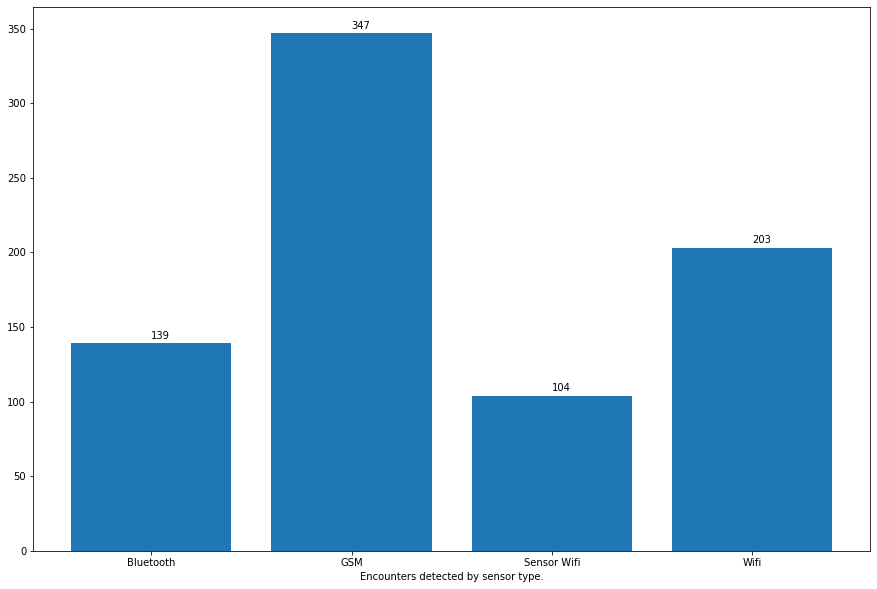

In [1610]:
fig, ax = plt.subplots()
ax.bar(enc_high_columns, enc_high_values, align='center')
for i, v in enumerate(enc_high_values):
    ax.text(i, v + 5, str(v), va='center')
ax.set_xlabel('Encounters detected between high usage devices by sensor type.')

fig.savefig(os.path.join(result_path, 'encounters_high_'+delta_string+'_bysensor.pdf'), format="pdf", bbox_inches="tight")
plt.show()

### 4.1.5 Encounter Rates by Feature Value

Round values for bucketing: obviously we cannot provide meaningful statistics when we have almost only unique values.

In [1611]:
experiment_high_rounded = experiment_high_10min_df.copy()

for sensor in experiment_sensors:
    for c in ['jaccard_'+sensor, 'pearson_'+sensor, 'spearman_'+sensor]:
        experiment_high_rounded[c] = myround(experiment_high_rounded[c], prec=3, base=0.125)
    
    experiment_high_rounded['overlap_'+sensor] = myround(experiment_high_rounded['overlap_'+sensor], base=10)
    
    for c in ['union_'+sensor,'non_overlap_'+sensor]:
        experiment_high_rounded[c] = myround(experiment_high_rounded[c], base=20)
    
    experiment_high_rounded['manhattan_'+sensor] = myround(experiment_high_rounded['manhattan_'+sensor], prec=1, base=2.5)
    experiment_high_rounded['euclidean_'+sensor] = myround(experiment_high_rounded['euclidean_'+sensor], prec=1, base=2.5)

    # TODO: rounding for popularity features
    experiment_high_rounded['adamic_adar_'+sensor] = myround(experiment_high_rounded['adamic_adar_'+sensor], base=5)

In [1612]:
groundtruth = ['BLE',
               'GSM',
               'SENSOR',
               'WIFI'
              ]

features = ['BLE',
            'GSM',
            'SENSOR',
            'WIFI'
           ]

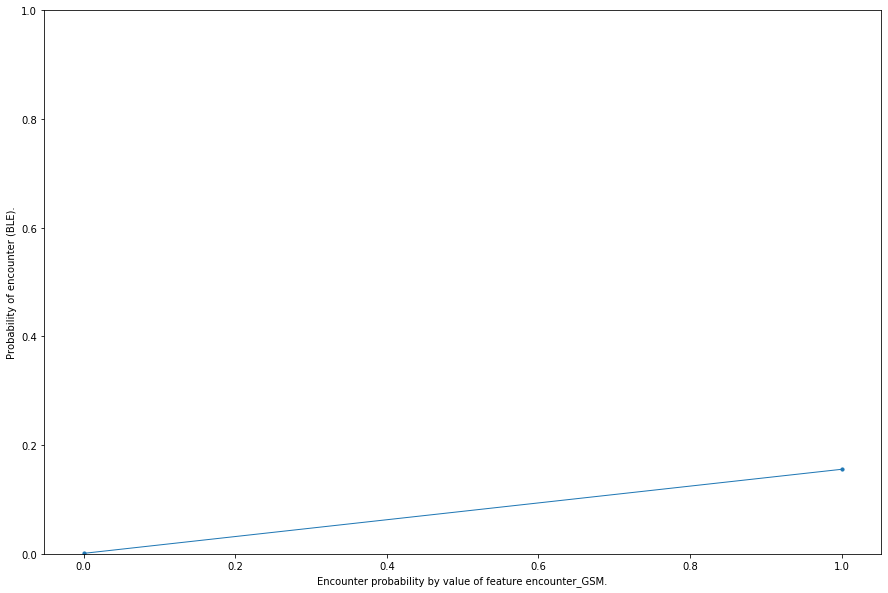

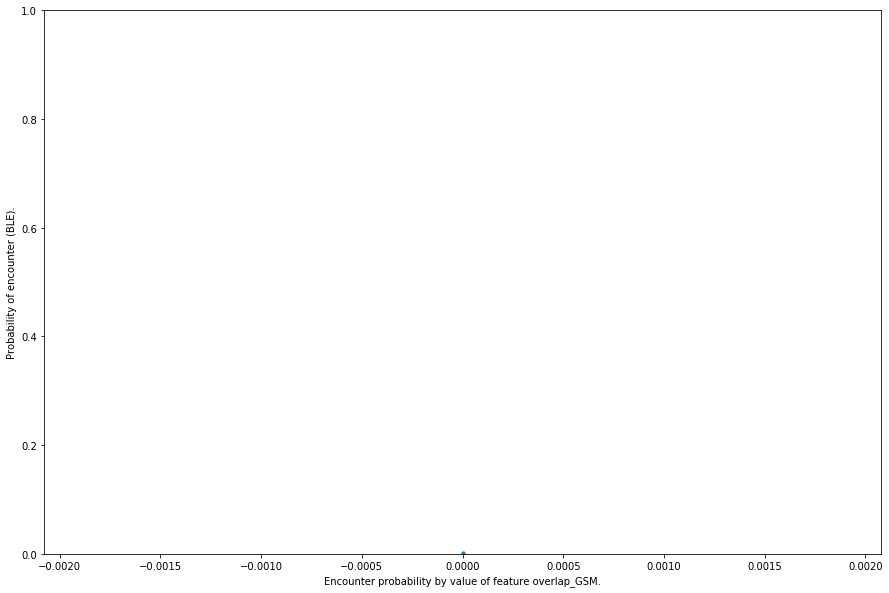

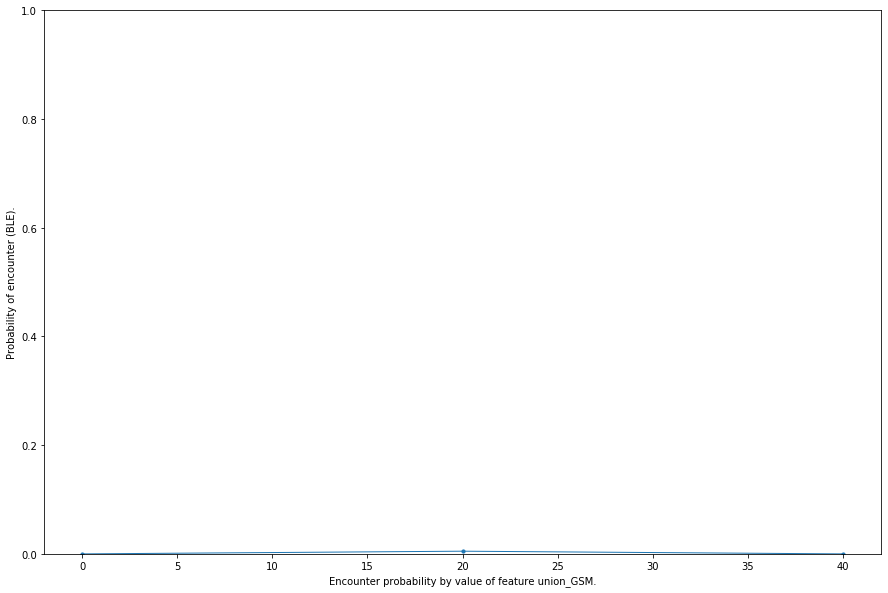

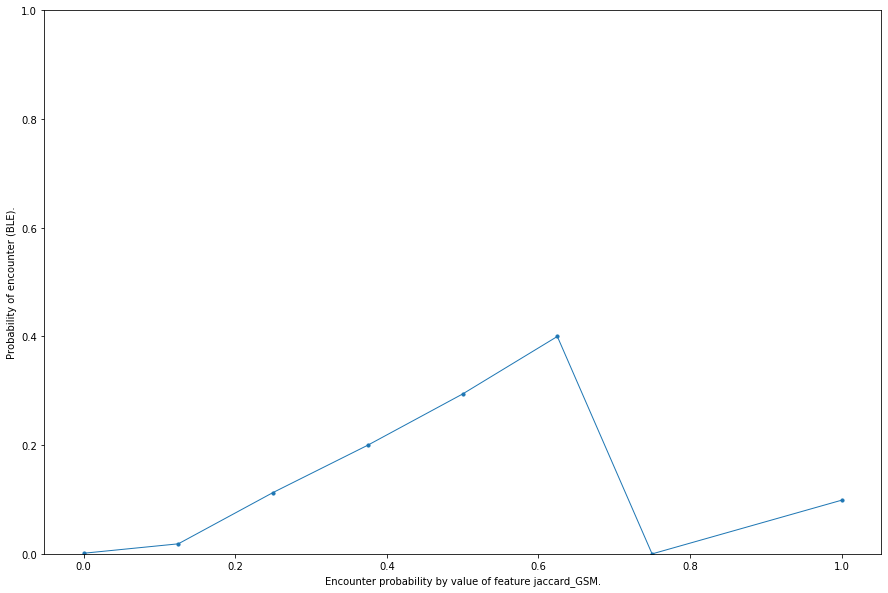

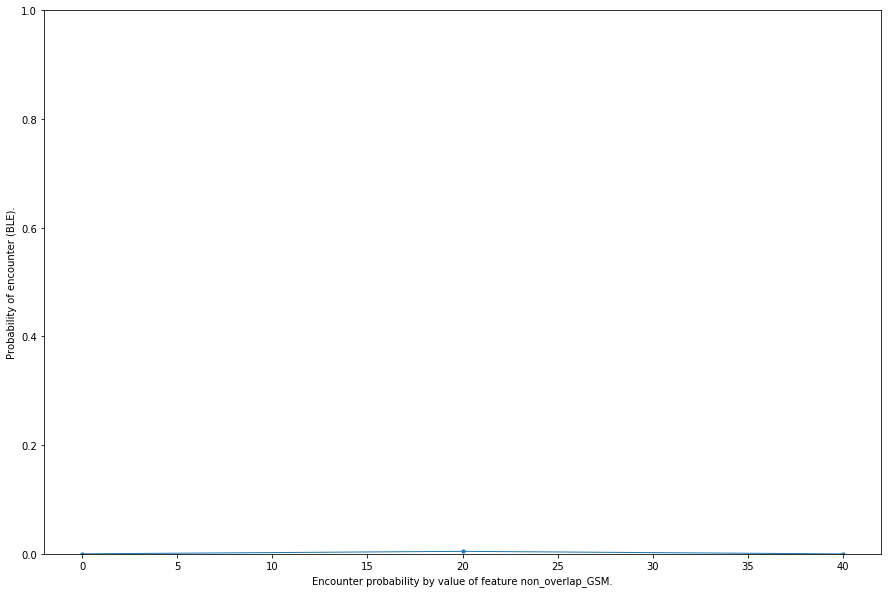

...

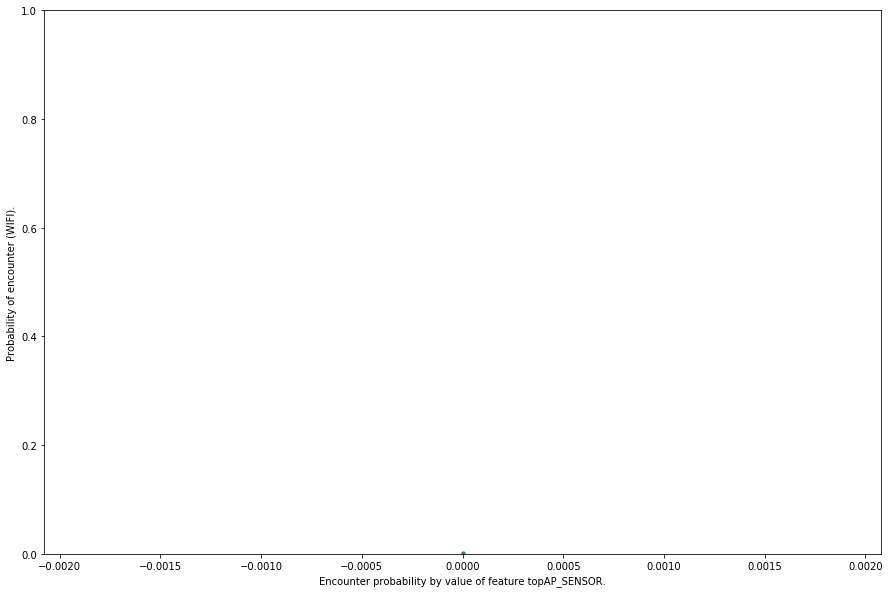

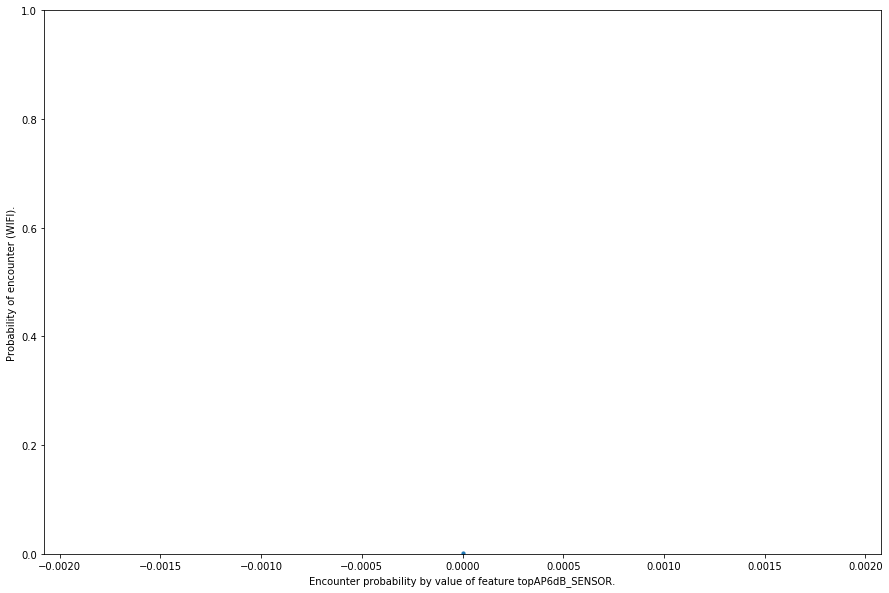

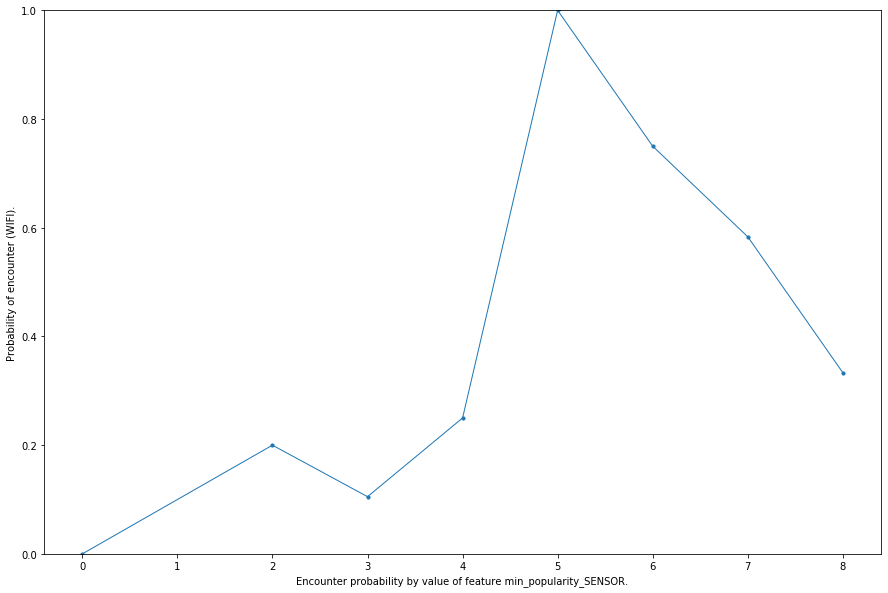

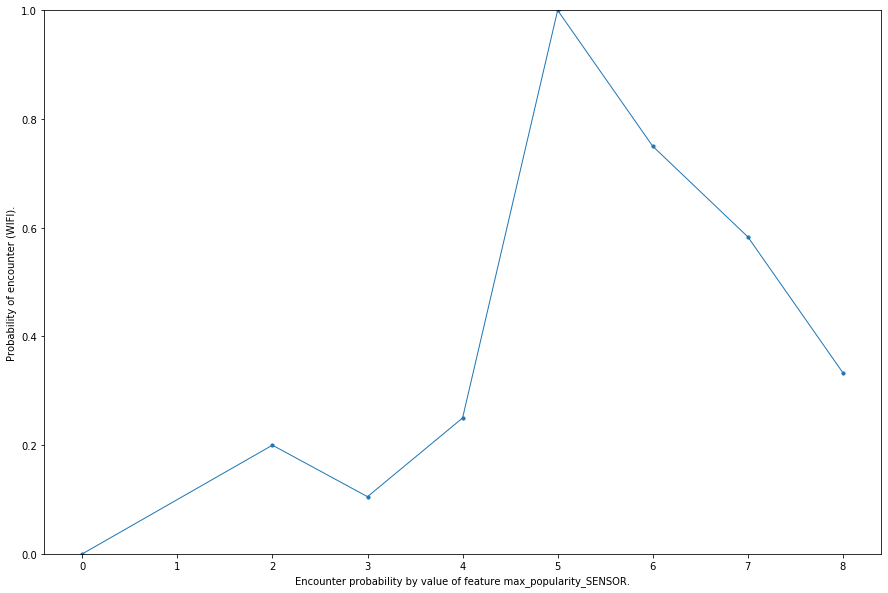

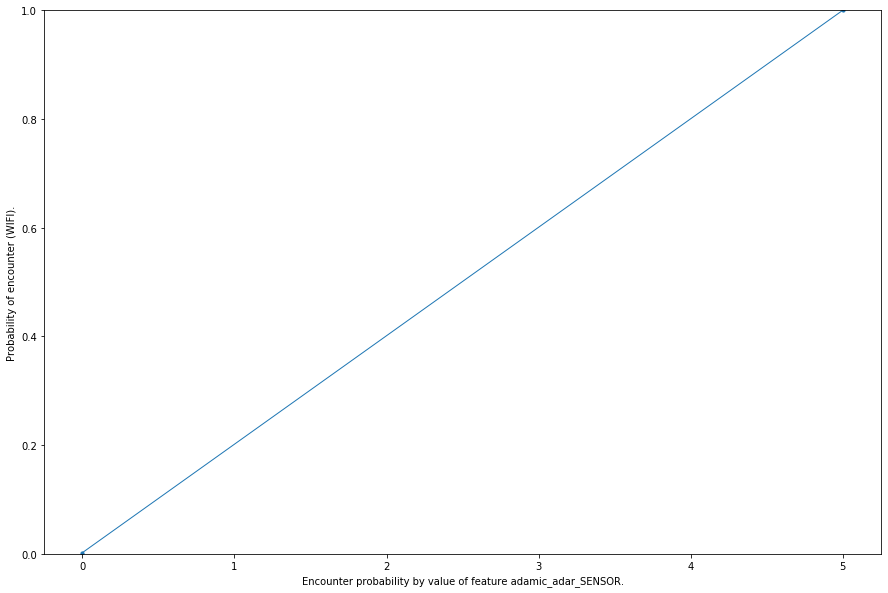

In [1613]:
for gt in groundtruth:
    for ft in features:
        if gt != ft:
            # Buckets to compute encounter rate.
            encounter_rate_data = experiment_high_rounded.filter(regex='_'+ft +'|encounter_'+gt)
            encounter_rate_ticks = {}
            for c in encounter_rate_data.columns:
                c_min = encounter_rate_data[c].min()
                c_max = encounter_rate_data[c].max()
                c_filled = encounter_rate_data.shape[0] - encounter_rate_data[c].isna().sum()
                c_unique = encounter_rate_data[c].unique()
                c_unique = c_unique[~np.isnan(c_unique)]
                c_unique = np.sort(c_unique)
                tick = (c_max-c_min)/c_unique.shape[0]
                encounter_rate_ticks[c] = c_unique
            log('['+ gt + ' ~ ' + ft + '] Computed encounter rate ticks.')
            
            # Compute encounter rate per bucket.
            encounter_rate = {}
            encounter_rate_columns = encounter_rate_data.columns.tolist()
            encounter_rate_columns.remove('encounter_'+gt)
            for c in encounter_rate_columns:
                encounter_rate[c] = encounter_rate_data[
                    [c,'encounter_'+gt]
                ].groupby(c).mean().sort_values(by=c).values.flatten().tolist()
            log('['+ gt + ' ~ ' + ft + '] Computed encounter rates.')
                
            # Plotting.
            for c in encounter_rate_columns:
                c_x = encounter_rate_ticks[c]
                c_y = encounter_rate[c]

                fig, ax = plt.subplots()
                ax.scatter(c_x, c_y, s=10, marker='o')
                ax.plot(c_x, c_y, lw=1)
                ax.set_ylim(0,1)

                ax.set_xlabel('Encounter probability by value of feature ' + c + '.')
                ax.set_ylabel('Probability of encounter (' + gt + ').')

                fig.savefig(
                    os.path.join(
                        result_path,
                        'encounter_rate_plots',
                        'encounter_rate_high_'+ delta_string + '_' + gt + '~' + ft + '_' + c +'.pdf'),
                    format="pdf", bbox_inches="tight")
                plt.show()
            log('['+ gt + ' ~ ' + ft + '] Plotting done.')

log('Feature evaluation from original paper done.')

# Interpretation

Large Manhattan distances are good indicators, because that means there were actually the same APs in reach, as otherwise we return NaN.

### 4.1.6 Random Forests

In [1671]:
random_high_gt = 'BLE'
random_high_ft = 'WIFI'
random_high_features = [s+'_'+random_high_ft for s in experiment_features]

random_high_df = experiment_high_rounded[['encounter_'+random_high_gt]+random_high_features].copy()
random_high_df = random_high_df.dropna()

labels_high = np.array(random_high_df['encounter_'+random_high_gt])
features_high = np.array(random_high_df[random_high_features])

In [1673]:
train_features_high, test_features_high, train_labels_high, test_labels_high = train_test_split(
    features_high, 
    labels_high, 
    test_size = 0.25, 
    random_state = 69)

print('Training Features Shape:', train_features_high.shape)
print('Training Labels Shape:', train_labels_high.shape)
print('Testing Features Shape:', test_features_high.shape)
print('Testing Labels Shape:', test_labels_high.shape)

Training Features Shape: (33309, 14)
Training Labels Shape: (33309,)
Testing Features Shape: (11103, 14)
Testing Labels Shape: (11103,)


Establish baseline: take most often observed encounter state. **(Obviously insanely good predictor, because not many encounters!)**

In [1674]:
baseline_high = experiment_high_rounded['encounter_'+random_high_gt].mode().values[0]
baseline_error_high = abs(baseline_high-test_labels_high)
print('Average baseline error: ', round(np.mean(baseline_error_high), 10))

Average baseline error:  0.0009907232


In [1675]:
rf_high = RandomForestRegressor(n_estimators = 1000, random_state = 69)
rf_high.fit(train_features_high, train_labels_high);

In [1679]:
predictions_high = rf_high.predict(test_features_high)
error_high = abs(predictions_high - test_labels_high)
print('Mean Absolute Error:', round(np.mean(error_high), 10))

Mean Absolute Error: 0.0018259029


In [1709]:
tree_high = rf_high.estimators_[5]
tree_high_path = os.path.join(result_path, 'tree_high.dot')
tree.export_graphviz(tree_high, out_file = tree_high_path, feature_names = random_high_features, rounded = True, precision = 5)
(graph_high, ) = pydot.graph_from_dot_file(tree_high_path)
graph_high.write_pdf(os.path.join(result_path, 'tree_high.pdf'))

In [1710]:
importances_high = list(rf_high.feature_importances_)
feature_importances_high = [(feature, round(importance, 2)) for feature, importance in zip(random_high_features, importances_high)]
feature_importances_high = sorted(feature_importances_high, key = lambda x: x[1], reverse = True)
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances_high];

Variable: adamic_adar_WIFI     Importance: 0.37
Variable: jaccard_WIFI         Importance: 0.11
Variable: overlap_WIFI         Importance: 0.09
Variable: manhattan_WIFI       Importance: 0.09
Variable: spearman_WIFI        Importance: 0.08
Variable: pearson_WIFI         Importance: 0.07
Variable: union_WIFI           Importance: 0.05
Variable: non_overlap_WIFI     Importance: 0.05
Variable: euclidean_WIFI       Importance: 0.03
Variable: max_popularity_WIFI  Importance: 0.03
Variable: topAP_WIFI           Importance: 0.02
Variable: min_popularity_WIFI  Importance: 0.01
Variable: encounter_WIFI       Importance: 0.0
Variable: topAP6dB_WIFI        Importance: 0.0


## 4.2 All Active Devices

In [55]:
data_bluetooth_all = data_bluetooth[
    data_bluetooth['device_id'].isin(devices_all_usage)][
    ['timestamp','device_id',sensor_fields['BLE']['id'], sensor_fields['BLE']['strength']]]

In [56]:
data_gsm_all = data_gsm[
    data_gsm['device_id'].isin(devices_all_usage)][
    ['timestamp','device_id',sensor_fields['GSM']['id'], sensor_fields['GSM']['strength']]]

In [57]:
data_sensor_all = data_sensor[
    data_sensor['device_id'].isin(devices_all_usage)][
    ['timestamp','device_id',sensor_fields['SENSOR']['id']]]

In [58]:
data_wifi_all = data_wifi[
    data_wifi['device_id'].isin(devices_all_usage)][
    ['timestamp','device_id',sensor_fields['WIFI']['id'], sensor_fields['WIFI']['strength']]]

### 4.2.1 Encounters by Day

In [20]:
delta_daily = pd.Timedelta('01:30:00')
devices_all_usage = devices_high_usage + devices_medium_usage + devices_low_usage

**BLUETOOTH**

In [23]:
log('[BLE] Compute number of encounters by day.', log_path)

encounters_ble_daily_all_df = None
encounters_ble_daily_all_set = False

for i in range(len(devices_all_usage)-1):
    log('[BLE] Device ' + str(i+1) + ' of ' + str(len(devices_all_usage)) + '.', log_path)
    d1 = devices_all_usage[i]
    for j in range(len(devices_all_usage)-1-i):
        log('[BLE] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_all_usage[i+1+j]
        dfi = data_bluetooth[data_bluetooth.device_id == d1].merge(
            data_bluetooth[data_bluetooth.device_id == d2], 
            on='bt_address')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bt_address']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi = dfi.groupby('day').hour.nunique()
        if dfi.shape[0] > 0:
            if not encounters_ble_daily_all_set:
                encounters_ble_daily_all_df = dfi
                encounters_ble_daily_all_set = True
            else:
                encounters_ble_daily_all_df = encounters_ble_daily_all_df.add(dfi, fill_value=0)
                
log('[BLE] Finished computing number of encounters by day.', log_path)

**GSM**

In [24]:
log('[GSM] Compute number of encounters by day.', log_path)

encounters_gsm_daily_all_df = None
encounters_gsm_daily_all_set = False

for i in range(len(devices_all_usage)-1):
    log('[GSM] Device ' + str(i+1) + ' of ' + str(len(devices_all_usage)) + '.', log_path)
    d1 = devices_all_usage[i]
    for j in range(len(devices_all_usage)-1-i):
        log('[GSM] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_all_usage[i+1+j]
        dfi = data_gsm[data_gsm.device_id == d1].merge(
            data_gsm[data_gsm.device_id == d2], 
            on='cid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'cid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi = dfi.groupby('day').hour.nunique()
        if dfi.shape[0] > 0:
            if not encounters_gsm_daily_all_set:
                encounters_gsm_daily_all_df = dfi
                encounters_gsm_daily_all_set = True
            else:
                encounters_gsm_daily_all_df = encounters_gsm_daily_all_df.add(dfi, fill_value=0)
                
log('[GSM] Finished computing number of encounters by day.', log_path)

**SENSOR WIFI**

In [25]:
log('[SENSOR] Compute number of encounters by day.', log_path)

encounters_sensor_daily_all_df = None
encounters_sensor_daily_all_set = False

for i in range(len(devices_all_usage)-1):
    log('[SENSOR] Device ' + str(i+1) + ' of ' + str(len(devices_all_usage)) + '.', log_path)
    d1 = devices_all_usage[i]
    for j in range(len(devices_all_usage)-1-i):
        log('[SENSOR] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_all_usage[i+1+j]
        dfi = data_sensor[data_sensor.device_id == d1].merge(
            data_sensor[data_sensor.device_id == d2], 
            on='bssid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bssid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi = dfi.groupby('day').hour.nunique()
        if dfi.shape[0] > 0:
            if not encounters_sensor_daily_all_set:
                encounters_sensor_daily_all_df = dfi
                encounters_sensor_daily_all_set = True
            else:
                encounters_sensor_daily_all_df = encounters_sensor_daily_all_df.add(dfi, fill_value=0)
                
log('Finished computing number of Sensor Wifi encounters by day.', log_path)

**WIFI**

In [39]:
log('[WIFI] Compute number of encounters by day.', log_path)

encounters_wifi_daily_all_df = None
encounters_wifi_daily_all_set = False

data_wifi = data_wifi[data_wifi.device_id.isin(devices_all_usage)]
data_wifi = data_wifi[['timestamp','device_id','bssid','rssi']]

for i in range(len(devices_all_usage)-1):
    log('[WIFI] Device ' + str(i+1) + ' of ' + str(len(devices_all_usage)) + '.', log_path)
    d1 = devices_all_usage[i]
    for j in range(len(devices_all_usage)-1-i):
        log('[WIFI] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_all_usage[i+1+j]
        dfi = data_wifi[data_wifi.device_id == d1].merge(
            data_wifi[data_wifi.device_id == d2], 
            on='bssid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bssid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi = dfi.groupby('day').hour.nunique()
        if dfi.shape[0] > 0:
            if not encounters_wifi_daily_all_set:
                encounters_wifi_daily_all_df = dfi
                encounters_wifi_daily_all_set = True
            else:
                encounters_wifi_daily_all_df = encounters_wifi_daily_all_df.add(dfi, fill_value=0)
            
log('[WIFI] Finished computing number of encounters by day.', log_path)

In [45]:
ground_truth_daily_all_df = pd.date_range('2018-04-26', '2018-07-15').to_frame()
ground_truth_daily_all_df.columns = ['day']

ground_truth_daily_all_df = ground_truth_daily_all_df.join(encounters_ble_daily_all_df, how='outer', rsuffix='_bluetooth', )
ground_truth_daily_all_df = ground_truth_daily_all_df.join(encounters_gsm_daily_all_df, how='outer', rsuffix='_gsm')
ground_truth_daily_all_df = ground_truth_daily_all_df.join(encounters_sensor_daily_all_df, how='outer', rsuffix='_sensor')
ground_truth_daily_all_df = ground_truth_daily_all_df.join(encounters_wifi_daily_all_df, how='outer', rsuffix='_wifi')

ground_truth_daily_all_df.columns = ['day','bluetooth', 'gsm', 'sensor', 'wifi']
ground_truth_daily_all_df = ground_truth_daily_all_df.fillna(0)
ground_truth_daily_all_df = ground_truth_daily_all_df[['bluetooth', 'gsm', 'sensor', 'wifi']]

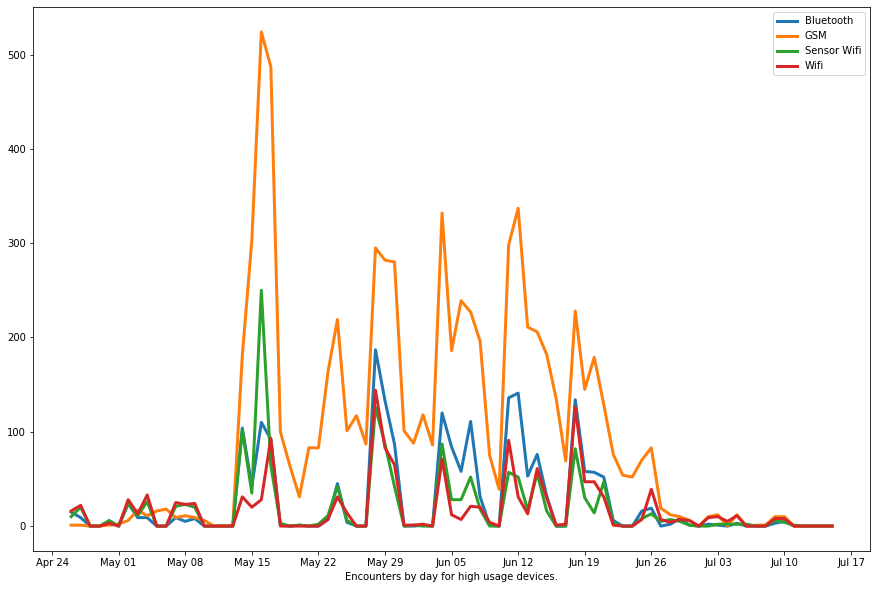

In [48]:
fig, ax = plt.subplots()
ax.plot(ground_truth_daily_all_df.index, ground_truth_daily_all_df['bluetooth'].values)
ax.plot(ground_truth_daily_all_df.index, ground_truth_daily_all_df['gsm'].values)
ax.plot(ground_truth_daily_all_df.index, ground_truth_daily_all_df['sensor'].values)
ax.plot(ground_truth_daily_all_df.index, ground_truth_daily_all_df['wifi'].values)
#ax.xaxis.set_major_locator(plt.MaxNLocator(5))
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.xaxis.set_major_locator(mdates.WeekdayLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_daily_all_comparison_line_overlaid.pdf'), format="pdf", bbox_inches="tight")
plt.show()

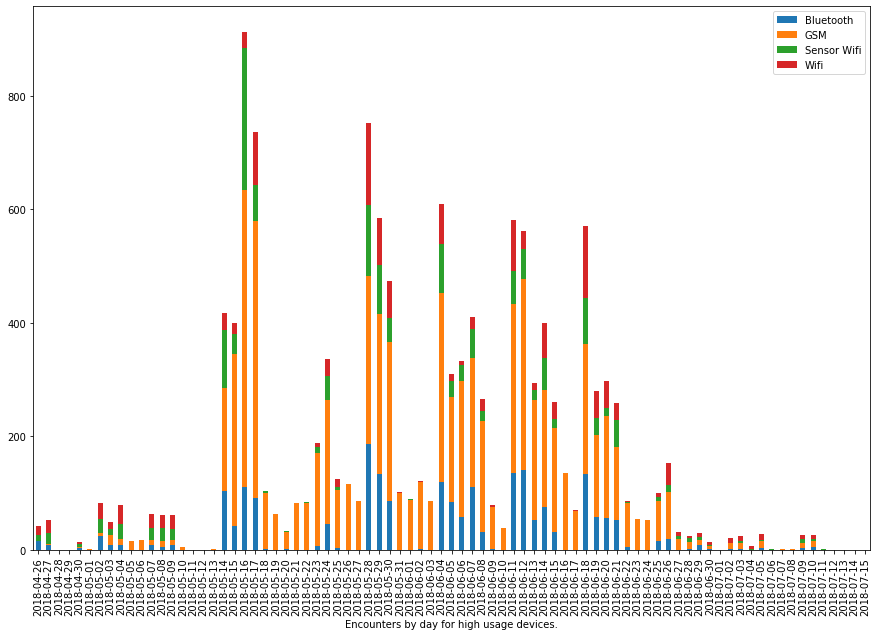

In [50]:
ax = ground_truth_daily_all_df.plot(kind='bar', stacked=True)
fig = ax.get_figure()
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xticklabels([pd.datetime.strftime(d,'%Y-%m-%d') for d in ground_truth_daily_all_df.index])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_daily_all_comparison_bar_stacked.pdf'), format="pdf", bbox_inches="tight")
plt.show()

### 4.2.2 Drilldown to Busy Timespans

In [59]:
delta_hourly = pd.Timedelta('00:05:00')
delta_string = '5min'
candidates_hourly = ['2018-05-28',
                     '2018-06-18']
candidates_hourly_date = [pd.datetime.strptime(c, '%Y-%m-%d') for c in candidates_hourly]

In [60]:
data_bluetooth_busy_all = date_frame(data_bluetooth_all)
data_bluetooth_busy_all = data_bluetooth_busy_all[data_bluetooth_busy_all['date'].isin(candidates_hourly)]

In [61]:
data_gsm_busy_all = date_frame(data_gsm_all)
data_gsm_busy_all = data_gsm_busy_all[data_gsm_busy_all['date'].isin(candidates_hourly)]

In [62]:
data_sensor_busy_all = date_frame(data_sensor_all)
data_sensor_busy_all = data_sensor_busy_all[data_sensor_busy_all['date'].isin(candidates_hourly)]

In [63]:
data_wifi_busy_all = date_frame(data_wifi_all)
data_wifi_busy_all = data_wifi_busy_all[data_wifi_busy_all['date'].isin(candidates_hourly)]

**BLUETOOTH**

In [64]:
log('[BLE] Compute number of encounters by hour.', log_path)

encounters_ble_busy_all_df = None
encounters_ble_busy_all_set = False

for i in range(len(devices_all_usage)-1):
    log('[BLE] Device ' + str(i+1) + ' of ' + str(len(devices_all_usage)) + '.', log_path)
    d1 = devices_all_usage[i]
    for j in range(len(devices_all_usage)-1-i):
        log('[BLE] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_all_usage[i+1+j]
        dfi = data_bluetooth_busy_all[data_bluetooth_busy_all.device_id == d1].merge(
            data_bluetooth_busy_all[data_bluetooth_busy_all.device_id == d2], 
            on='bt_address')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_hourly) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_hourly)]
        dfi = dfi[['timestamp_x', 'bt_address']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi['minutes'] = dfi.timestamp_x.dt.round('5min')
        dfi = dfi.groupby('hour').minutes.nunique()
        if dfi.shape[0] > 0:
            if not encounters_ble_busy_all_set:
                encounters_ble_busy_all_df = dfi
                encounters_ble_busy_all_set = True
            else:
                encounters_ble_busy_all_df = encounters_ble_busy_all_df.add(dfi, fill_value=0)
                
log('[BLE] Finished computing number of encounters by hour: ' + str(encounters_ble_busy_all_df.shape[0]), log_path)

**GSM**

In [65]:
log('[GSM] Compute number of encounters by hour.', log_path)

encounters_gsm_busy_all_df = None
encounters_gsm_busy_all_set = False

for i in range(len(devices_all_usage)-1):
    log('[GSM] Device ' + str(i+1) + ' of ' + str(len(devices_all_usage)) + '.', log_path)
    d1 = devices_all_usage[i]
    for j in range(len(devices_all_usage)-1-i):
        log('[GSM] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_all_usage[i+1+j]
        dfi = data_gsm_busy_all[data_gsm_busy_all.device_id == d1].merge(
            data_gsm_busy_all[data_gsm_busy_all.device_id == d2], 
            on='cid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_hourly) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_hourly)]
        dfi = dfi[['timestamp_x', 'cid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi['minutes'] = dfi.timestamp_x.dt.round('5min')
        dfi = dfi.groupby('hour').minutes.nunique()
        if dfi.shape[0] > 0:
            if not encounters_gsm_busy_all_set:
                encounters_gsm_busy_all_df = dfi
                encounters_gsm_busy_all_set = True
            else:
                encounters_gsm_busy_all_df = encounters_gsm_busy_all_df.add(dfi, fill_value=0)
                
log('[GSM] Finished computing number of encounters by hour: ' + str(encounters_gsm_busy_all_df.shape[0]), log_path)

**SENSOR WIFI**

In [66]:
log('[SENSOR] Compute number of encounters by hour.', log_path)

encounters_sensor_busy_all_df = None
encounters_sensor_busy_all_set = False

for i in range(len(devices_all_usage)-1):
    log('[SENSOR] Device ' + str(i+1) + ' of ' + str(len(devices_all_usage)) + '.', log_path)
    d1 = devices_all_usage[i]
    for j in range(len(devices_all_usage)-1-i):
        log('[SENSOR] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_all_usage[i+1+j]
        dfi = data_sensor_busy_all[data_sensor_busy_all.device_id == d1].merge(
            data_sensor_busy_all[data_sensor_busy_all.device_id == d2], 
            on='bssid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bssid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi['minutes'] = dfi.timestamp_x.dt.round('5min')
        dfi = dfi.groupby('hour').minutes.nunique()
        if dfi.shape[0] > 0:
            if not encounters_sensor_busy_all_set:
                encounters_sensor_busy_all_df = dfi
                encounters_sensor_busy_all_set = True
            else:
                encounters_sensor_busy_all_df = encounters_sensor_busy_all_df.add(dfi, fill_value=0)
                
log('[SENSOR] Finished computing number of encounters by hour: ' + str(encounters_sensor_busy_all_df.shape[0]), log_path)

**WIFI**

In [67]:
log('[WIFI] Compute number of encounters by hour.', log_path)

encounters_wifi_busy_all_df = None
encounters_wifi_busy_all_set = False

for i in range(len(devices_all_usage)-1):
    log('[WIFI] Device ' + str(i+1) + ' of ' + str(len(devices_all_usage)) + '.', log_path)
    d1 = devices_all_usage[i]
    for j in range(len(devices_all_usage)-1-i):
        log('[WIFI] Joining ' + str(i+1) + ' --> ' + str(i+j+2) + '.', log_path)
        d2 = devices_all_usage[i+1+j]
        dfi = data_wifi_busy_all[data_wifi_busy_all.device_id == d1].merge(
            data_wifi_busy_all[data_wifi_busy_all.device_id == d2], 
            on='bssid')
        dfi = dfi[(dfi.timestamp_x-dfi.timestamp_y < delta_daily) & 
                  (dfi.timestamp_y-dfi.timestamp_x < delta_daily)]
        dfi = dfi[['timestamp_x', 'bssid']]
        dfi['day'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d')
        dfi['hour'] = dfi.timestamp_x.dt.strftime('%Y-%m-%d %H')
        dfi['minutes'] = dfi.timestamp_x.dt.round('5min')
        dfi = dfi.groupby('hour').minutes.nunique()
        if dfi.shape[0] > 0:
            if not encounters_wifi_busy_all_set:
                encounters_wifi_busy_all_df = dfi
                encounters_wifi_busy_all_set = True
            else:
                encounters_wifi_busy_all_df = encounters_wifi_busy_all_df.add(dfi, fill_value=0)
                
log('[WIFI] Finished computing number of encounters by hour: ' + str(encounters_wifi_busy_all_df.shape[0]), log_path)

In [68]:
ground_truth_busy_all_df = pd.date_range(
    candidates_hourly_date[0], 
    candidates_hourly_date[0]+timedelta(days=1),
    freq='H'
).to_frame()

for date in candidates_hourly_date[1:]:
    df = pd.date_range(date, date+timedelta(days=1), freq='H').to_frame()
    ground_truth_busy_all_df = pd.concat([ground_truth_busy_all_df,df])
ground_truth_busy_all_df.columns = ['hour']

ground_truth_busy_all_df = ground_truth_busy_all_df.join(encounters_ble_busy_all_df, how='outer', rsuffix='_bluetooth')
ground_truth_busy_all_df = ground_truth_busy_all_df.join(encounters_gsm_busy_all_df, how='outer', rsuffix='_gsm')
ground_truth_busy_all_df = ground_truth_busy_all_df.join(encounters_sensor_busy_all_df, how='outer', rsuffix='_sensor')
ground_truth_busy_all_df = ground_truth_busy_all_df.join(encounters_wifi_busy_all_df, how='outer', rsuffix='_wifi')

ground_truth_busy_all_df.columns = ['hour','bluetooth', 'gsm', 'sensor', 'wifi']
ground_truth_busy_all_df = ground_truth_busy_all_df.fillna(0)

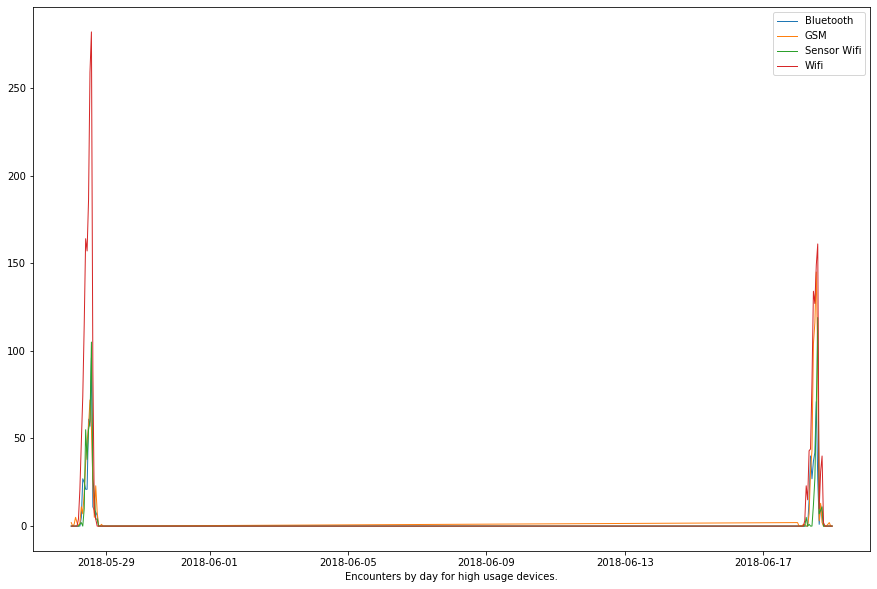

In [69]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_all_df.index, ground_truth_busy_all_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_all_df.index, ground_truth_busy_all_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_all_df.index, ground_truth_busy_all_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_all_df.index, ground_truth_busy_all_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_all_'+delta_string+'_comparison_line_overlaid.pdf'), format="pdf", bbox_inches="tight")
plt.show()

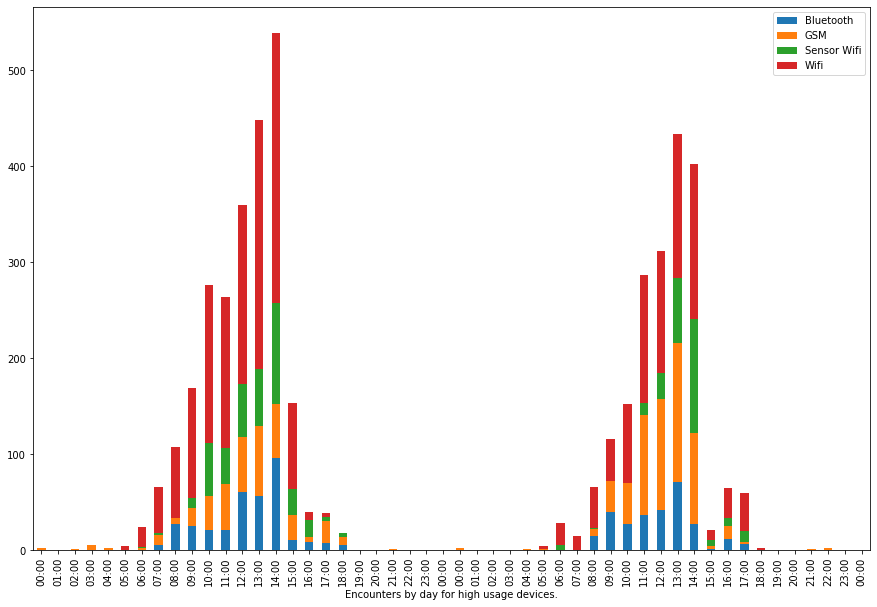

In [70]:
ax = ground_truth_busy_all_df[['bluetooth','gsm','sensor','wifi']].plot(kind='bar', stacked=True)
fig = ax.get_figure()
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xticklabels([pd.datetime.strftime(d, '%H:%M') for d in ground_truth_busy_all_df.index])
ax.set_xlabel('Encounters by day for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_all_'+delta_string+'_comparison_bar_stacked.pdf'), format="pdf", bbox_inches="tight")
plt.show()

In [71]:
ground_truth_busy_all_df['date'] = ground_truth_busy_all_df['hour'].apply(day_from_timestamp)

ground_truth_busy_all_2018_05_28_df = ground_truth_busy_all_df[ground_truth_busy_all_df['date'] == '2018-05-28']
ground_truth_busy_all_2018_06_18_df = ground_truth_busy_all_df[ground_truth_busy_all_df['date'] == '2018-06-18']

In [72]:
ground_truth_busy_all_2018_05_28_df

,hour,bluetooth,gsm,sensor,wifi,date
2018-05-28 00:00:00,2018-05-28 00:00:00,0.000,2.000,0.000,0.000,2018-05-28
2018-05-28 01:00:00,2018-05-28 01:00:00,0.000,0.000,0.000,0.000,2018-05-28
2018-05-28 02:00:00,2018-05-28 02:00:00,0.000,1.000,0.000,0.000,2018-05-28
2018-05-28 03:00:00,2018-05-28 03:00:00,0.000,5.000,0.000,0.000,2018-05-28
2018-05-28 04:00:00,2018-05-28 04:00:00,0.000,2.000,0.000,0.000,2018-05-28
2018-05-28 05:00:00,2018-05-28 05:00:00,0.000,0.000,0.000,4.000,2018-05-28
2018-05-28 06:00:00,2018-05-28 06:00:00,0.000,2.000,1.000,21.000,2018-05-28
2018-05-28 07:00:00,2018-05-28 07:00:00,5.000,11.000,2.000,48.000,2018-05-28
2018-05-28 08:00:00,2018-05-28 08:00:00,27.000,7.000,0.000,74.000,2018-05-28
2018-05-28 09:00:00,2018-05-28 09:00:00,25.000,19.000,10.000,115.000,2018-05-28


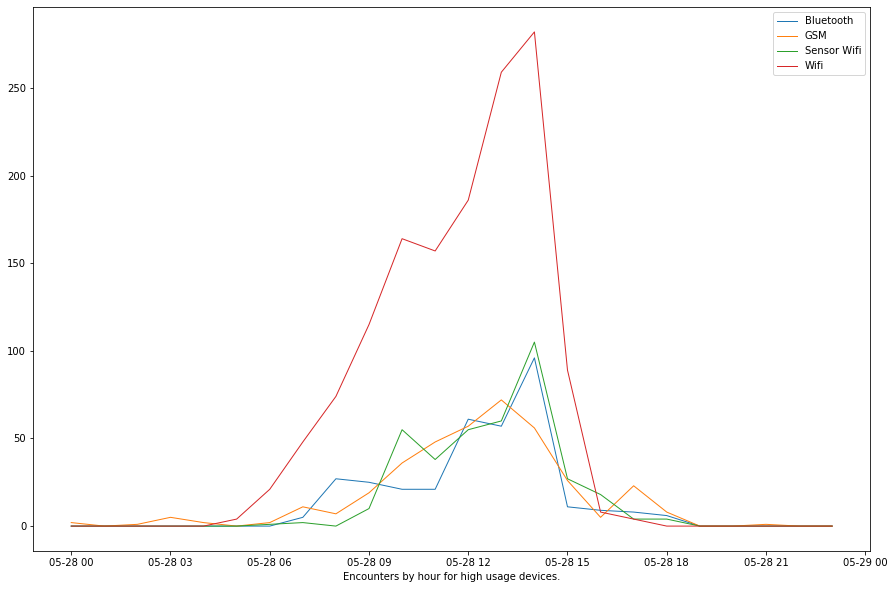

In [75]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_all_2018_05_28_df.index, ground_truth_busy_all_2018_05_28_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_all_2018_05_28_df.index, ground_truth_busy_all_2018_05_28_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_all_2018_05_28_df.index, ground_truth_busy_all_2018_05_28_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_all_2018_05_28_df.index, ground_truth_busy_all_2018_05_28_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by hour for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_all_'+delta_string+'_comparison_line_overlaid_2018_05_28.pdf'), format="pdf", bbox_inches="tight")
plt.show()

In [74]:
ground_truth_busy_all_2018_06_18_df

,hour,bluetooth,gsm,sensor,wifi,date
2018-06-18 00:00:00,2018-06-18 00:00:00,0.000,2.000,0.000,0.000,2018-06-18
2018-06-18 01:00:00,2018-06-18 01:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 02:00:00,2018-06-18 02:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 03:00:00,2018-06-18 03:00:00,0.000,0.000,0.000,0.000,2018-06-18
2018-06-18 04:00:00,2018-06-18 04:00:00,0.000,1.000,0.000,0.000,2018-06-18
2018-06-18 05:00:00,2018-06-18 05:00:00,0.000,1.000,0.000,3.000,2018-06-18
2018-06-18 06:00:00,2018-06-18 06:00:00,0.000,0.000,5.000,23.000,2018-06-18
2018-06-18 07:00:00,2018-06-18 07:00:00,0.000,0.000,0.000,15.000,2018-06-18
2018-06-18 08:00:00,2018-06-18 08:00:00,15.000,7.000,1.000,43.000,2018-06-18
2018-06-18 09:00:00,2018-06-18 09:00:00,40.000,32.000,0.000,44.000,2018-06-18


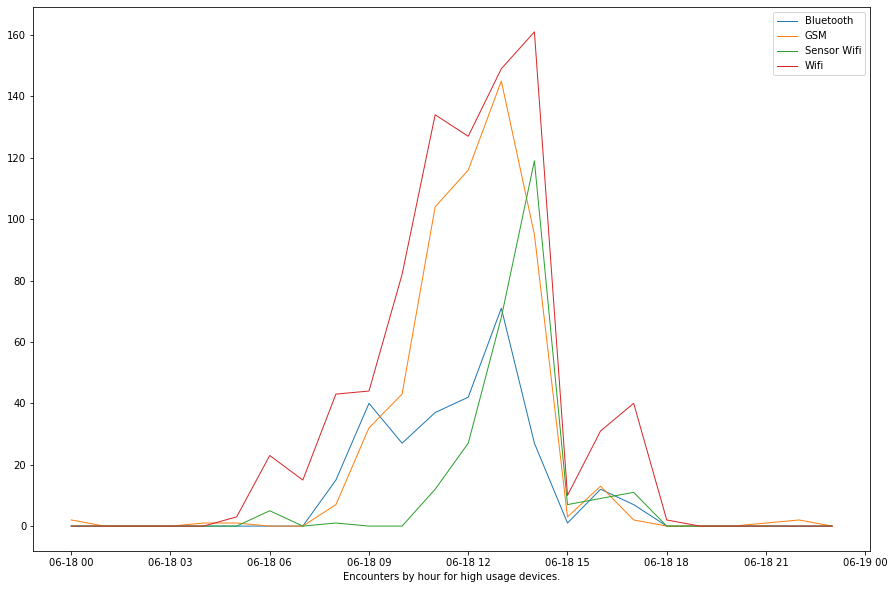

In [76]:
fig, ax = plt.subplots()
ax.plot(ground_truth_busy_all_2018_06_18_df.index, ground_truth_busy_all_2018_06_18_df['bluetooth'].values, linewidth=1)
ax.plot(ground_truth_busy_all_2018_06_18_df.index, ground_truth_busy_all_2018_06_18_df['gsm'].values, linewidth=1)
ax.plot(ground_truth_busy_all_2018_06_18_df.index, ground_truth_busy_all_2018_06_18_df['sensor'].values, linewidth=1)
ax.plot(ground_truth_busy_all_2018_06_18_df.index, ground_truth_busy_all_2018_06_18_df['wifi'].values, linewidth=1)
ax.legend(['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi'])
ax.set_xlabel('Encounters by hour for high usage devices.')

fig.savefig(os.path.join(result_path, 'encounters_busy_all_'+delta_string+'_comparison_line_overlaid_2018_06_18.pdf'), format="pdf", bbox_inches="tight")
plt.show()

**Busiest Timespans**
- 2018-05-28 08:00 - 14:00
- 2018-06-18 08:00 - 14:00

In [77]:
experiment_times = [('2018-05-28 08:00','2018-05-28 14:00'),
                    ('2018-06-18 08:00','2018-06-18 14:00'),
                   ]
experiment_frequency = '10min'

In [78]:
experiment_steps = [pd.date_range(pd.datetime.strptime(et[0], '%Y-%m-%d %H:%M'),
                                  pd.datetime.strptime(et[1], '%Y-%m-%d %H:%M'),
                                  freq=experiment_frequency)
                    for et in experiment_times]

### 4.2.3 Experiment Data: Ground Truth and Features (All Active Devices)

In [79]:
experiment_all_usage = {}

for device1 in devices_all_usage:
    for device2 in devices_all_usage:
        if device1 != device2:
            for day in experiment_steps:
                for step in range(len(day) - 1):
                    key = device1 + '|' + device2 + '|' + str(day[step]) + '|' + str(day[step+1])
                    experiment_all_usage[key] = {
                        "key": key,
                        "device_1": device1,
                        "device_2": device2,
                        "starttime": day[step],
                        "endtime": day[step+1]
                    }
                    for sensor in experiment_sensors:
                        for feature in experiment_features:
                            experiment_all_usage[key][feature + '_' + sensor] = 0

Only fill half of it, ~then copy to vice versa entries~. First do all Wifi entries, then all bluetooth.

In [80]:
def original_features(devices, experiment, logfile):
    for sensor in experiment_sensors:
        log('[' + sensor + '] Start computing non-popularity features.', logfile)
        sensor_id = sensor_fields[sensor]['id']
        sensor_strength = sensor_fields[sensor]['strength']
        for device in range(len(devices)-1):
            log('[' + sensor + '] Device ' + str(device+1) + ' of ' + str(len(devices_all_usage)), logfile)
            device1 = devices_all_usage[device]
            for d in range(len(devices)-1-device):
                device2 = devices_all_usage[device+1+d]
                if sensor == 'BLE':
                    df_devices = data_bluetooth_all[data_bluetooth_all['device_id'].isin([device1, device2])]
                if sensor == 'GSM':
                    df_devices = data_gsm_all[data_gsm_all['device_id'].isin([device1, device2])]
                if sensor == 'SENSOR':
                    df_devices = data_sensor_all[data_sensor_all['device_id'].isin([device1, device2])]
                if sensor == 'WIFI':
                    df_devices = data_wifi_all[data_wifi_all['device_id'].isin([device1, device2])]
                log('[' + sensor + '] Features for ' + str(device+1) + ' --> ' + str(device+d+2) + '.', log_path)
                for day in experiment_steps:
                    for step in range(len(day) - 1):
                        step_start = day[step]
                        step_end = day[step+1]
                        df_step = df_devices[(df_devices['timestamp'] >= step_start) & (df_devices['timestamp'] <= step_end)]
                        key = device1 + '|' + device2 + '|' + str(step_start) + '|' + str(step_end)
                        experiment[key]['encounter_' + sensor] = get_encounter(
                            device1, device2, df_step, sensor_id, step_start, step_end, 180)
                        experiment[key]['overlap_' + sensor] = overlap(
                            device1, device2, df_step, sensor_id, step_start, step_end)
                        experiment[key]['union_' + sensor] = union(
                            device1, device2, df_step, sensor_id, step_start, step_end)
                        experiment[key]['jaccard_' + sensor] = jaccard(
                            device1, device2, df_step, sensor_id, step_start, step_end)
                        experiment[key]['non_overlap_' + sensor] = non_overlap(
                            device1, device2, df_step, sensor_id, step_start, step_end)
                        if sensor != 'SENSOR':
                            experiment[key]['spearman_' + sensor] = spearman(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['pearson_' + sensor] = pearson(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['manhattan_' + sensor] = manhattan(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['euclidean_' + sensor] = euclidean(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['topAP_' + sensor] = topAP(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
                            experiment[key]['topAP6dB_' + sensor] = topAP6dB(
                                device1, device2, df_step, sensor_id, sensor_strength, step_start, step_end)
    log('[' + sensor + '] Features and encounters computed.',logfile)

Popularity features have to be computed based on the records of all devices, so we are unable to compute them using the heavily filtered dataframes from above and have to iterate a second time.

In [81]:
def original_features_popularity(devices, experiment, logfile):
    for sensor in experiment_sensors:
        log('[' + sensor + '] Start computing popularity features.', logfile)
        sensor_id = sensor_fields[sensor]['id']
        for day in experiment_steps:
            for step in range(len(day) - 1):
                step_start = day[step]
                step_end = day[step+1]
                pop_aps = {}
                pop_dev = {}
                if sensor == 'BLE':
                    data = data_bluetooth[['timestamp',sensor_id,'device_id']]
                if sensor == 'GSM':
                    data = data_gsm[['timestamp',sensor_id,'device_id']]
                if sensor == 'SENSOR':
                    data = data_sensor[['timestamp',sensor_id,'device_id']]
                if sensor == 'WIFI':
                    data = data_wifi_all[['timestamp',sensor_id,'device_id']]
                popularity_efficient(pop_aps,
                                     pop_dev,
                                     data,
                                     sensor_id,
                                     step_start,
                                     step_end
                                    )
                log('[' + sensor + '] Popularity computed for: ' + pd.datetime.strftime(step_start, '%Y-%m-%d %H:%M') + ' --> ' + pd.datetime.strftime(step_end, '%Y-%m-%d %H:%M'), logfile)
                for device in range(len(devices)-1):
                    device1 = devices_all_usage[device]
                    for d in range(len(devices)-1-device):
                        device2 = devices_all_usage[device+1+d]
                        key = device1 + '|' + device2 + '|' + str(step_start) + '|' + str(step_end)
                        experiment[key]['min_popularity_' + sensor] = min_popularity_efficient(device1,device2,pop_aps,pop_dev)
                        experiment[key]['max_popularity_' + sensor] = max_popularity_efficient(device1,device2,pop_aps,pop_dev)
                        experiment[key]['adamic_adar_' + sensor] = adamic_adar_efficient(device1,device2,pop_aps,pop_dev)
        log('[' + sensor + '] Popularity features computed.', logfile)    

In [ ]:
original_features(devices_all_usage, experiment_all_usage, log_path)
original_features_popularity(devices_all_usage, experiment_all_usage, log_path)

/u/home/starkc/.local/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in double_scalars
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
log('Transform into dataframe.', log_path)
experiment_all_10min_df = pd.DataFrame.from_dict(experiment_all_usage, orient='index')
log('Transformed into dataframe.', log_path)
experiment_all_10min_df.to_parquet(os.path.join(result_path, 'experiment_all_' + experiment_frequency + '.parquet'))
log('Exported as parquet.', log_path)

### 4.2.4 Overview

In [109]:
enc_all = {}
for sensor in experiment_sensors:
    enc_all[sensor] = experiment_all_10min_df[experiment_all_10min_df['encounter_'+sensor] == 1].index

enc_all_comb = np.empty([5,4])
for i, sensor1 in enumerate(experiment_sensors):
    for j, sensor2 in enumerate(experiment_sensors):
        enc_all_comb[i+1,j] = int(np.intersect1d(enc_all[sensor1],enc_all[sensor2]).shape[0])
        
enc_all_columns = ['Bluetooth', 'GSM', 'Sensor Wifi', 'Wifi']
enc_all_values = [enc_all['BLE'].shape[0], enc_all['GSM'].shape[0], enc_all['SENSOR'].shape[0], enc_all['WIFI'].shape[0]]

enc_all_comb = enc_all_comb.tolist()
enc_all_comb[0] = enc_all_columns
enc_all_comb = list(map(list, zip(*enc_all_comb)))

enc_df = pd.DataFrame(data=enc_all_comb, columns=['']+enc_all_columns)
enc_df.head()

,,Bluetooth,GSM,Sensor Wifi,Wifi
0,Bluetooth,252.000,20.000,24.000,93.000
1,GSM,20.000,386.000,8.000,27.000
2,Sensor Wifi,24.000,8.000,51.000,33.000
3,Wifi,93.000,27.000,33.000,257.000


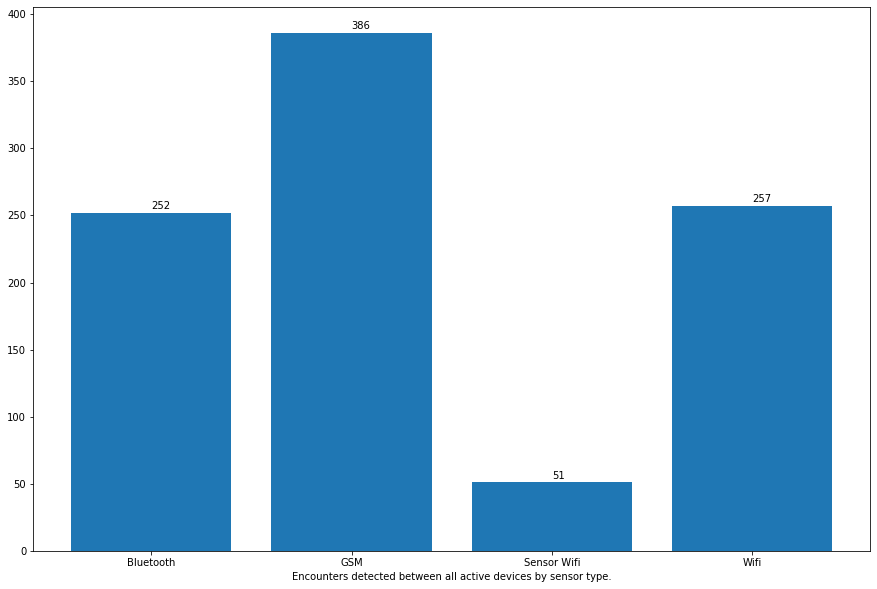

In [112]:
fig, ax = plt.subplots()
ax.bar(enc_all_columns, enc_all_values, align='center')
for i, v in enumerate(enc_all_values):
    ax.text(i, v + 5, str(v), va='center')
ax.set_xlabel('Encounters detected between all active devices by sensor type.')

fig.savefig(os.path.join(result_path, 'encounters_all_'+delta_string+'_bysensor.pdf'), format="pdf", bbox_inches="tight")
plt.show()

### 4.2.5 Encounter Rates by Feature Value

In [114]:
experiment_all_rounded = experiment_all_10min_df.copy()

for sensor in experiment_sensors:
    for c in ['jaccard_'+sensor, 'pearson_'+sensor, 'spearman_'+sensor]:
        experiment_all_rounded[c] = myround(experiment_all_rounded[c], prec=3, base=0.125)
    
    experiment_all_rounded['overlap_'+sensor] = myround(experiment_all_rounded['overlap_'+sensor], base=10)
    
    for c in ['union_'+sensor,'non_overlap_'+sensor]:
        experiment_all_rounded[c] = myround(experiment_all_rounded[c], 20)
    
    experiment_all_rounded['manhattan_'+sensor] = myround(experiment_all_rounded['manhattan_'+sensor], prec=1, base=2.5)
    experiment_all_rounded['euclidean_'+sensor] = myround(experiment_all_rounded['euclidean_'+sensor], prec=1, base=2.5)

    # TODO: rounding for popularity features
    experiment_all_rounded['adamic_adar_'+sensor] = myround(experiment_all_rounded['adamic_adar_'+sensor], base=5)

In [115]:
groundtruth = ['BLE',
               'GSM',
               'SENSOR',
               'WIFI'
              ]

features = ['BLE',
            'GSM',
            'SENSOR',
            'WIFI'
           ]

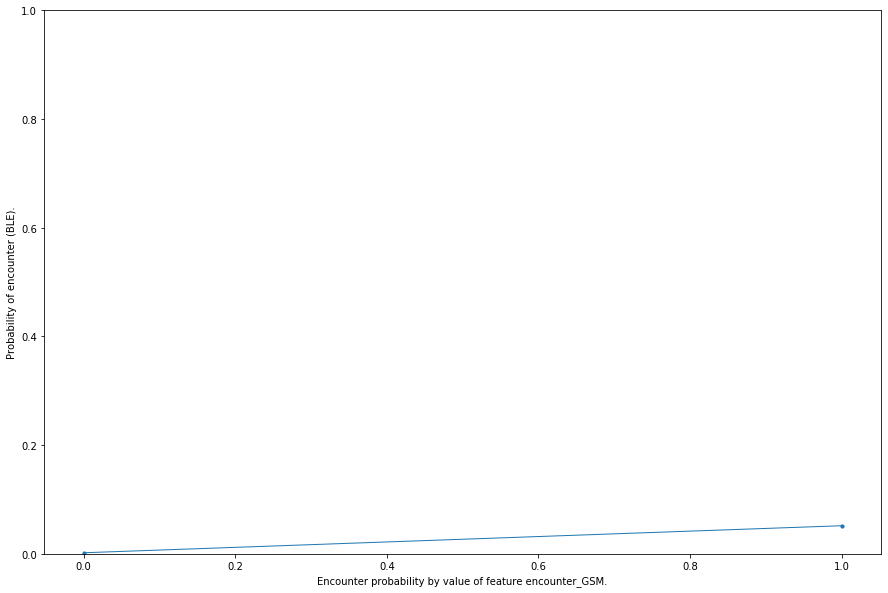

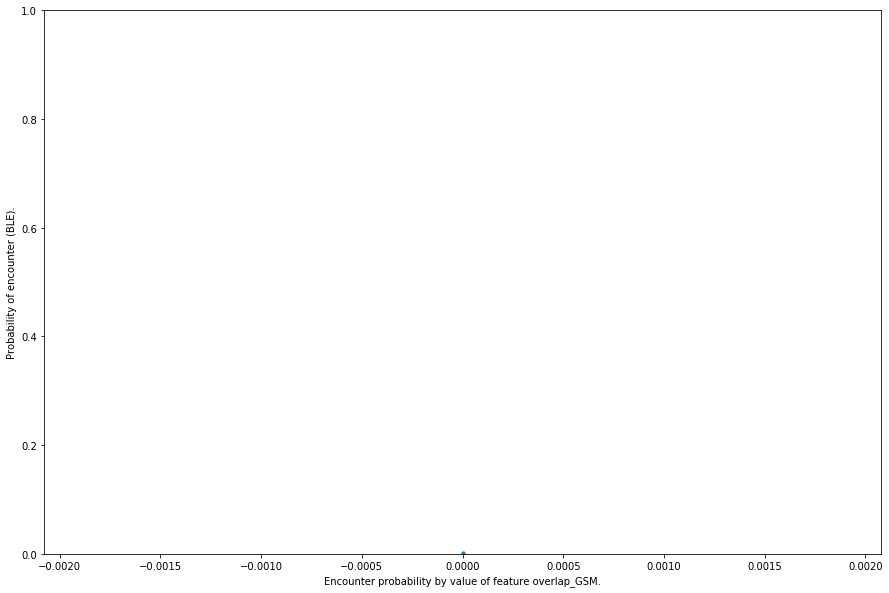

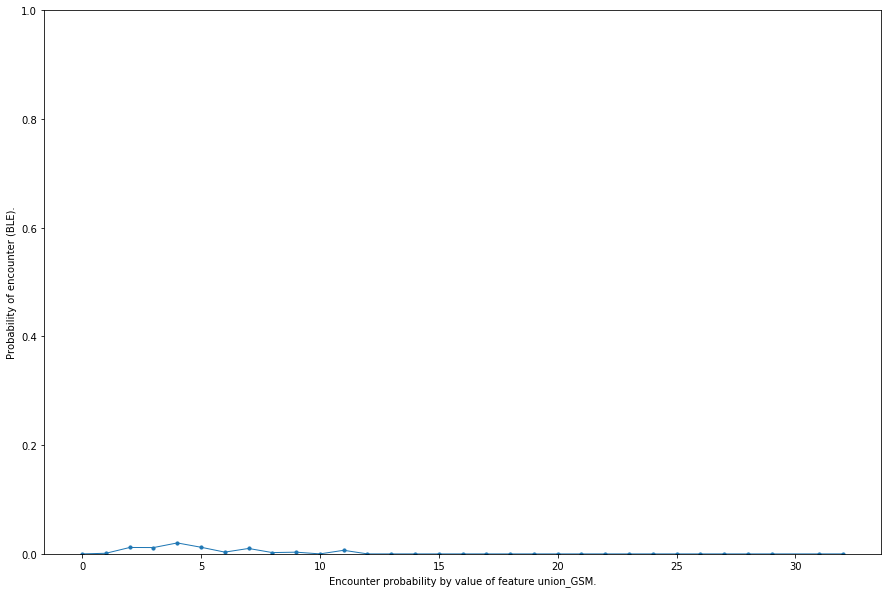

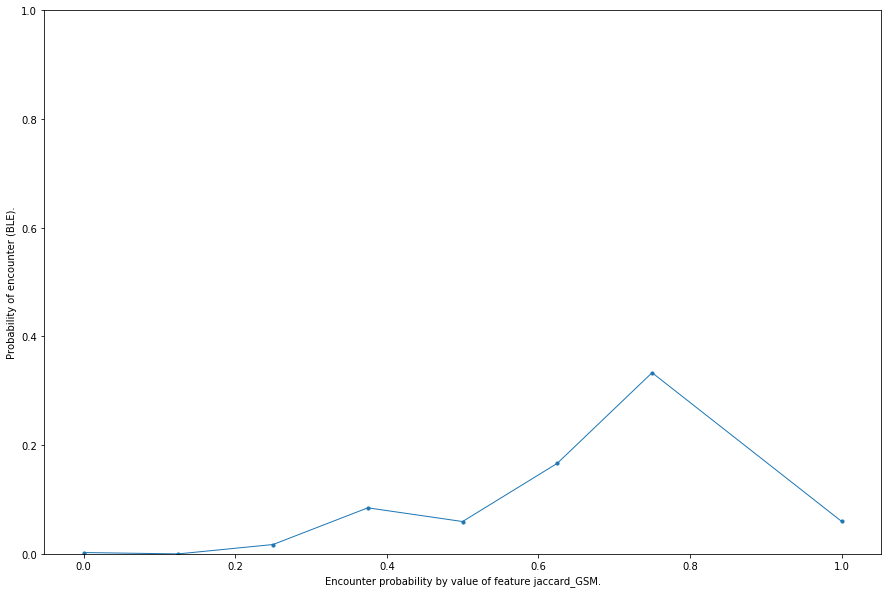

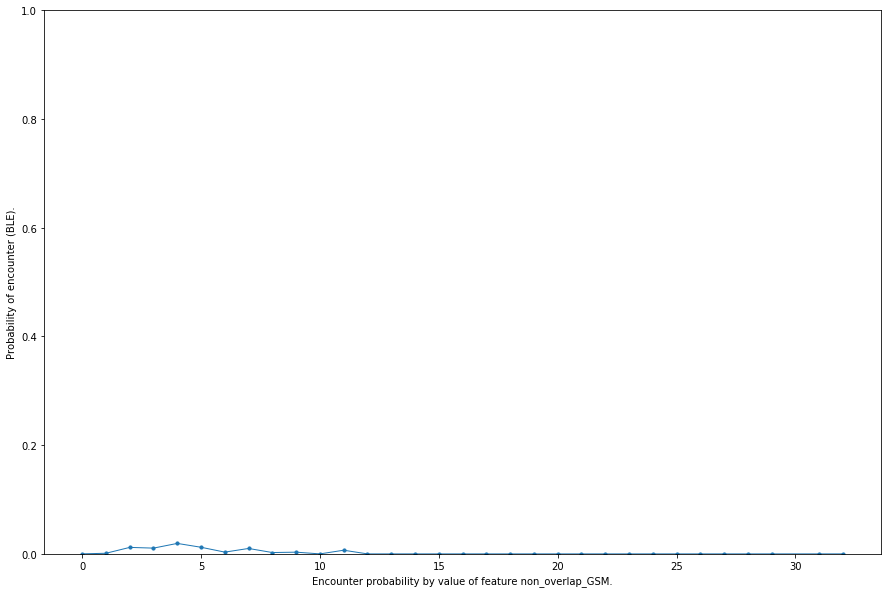

...

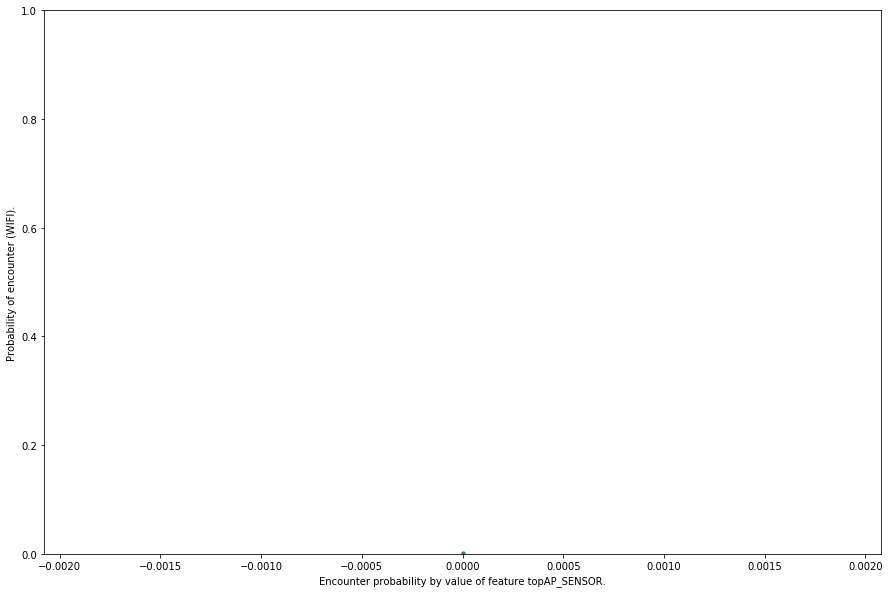

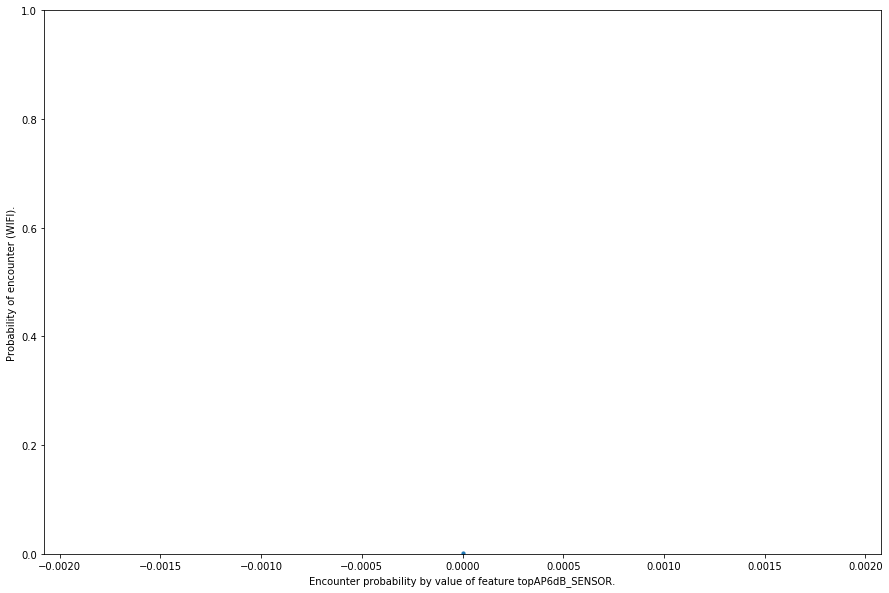

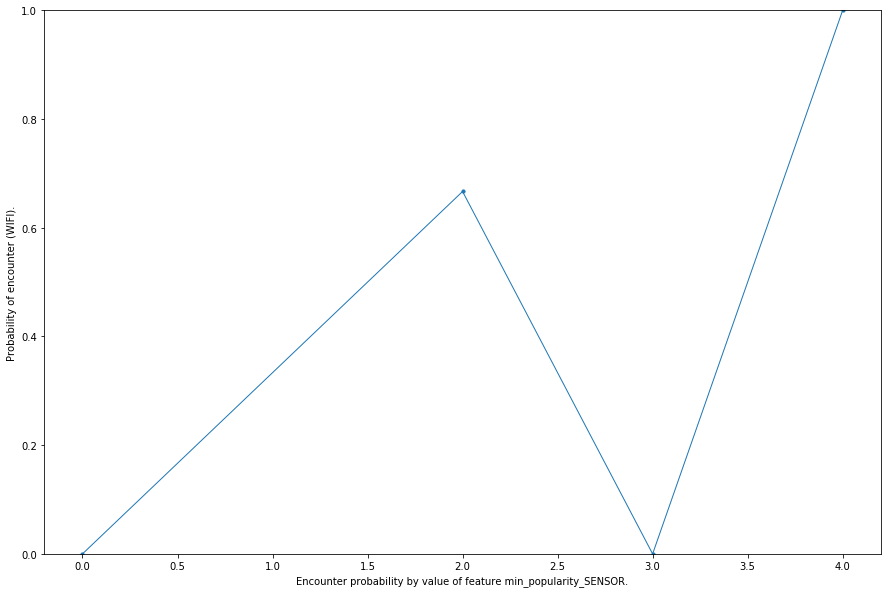

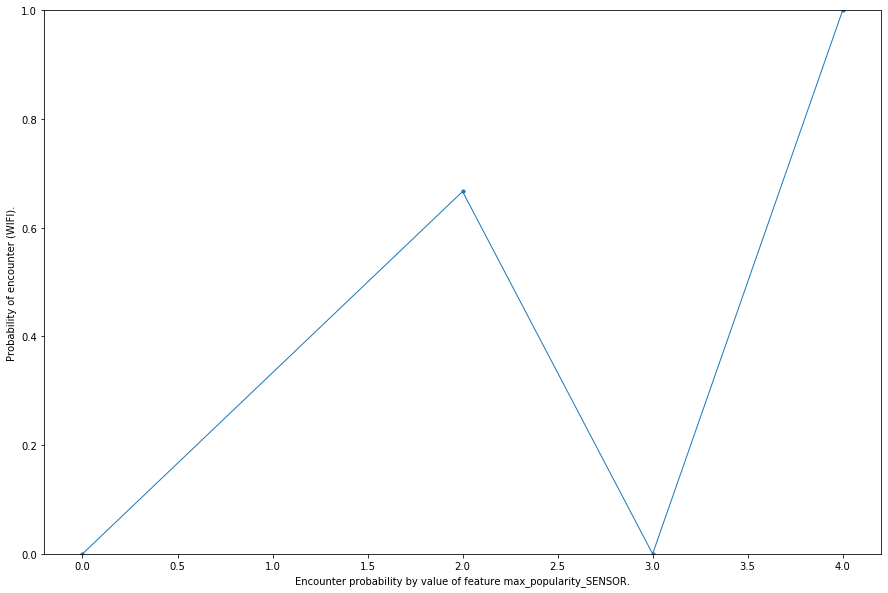

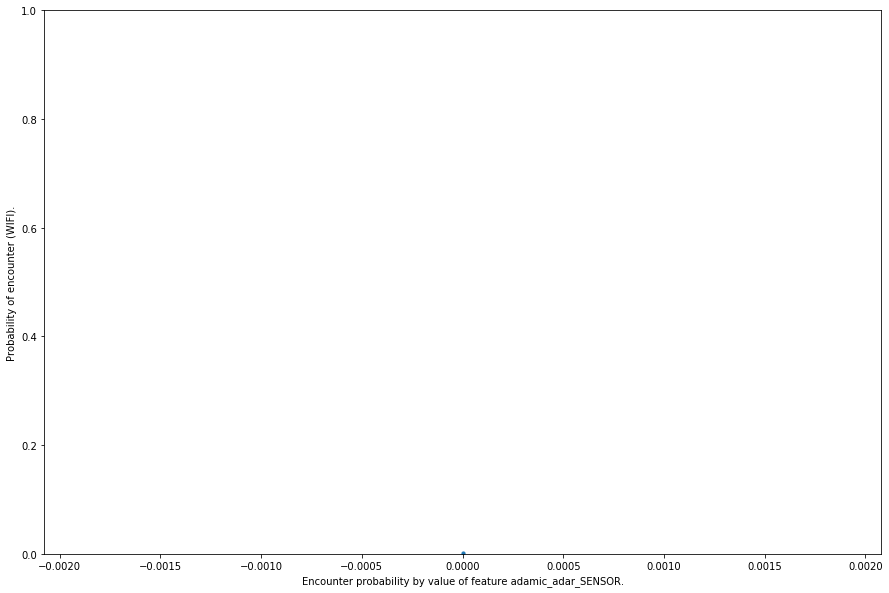

In [116]:
for gt in groundtruth:
    for ft in features:
        if gt != ft:
            # Buckets to compute encounter rate.
            encounter_rate_data = experiment_all_rounded.filter(regex='_'+ft +'|encounter_'+gt)
            encounter_rate_ticks = {}
            for c in encounter_rate_data.columns:
                c_min = encounter_rate_data[c].min()
                c_max = encounter_rate_data[c].max()
                c_filled = encounter_rate_data.shape[0] - encounter_rate_data[c].isna().sum()
                c_unique = encounter_rate_data[c].unique()
                c_unique = c_unique[~np.isnan(c_unique)]
                c_unique = np.sort(c_unique)
                tick = (c_max-c_min)/c_unique.shape[0]
                encounter_rate_ticks[c] = c_unique
            log('['+ gt + ' ~ ' + ft + '] Computed encounter rate ticks.')
            
            # Compute encounter rate per bucket.
            encounter_rate = {}
            encounter_rate_columns = encounter_rate_data.columns.tolist()
            encounter_rate_columns.remove('encounter_'+gt)
            for c in encounter_rate_columns:
                encounter_rate[c] = encounter_rate_data[
                    [c,'encounter_'+gt]
                ].groupby(c).mean().sort_values(by=c).values.flatten().tolist()
            log('['+ gt + ' ~ ' + ft + '] Computed encounter rates.')
                
            # Plotting.
            for c in encounter_rate_columns:
                c_x = encounter_rate_ticks[c]
                c_y = encounter_rate[c]

                fig, ax = plt.subplots()
                ax.scatter(c_x, c_y, s=10, marker='o')
                ax.plot(c_x, c_y, lw=1)
                ax.set_ylim(0,1)

                ax.set_xlabel('Encounter probability by value of feature ' + c + '.')
                ax.set_ylabel('Probability of encounter (' + gt + ').')

                fig.savefig(
                    os.path.join(
                        result_path,
                        'encounter_rate_plots',
                        'encounter_rate_all_'+ delta_string + '_' + gt + '~' + ft + '_' + c +'.pdf'),
                    format="pdf", bbox_inches="tight")
                plt.show()
            log('['+ gt + ' ~ ' + ft + '] Plotting done.')

log('Feature evaluation from original paper done.')

### 4.2.6 Random Forests

In [117]:
random_all_gt = 'BLE'
random_all_ft = 'WIFI'
random_all_features = [s+'_'+random_all_ft for s in experiment_features]

random_all_df = experiment_all_rounded[['encounter_'+random_all_gt]+random_all_features].copy()
random_all_df = random_all_df.dropna()

labels_all = np.array(random_all_df['encounter_'+random_all_gt])
features_all = np.array(random_all_df[random_all_features])

In [118]:
train_features_all, test_features_all, train_labels_all, test_labels_all = train_test_split(
    features_all, 
    labels_all, 
    test_size = 0.25, 
    random_state = 69)

print('Training Features Shape:', train_features_all.shape)
print('Training Labels Shape:', train_labels_all.shape)
print('Testing Features Shape:', test_features_all.shape)
print('Testing Labels Shape:', test_labels_all.shape)

Training Features Shape: (42287, 14)
Training Labels Shape: (42287,)
Testing Features Shape: (14096, 14)
Testing Labels Shape: (14096,)


Establish baseline: take most often observed encounter state. **(Obviously insanely good predictor, because not many encounters!)**

In [119]:
baseline_all = experiment_all_rounded['encounter_'+random_all_gt].mode().values[0]
baseline_error_all = abs(baseline_all-test_labels_all)
print('Average baseline error: ', round(np.mean(baseline_error_all), 10))

Average baseline error:  0.0016316686


In [120]:
rf_all = RandomForestRegressor(n_estimators = 1000, random_state = 69)
rf_all.fit(train_features_all, train_labels_all);

In [121]:
predictions_all = rf_all.predict(test_features_all)
error_all = abs(predictions_all - test_labels_all)
print('Mean Absolute Error:', round(np.mean(error_all), 10))

Mean Absolute Error: 0.0011782066


In [122]:
tree_all = rf_all.estimators_[5]
tree_all_path = os.path.join(result_path, 'tree_all.dot')
tree.export_graphviz(tree_all, out_file = tree_all_path, feature_names = random_all_features, rounded = True, precision = 5)
(graph_all, ) = pydot.graph_from_dot_file(tree_all_path)
graph_all.write_pdf(os.path.join(result_path, 'tree_all.pdf'))

In [124]:
importances_all = list(rf_all.feature_importances_)
feature_importances_all = [(feature, round(importance, 2)) for feature, importance in zip(random_all_features, importances_all)]
feature_importances_all = sorted(feature_importances_all, key = lambda x: x[1], reverse = True)
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances_all];

Variable: jaccard_WIFI         Importance: 0.27
Variable: adamic_adar_WIFI     Importance: 0.22
Variable: spearman_WIFI        Importance: 0.14
Variable: non_overlap_WIFI     Importance: 0.08
Variable: pearson_WIFI         Importance: 0.07
Variable: union_WIFI           Importance: 0.06
Variable: manhattan_WIFI       Importance: 0.05
Variable: max_popularity_WIFI  Importance: 0.05
Variable: overlap_WIFI         Importance: 0.04
Variable: euclidean_WIFI       Importance: 0.01
Variable: min_popularity_WIFI  Importance: 0.01
Variable: encounter_WIFI       Importance: 0.0
Variable: topAP_WIFI           Importance: 0.0
Variable: topAP6dB_WIFI        Importance: 0.0


In [175]:
accuracy_list_all = []
recall_list_all = []
precision_list_all = []
f1_list_all = []
roc_auc_list_all = []
roc_curve_list_all_tpr = []
roc_curve_list_all_fpr = []

kf = KFold(n_splits=10, shuffle=True)
for train, test in kf.split(features_all):
    rf_all = RandomForestClassifier(n_estimators = 1000, random_state = 69)
    rf_all.fit(features_all[train], labels_all[train])
    predictions_all = rf_all.predict(features_all[test])
    
    accuracy_list_all.append(accuracy_score(labels_all[test],predictions_all))
    f1_list_all.append(f1_score(labels_all[test],predictions_all))
    precision_list_all.append(precision_score(labels_all[test],predictions_all))
    recall_list_all.append(recall_score(labels_all[test],predictions_all))
    roc_auc_list_all.append(roc_auc_score(labels_all[test],predictions_all))
    fpr_all, tpr_all, _ = roc_curve(labels_all[test],predictions_all)
    roc_curve_list_all_fpr.append(fpr)
    roc_curve_list_all_tpr.append(tpr)

In [176]:
np.mean(accuracy_list_all)

0.9992018886610448

In [177]:
np.mean(f1_list_all)

0.7221667384902678

In [178]:
np.mean(recall_list_all)

0.688953823953824

In [179]:
np.mean(precision_list_all)

0.8016197691197691

In [180]:
np.mean(roc_auc_list_all)

0.8443259381865014

In [181]:
np.mean(roc_curve_list_all_fpr, axis=0)

array([0.00000000e+00, 1.77651448e-04, 1.00000000e+00])

In [182]:
np.mean(roc_curve_list_all_tpr, axis=0)

array([0.        , 0.66666667, 1.        ])

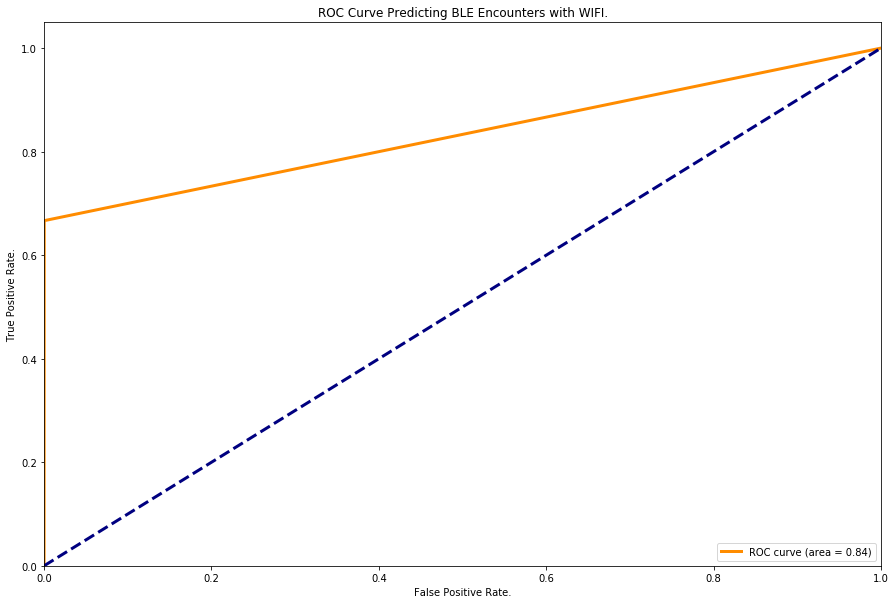

In [183]:
fig, ax = plt.subplots()

ax.plot(np.mean(roc_curve_list_all_fpr, axis=0), 
        np.mean(roc_curve_list_all_tpr, axis=0), 
        color='darkorange',
        label='ROC curve (area = %0.2f)' % np.mean(roc_auc_list_all))
ax.plot([0, 1], [0, 1], color='navy', linestyle='--')
ax.set_ylim(0,1.05)
ax.set_xlim(0,1)

ax.set_title('ROC Curve Predicting BLE Encounters with WIFI.')
ax.set_xlabel('False Positive Rate.')
ax.set_ylabel('True Positive Rate.')
ax.legend(loc="lower right")

fig.savefig(
    os.path.join(
        result_path,
        'roc_auc_curve_' + delta_string + '_BLE~WIFI.pdf'),
    format="pdf", 
    bbox_inches="tight")
plt.show()